## Imports

In [1]:
import argparse
import os
os.umask(0)
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["NUMEXPR_NUM_THREADS"] = "1"
os.environ["OMP_NUM_THREADS"] = "1"
import pickle as pkl
import sys
from importlib import import_module

import numpy as np
import torch
import math
from torch.utils.data import DataLoader, Sampler
from torch.utils.data.distributed import DistributedSampler
from tqdm import tqdm
from argoverse.map_representation.map_api import ArgoverseMap
from argoverse.data_loading.argoverse_forecasting_loader import ArgoverseForecastingLoader
from argoverse.visualization.visualize_sequences import viz_sequence

sys.path.insert(0, '/home/p6bhatta/SSL-Lanes/qualitative_analysis/LaneGCN/')

from data import ArgoTestDataset
from utils import Logger, load_pretrain

In [2]:
## map
am = ArgoverseMap()

##set root_dir to the correct path to your dataset folder
root_dir = '../LaneGCN/dataset/val/data/'
afl = ArgoverseForecastingLoader(root_dir)

afl.seq_list = sorted(afl.seq_list)

## Vis Utils

In [3]:
from collections import defaultdict
from typing import Dict, List, Optional

import matplotlib.lines as mlines
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.interpolate as interp

from argoverse.map_representation.map_api import ArgoverseMap

_ZORDER = {"AGENT": 15, "AV": 10, "OTHERS": 5}


def interpolate_polyline(polyline: np.ndarray, num_points: int) -> np.ndarray:
    duplicates = []
    for i in range(1, len(polyline)):
        if np.allclose(polyline[i], polyline[i - 1]):
            duplicates.append(i)
    if polyline.shape[0] - len(duplicates) < 4:
        return polyline
    if duplicates:
        polyline = np.delete(polyline, duplicates, axis=0)
    tck, u = interp.splprep(polyline.T, s=0)
    u = np.linspace(0.0, 1.0, num_points)
    return np.column_stack(interp.splev(u, tck))

def viz_sequence_mod(
    df: pd.DataFrame,
    agent_pred: None,
    gt_pred: None,
    lane_centerlines: Optional[List[np.ndarray]] = None,
    show: bool = True,
    smoothen: bool = False,
) -> None:

    # Seq data
    city_name = df["CITY_NAME"].values[0]

    if lane_centerlines is None:
        # Get API for Argo Dataset map
        avm = ArgoverseMap()
        seq_lane_props = avm.city_lane_centerlines_dict[city_name]

    plt.figure(0, figsize=(8, 7))

    x_min = min(df["X"])
    x_max = max(df["X"])
    y_min = min(df["Y"])
    y_max = max(df["Y"])

    if lane_centerlines is None:

        plt.xlim(x_min, x_max)
        plt.ylim(y_min, y_max)

        lane_centerlines = []
        # Get lane centerlines which lie within the range of trajectories
        for lane_id, lane_props in seq_lane_props.items():

            lane_cl = lane_props.centerline

            if (
                np.min(lane_cl[:, 0]) < x_max
                and np.min(lane_cl[:, 1]) < y_max
                and np.max(lane_cl[:, 0]) > x_min
                and np.max(lane_cl[:, 1]) > y_min
            ):
                lane_centerlines.append(lane_cl)

    for lane_cl in lane_centerlines:
        plt.plot(
            lane_cl[:, 0],
            lane_cl[:, 1],
            "--",
            color="grey",
            alpha=1,
            linewidth=1,
            zorder=0,
        )
    frames = df.groupby("TRACK_ID")

    plt.xlabel("Map X")
    plt.ylabel("Map Y")

    color_dict = {"AGENT": "goldenrod", "OTHERS": "#d3e8ef", "AV": "blue"}#007672"}
    object_type_tracker: Dict[int, int] = defaultdict(int)

    # Plot all the tracks up till current frame
    for ii, (group_name, group_data) in enumerate(frames):
        object_type = group_data["OBJECT_TYPE"].values[0]
    
        cor_x = group_data["X"].values
        cor_y = group_data["Y"].values

        if smoothen:
            polyline = np.column_stack((cor_x, cor_y))
            num_points = cor_x.shape[0] * 3
            smooth_polyline = interpolate_polyline(polyline, num_points)
            cor_x = smooth_polyline[:, 0]
            cor_y = smooth_polyline[:, 1]

        if object_type == "AGENT":
            plt.plot(
            cor_x,
            cor_y,
            "-",
            color=color_dict[object_type],
            label=object_type if not object_type_tracker[object_type] else "",
            alpha=1,
            linewidth=3,
            zorder=_ZORDER[object_type],)

        final_x = cor_x[-1]
        final_y = cor_y[-1]

        if object_type == "AGENT":
            marker_type = "o"
            marker_size = 7
        elif object_type == "OTHERS":
            marker_type = "o"
            marker_size = 7
        elif object_type == "AV":
            marker_type = "o"
            marker_size = 7

        plt.plot(
            final_x,
            final_y,
            marker_type,
            color=color_dict[object_type],
            label=object_type if not object_type_tracker[object_type] else "",
            alpha=1,
            markersize=marker_size,
            zorder=_ZORDER[object_type],
        )

        object_type_tracker[object_type] += 1

    red_star = mlines.Line2D([], [], color="red", marker="*", linestyle="None", markersize=7, label="Agent")
    green_circle = mlines.Line2D(
        [],
        [],
        color="green",
        marker="o",
        linestyle="None",
        markersize=7,
        label="Others",
    )
    black_triangle = mlines.Line2D([], [], color="black", marker="^", linestyle="None", markersize=7, label="AV")

    plt.axis("off")
    
    object_type = "AGENT"
    color_agent = "green"
    for iii in range(6):
        plt.plot(agent_pred[iii, :, 0], agent_pred[iii, :, 1], 
            "-",
            color=color_agent,
            label=object_type if not object_type_tracker[object_type] else "",
            alpha=1,
            linewidth=3,
            zorder=_ZORDER[object_type],)

        marker_type = "o"
        marker_size = 7
        plt.plot(
            agent_pred[iii, -1, 0],
            agent_pred[iii, -1, 1],
            marker_type,
            color=color_agent,
            label=object_type if not object_type_tracker[object_type] else "",
            alpha=1,
            markersize=marker_size,
            zorder=_ZORDER[object_type],
        )
    
    plt.plot(gt_pred[:, 0], gt_pred[:, 1], 
            "-",
            color='mediumvioletred',
            label=object_type if not object_type_tracker[object_type] else "",
            alpha=1,
            linewidth=2,
            zorder=_ZORDER[object_type],)

    marker_type = "o"
    marker_size = 6
    plt.plot(
        gt_pred[-1, 0],
        gt_pred[-1, 1],
        marker_type,
        color='mediumvioletred',
        label=object_type if not object_type_tracker[object_type] else "",
        alpha=0.5,
        markersize=marker_size,
        zorder=_ZORDER[object_type],
    )
    
    plt.show()

## FDE Utils

In [4]:
def get_fde(forecasted_trajectory: np.ndarray, gt_trajectory: np.ndarray) -> float:
    """Compute Final Displacement Error.
    Args:
        forecasted_trajectory: Predicted trajectory with shape (pred_len x 2)
        gt_trajectory: Ground truth trajectory with shape (pred_len x 2)
    Returns:
        fde: Final Displacement Error
    """
    fde = math.sqrt(
        (forecasted_trajectory[-1, 0] - gt_trajectory[-1, 0]) ** 2
        + (forecasted_trajectory[-1, 1] - gt_trajectory[-1, 1]) ** 2
    )
    return fde

def get_min_fde(v, pruned_trajectories):
    curr_min_fde = float("inf")
    for j in range(len(pruned_trajectories)):
        fde = get_fde(pruned_trajectories[j], v)
        if fde < curr_min_fde:
            min_idx = j
            curr_min_fde = fde
    return curr_min_fde

## Load pickle and find failures

In [5]:
with open("preds_base.p", "rb") as input_file:
    preds = pkl.load(input_file)
with open("gts_base.p", "rb") as input_file:
    gts = pkl.load(input_file)
    
ii = 0
fail_ids_base = []
for argo_idx, output_trajs in preds.items():
    ii += 1
    gt_traj = gts[argo_idx].numpy()
    min_fde = get_min_fde(gt_traj, output_trajs)
    if min_fde > 5:
        #print(argo_idx)
        fail_ids_base.append(argo_idx)

In [6]:
with open("preds_mask.p", "rb") as input_file:
    preds_mask = pkl.load(input_file)
with open("gts_mask.p", "rb") as input_file:
    gts_mask = pkl.load(input_file)
    
ii = 0
fail_ids_mask = []
for argo_idx, output_trajs in preds_mask.items():
    ii += 1
    gt_traj = gts_mask[argo_idx].numpy()
    min_fde = get_min_fde(gt_traj, output_trajs)
    if min_fde > 2:
        #print(argo_idx)
        fail_ids_mask.append(argo_idx)

In [8]:
with open("preds_intersection.p", "rb") as input_file:
    preds_intersection = pkl.load(input_file)
with open("gts_intersection.p", "rb") as input_file:
    gts_intersection = pkl.load(input_file)
    
ii = 0
fail_ids_intersection = []
for argo_idx, output_trajs in preds_intersection.items():
    ii += 1
    gt_traj = gts_intersection[argo_idx].numpy()
    min_fde = get_min_fde(gt_traj, output_trajs)
    if min_fde > 2:
        #print(argo_idx)
        fail_ids_intersection.append(argo_idx)

In [10]:
with open("preds_successfail.p", "rb") as input_file:
    preds_successfail = pkl.load(input_file)
with open("gts_successfail.p", "rb") as input_file:
    gts_successfail = pkl.load(input_file)
    
ii = 0
fail_ids_successfail = []
for argo_idx, output_trajs in preds_successfail.items():
    ii += 1
    gt_traj = gts_successfail[argo_idx].numpy()
    min_fde = get_min_fde(gt_traj, output_trajs)
    if min_fde > 2:
        #print(argo_idx)
        fail_ids_successfail.append(argo_idx)

In [12]:
with open("preds_maneuver.p", "rb") as input_file:
    preds_maneuver = pkl.load(input_file)
with open("gts_maneuver.p", "rb") as input_file:
    gts_maneuver = pkl.load(input_file)
    
ii = 0
fail_ids_maneuver = []
for argo_idx, output_trajs in preds_maneuver.items():
    ii += 1
    gt_traj = gts_maneuver[argo_idx].numpy()
    min_fde = get_min_fde(gt_traj, output_trajs)
    if min_fde > 2:
        #print(argo_idx)
        fail_ids_maneuver.append(argo_idx)

## Final visuals

## Task 1

In [16]:
lanemask_success_ids = []
for ids in fail_ids_base:
    if ids in fail_ids_maneuver: 
        if ids in fail_ids_intersection:
            if ids in fail_ids_successfail:
                if ids not in fail_ids_mask:
                    lanemask_success_ids.append(ids)
print(lanemask_success_ids)

[14171, 18785, 19088, 19822, 21076, 21368, 21897, 24143, 24867, 26416, 27016, 2863, 33716, 38026, 38494, 39628, 40073, 5, 6061, 8552, 9838]


14171
--fail baseline


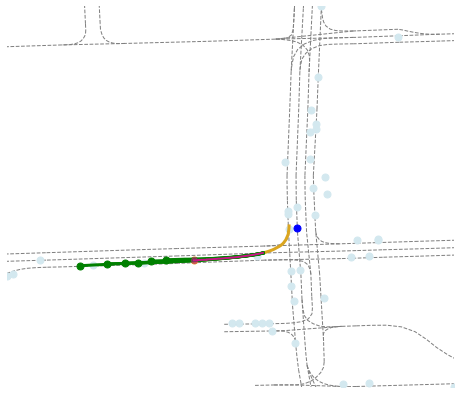

--success mask


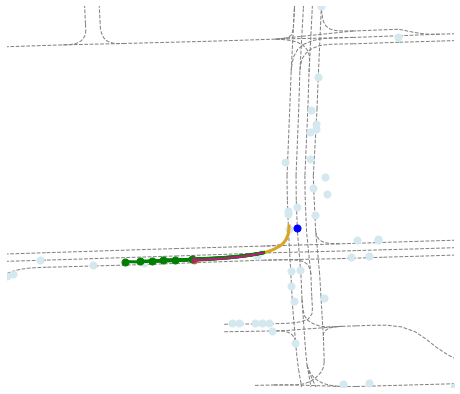

--fail intersection


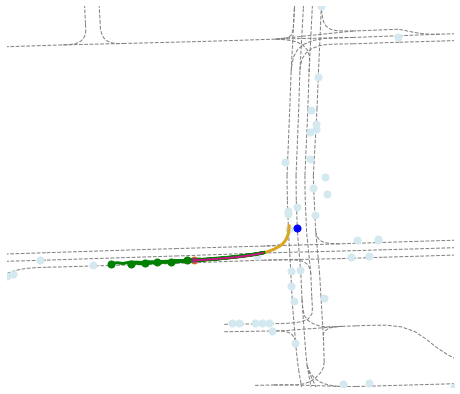

--fail successorfail


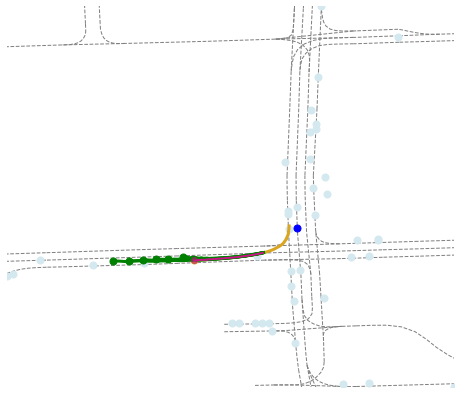

--fail maneuver


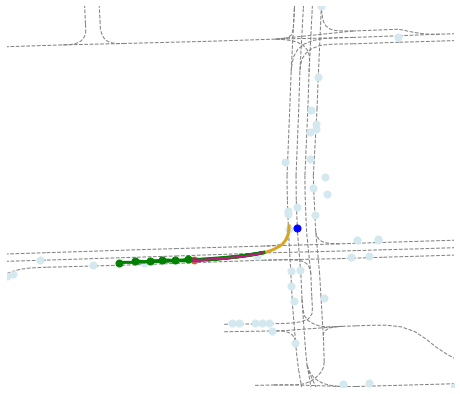





18785
--fail baseline


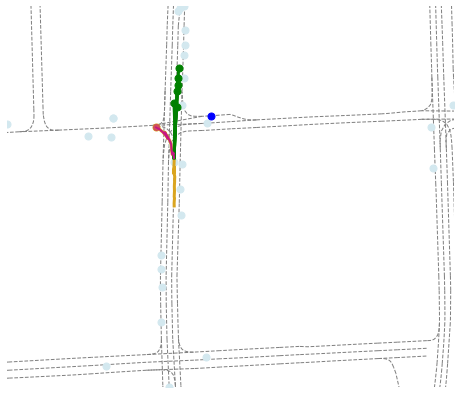

--success mask


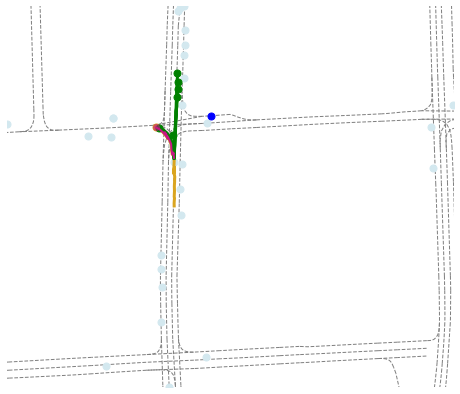

--fail intersection


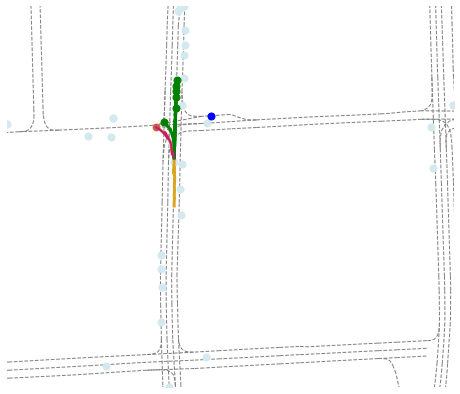

--fail successorfail


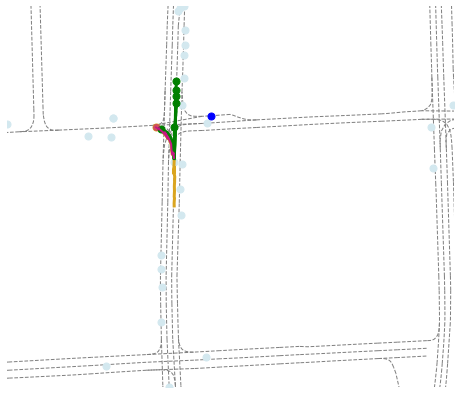

--fail maneuver


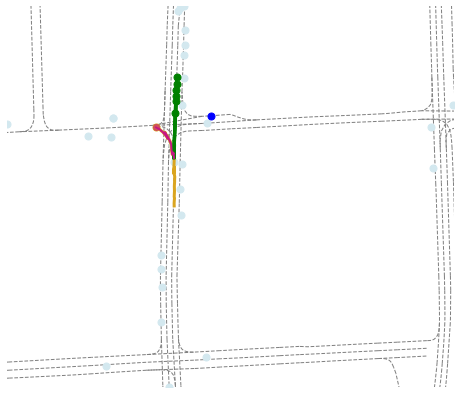





19088
--fail baseline


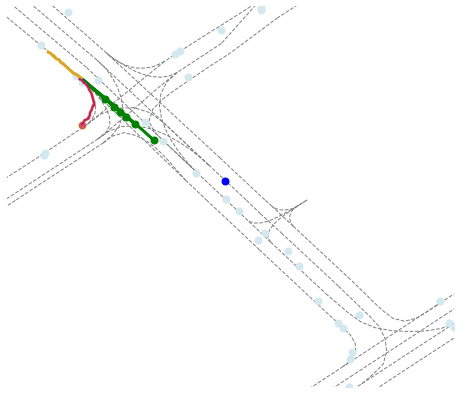

--success mask


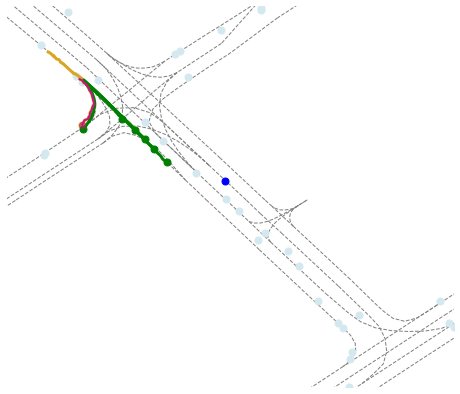

--fail intersection


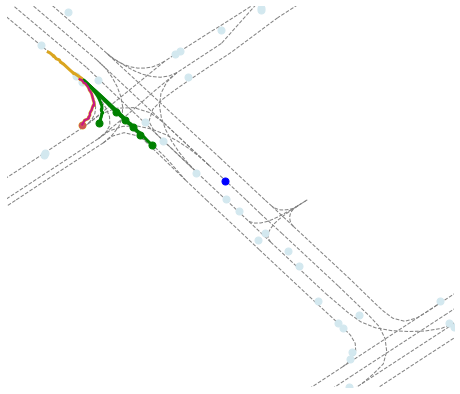

--fail successorfail


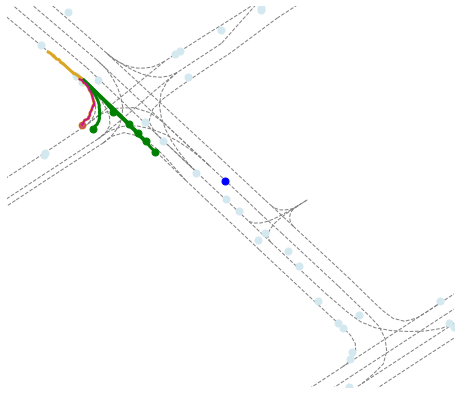

--fail maneuver


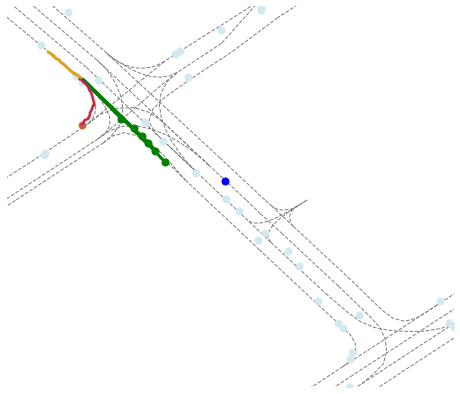





19822
--fail baseline


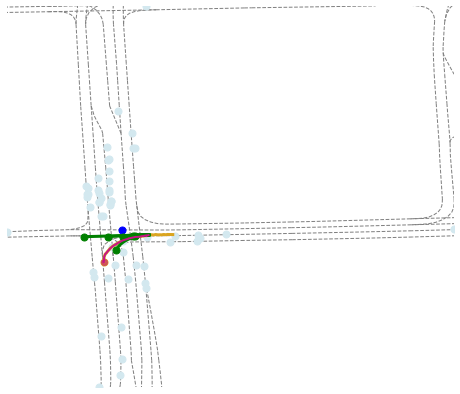

--success mask


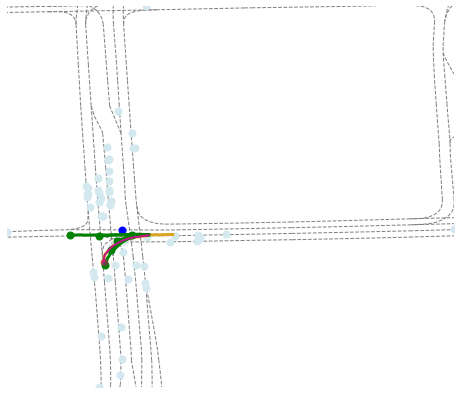

--fail intersection


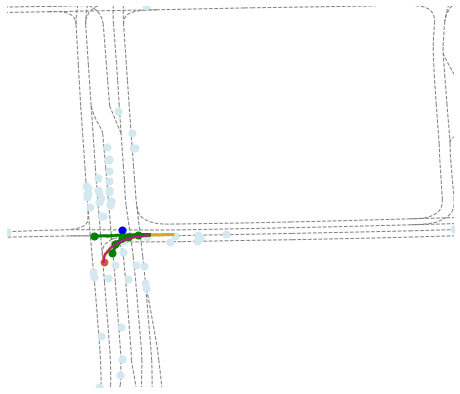

--fail successorfail


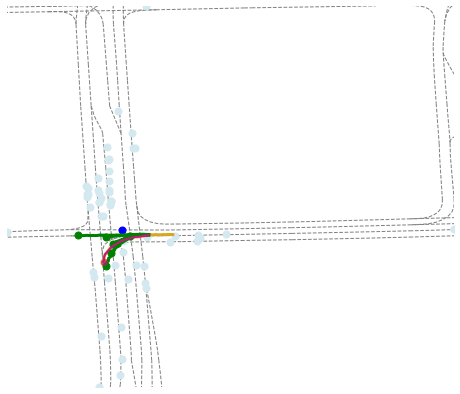

--fail maneuver


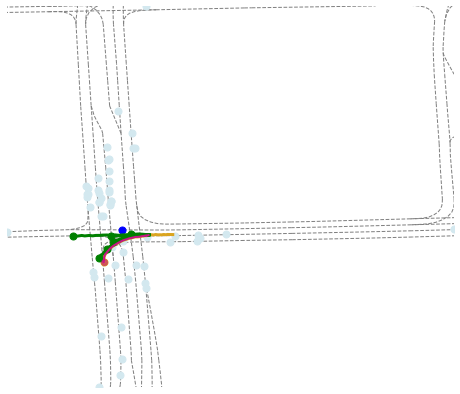





21076
--fail baseline


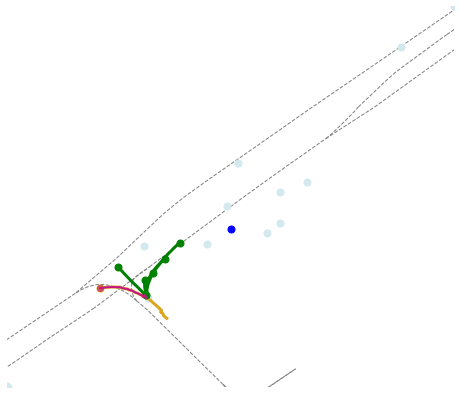

--success mask


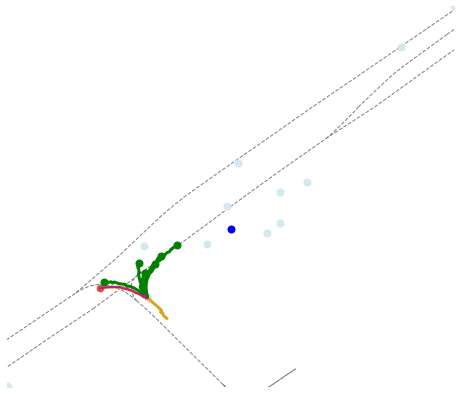

--fail intersection


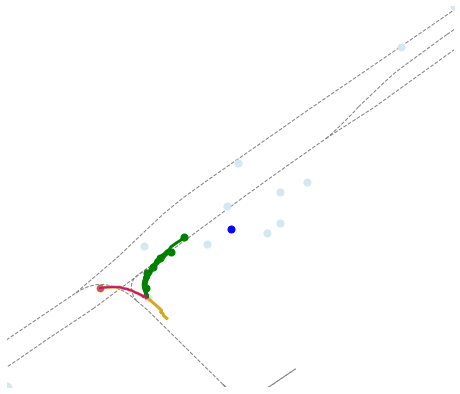

--fail successorfail


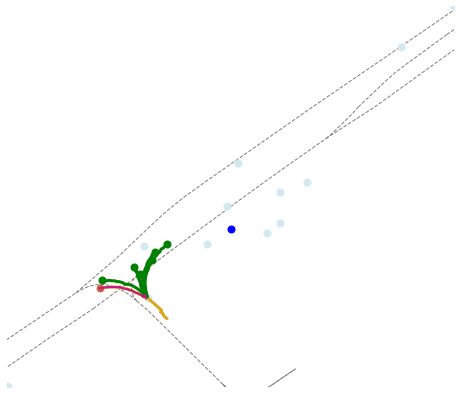

--fail maneuver


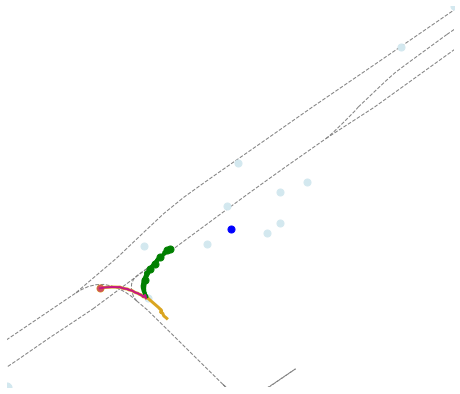





21368
--fail baseline


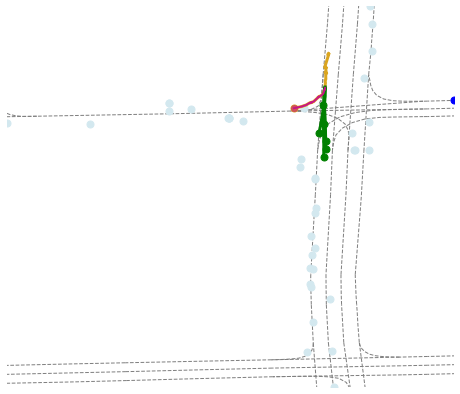

--success mask


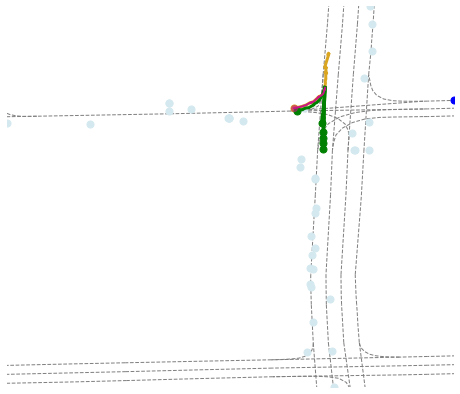

--fail intersection


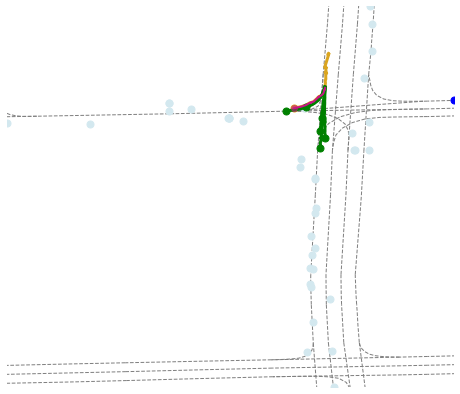

--fail successorfail


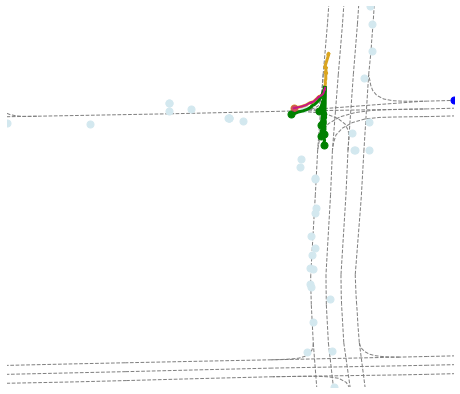

--fail maneuver


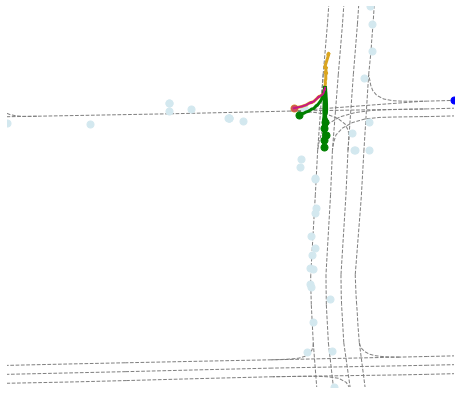





21897
--fail baseline


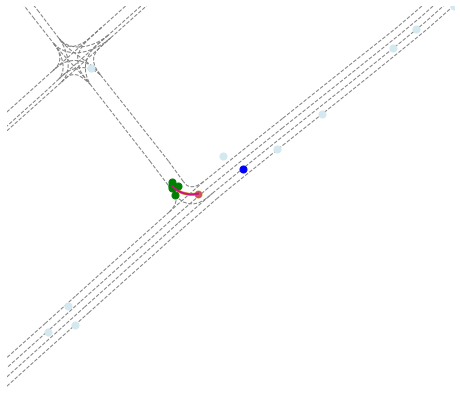

--success mask


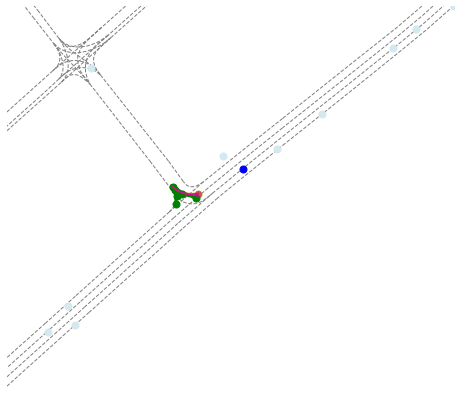

--fail intersection


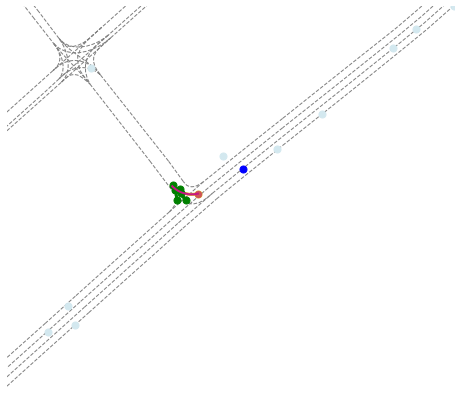

--fail successorfail


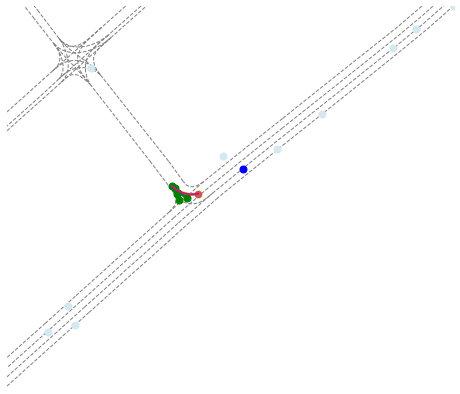

--fail maneuver


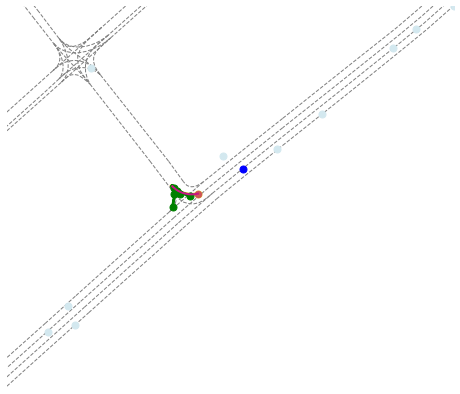





24143
--fail baseline


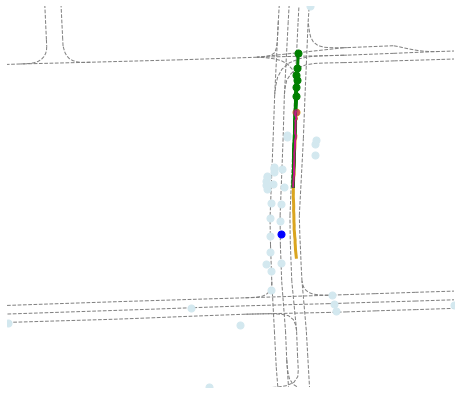

--success mask


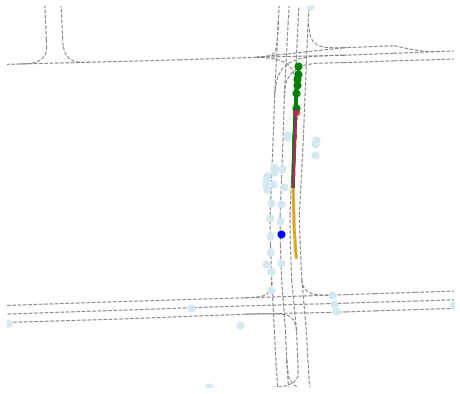

--fail intersection


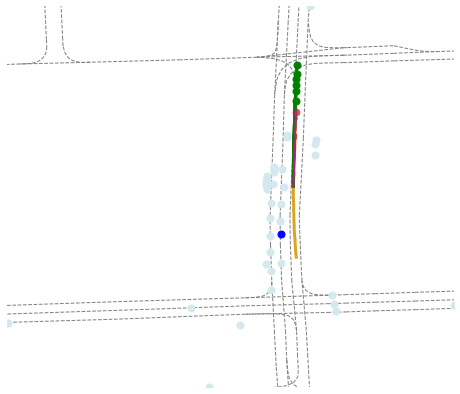

--fail successorfail


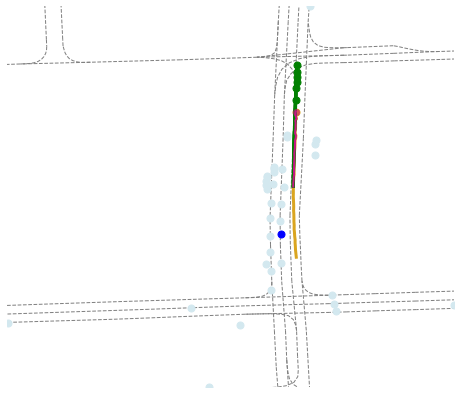

--fail maneuver


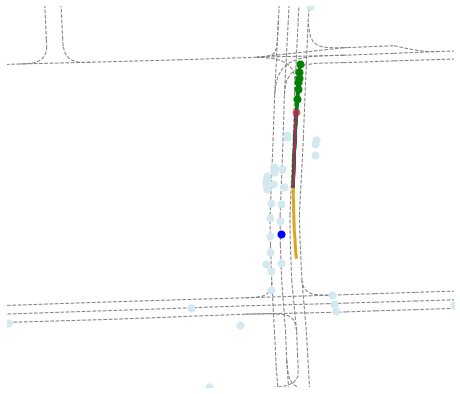





24867
--fail baseline


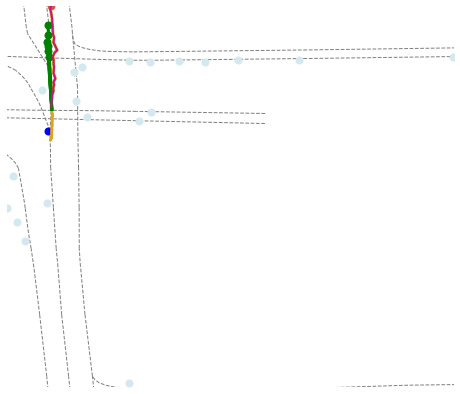

--success mask


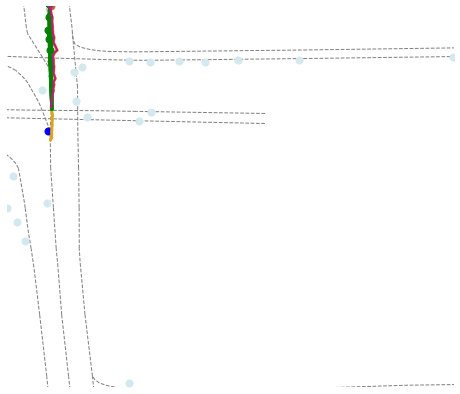

--fail intersection


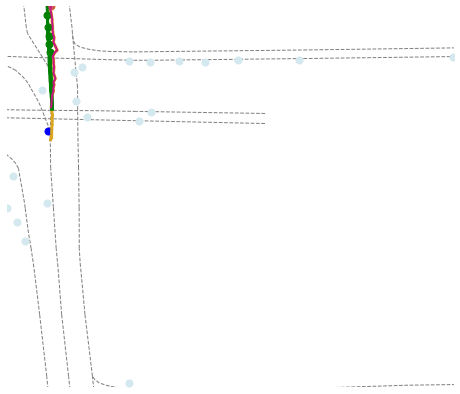

--fail successorfail


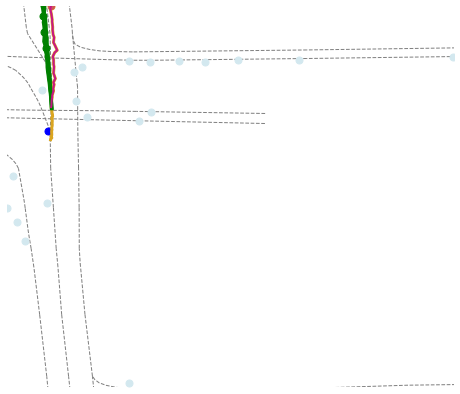

--fail maneuver


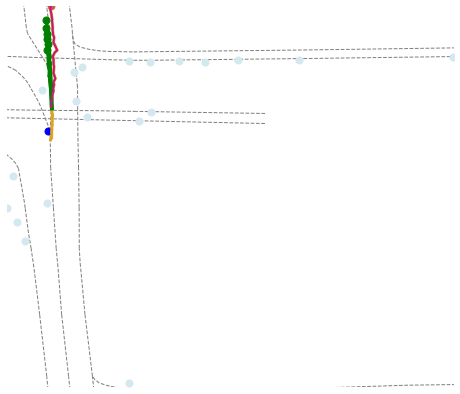





26416
--fail baseline


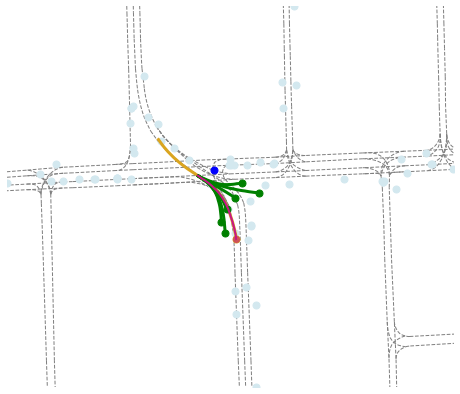

--success mask


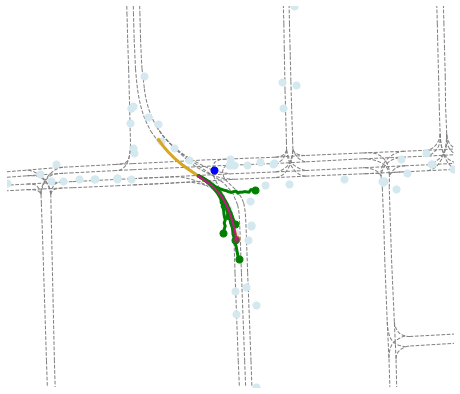

--fail intersection


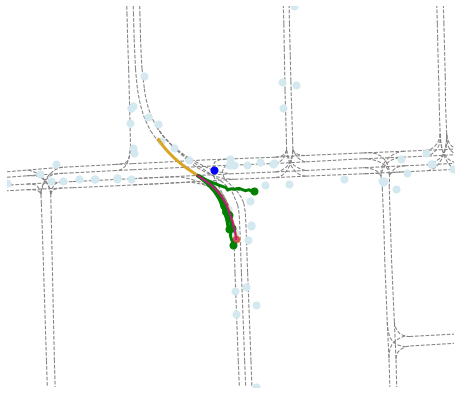

--fail successorfail


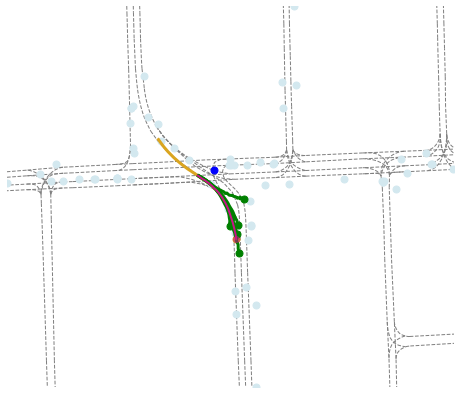

--fail maneuver


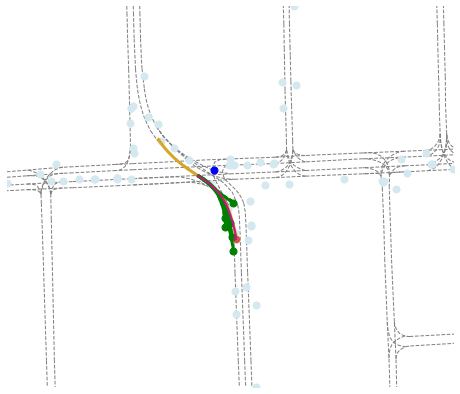





27016
--fail baseline


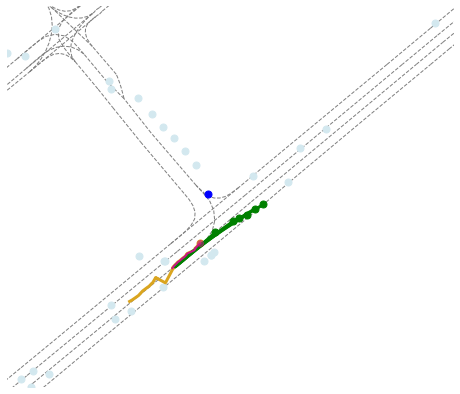

--success mask


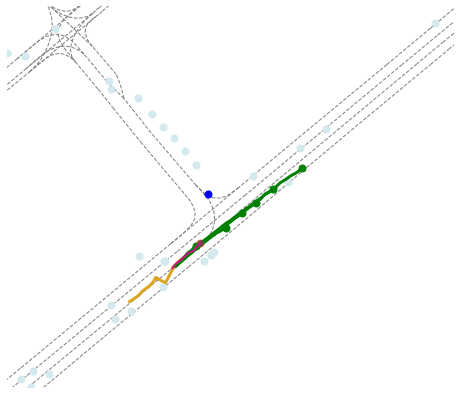

--fail intersection


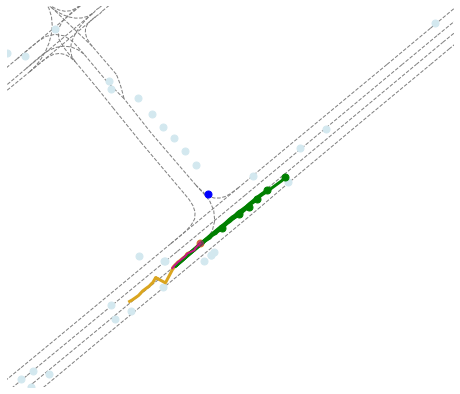

--fail successorfail


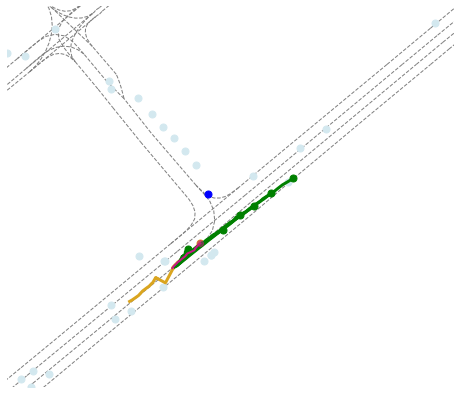

--fail maneuver


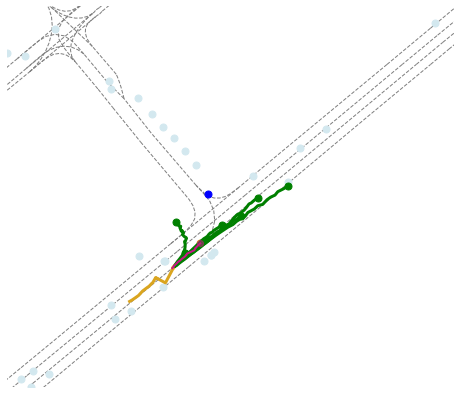





2863
--fail baseline


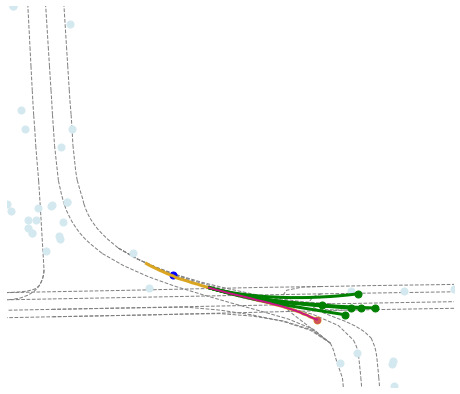

--success mask


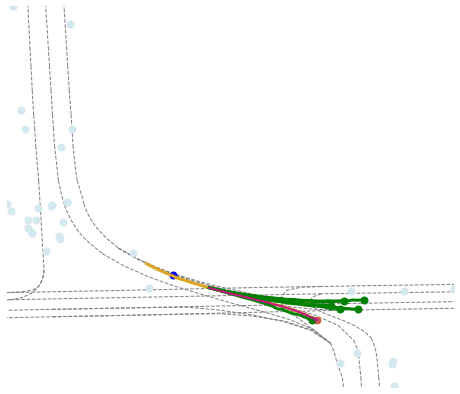

--fail intersection


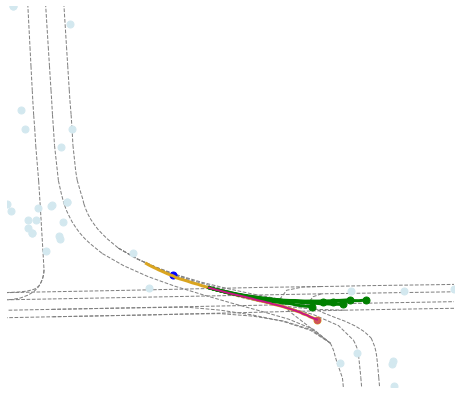

--fail successorfail


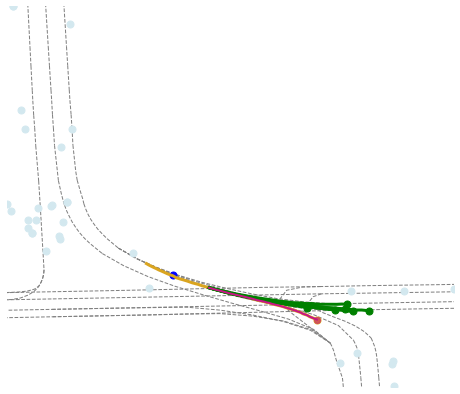

--fail maneuver


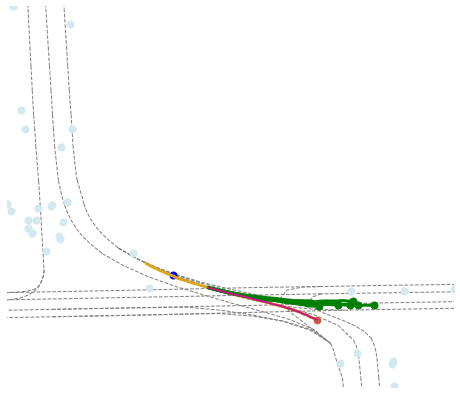





33716
--fail baseline


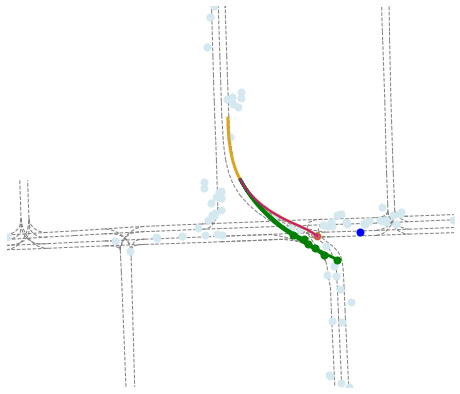

--success mask


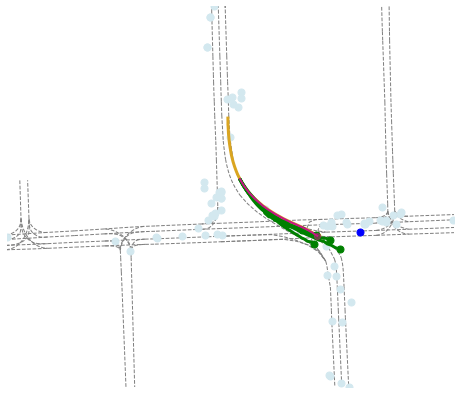

--fail intersection


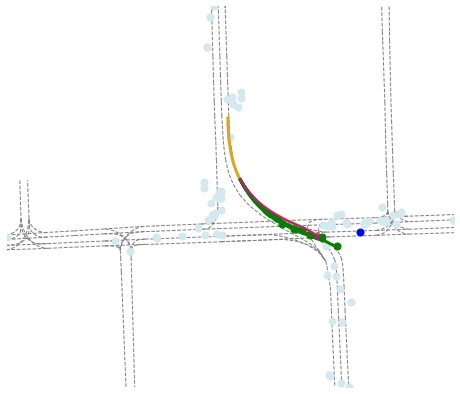

--fail successorfail


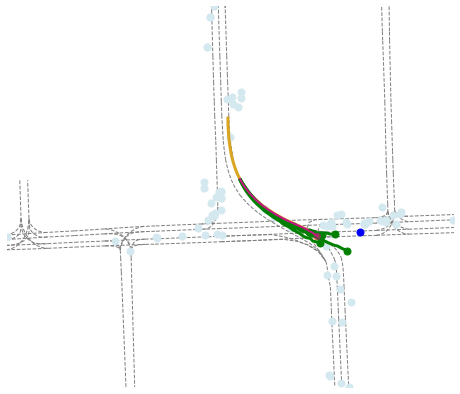

--fail maneuver


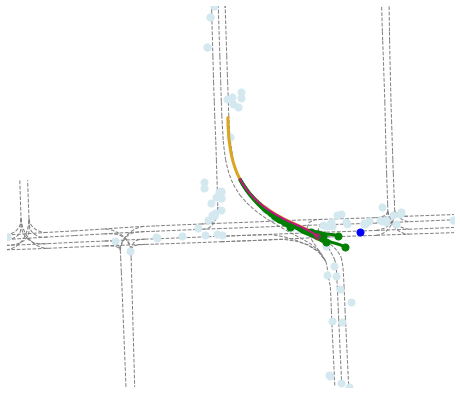





38026
--fail baseline


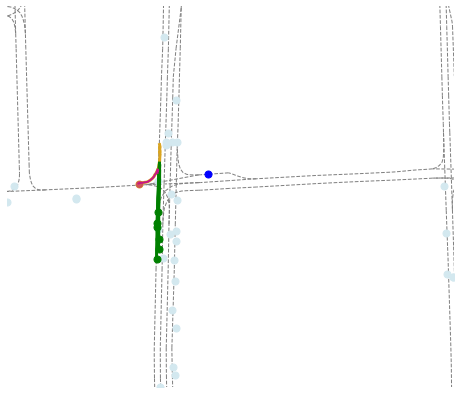

--success mask


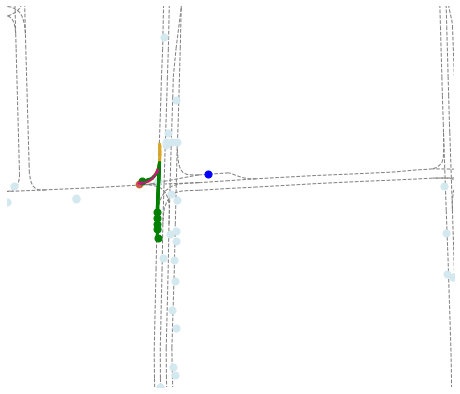

--fail intersection


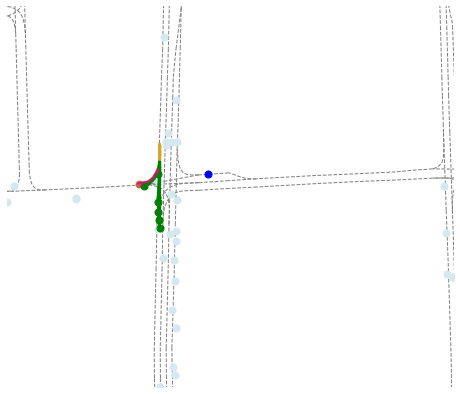

--fail successorfail


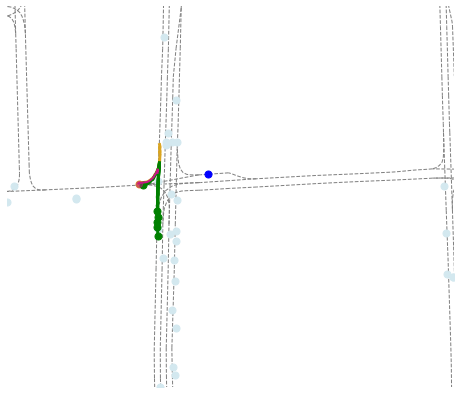

--fail maneuver


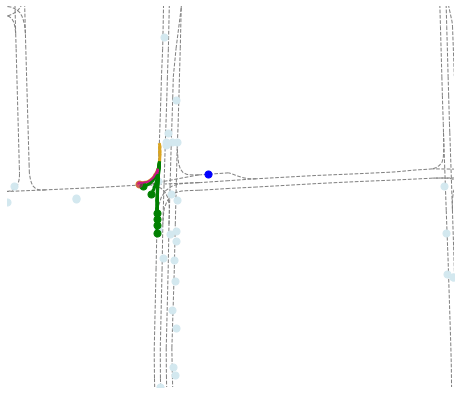





38494
--fail baseline


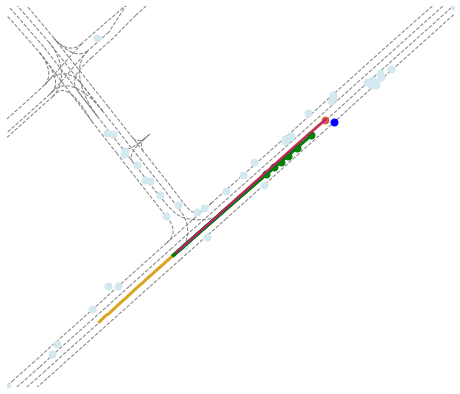

--success mask


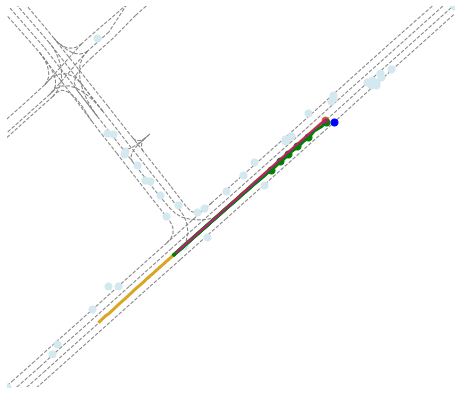

--fail intersection


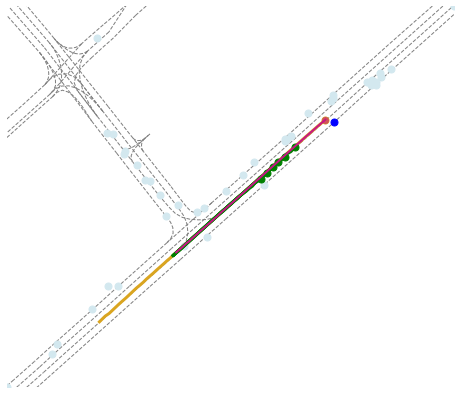

--fail successorfail


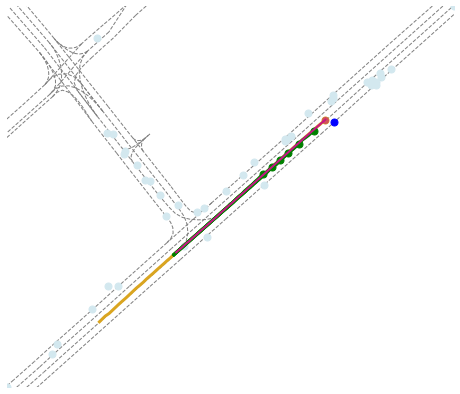

--fail maneuver


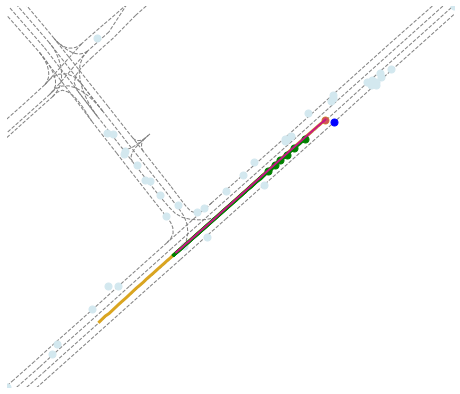

In [18]:
for l in range(min(len(lanemask_success_ids), 15)):
    #rand_idx = np.random.randint(0, len(lanemask_success_ids))
    argo_idx = lanemask_success_ids[l]#[rand_idx]
    print(argo_idx)
    
    seq_path = f"{root_dir}/"+str(argo_idx)+".csv"
    print('--fail baseline')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds[argo_idx], gts[argo_idx].numpy(), show=True)
    print('--success mask')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_mask[argo_idx], gts_mask[argo_idx].numpy(), show=True)
    print('--fail intersection')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_intersection[argo_idx], gts_intersection[argo_idx].numpy(), show=True)
    print('--fail successorfail')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_successfail[argo_idx], gts_successfail[argo_idx].numpy(), show=True)
    print('--fail maneuver')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_maneuver[argo_idx], gts_maneuver[argo_idx].numpy(), show=True)
    print("\n\n\n")
    #fig.savefig("cca-similarity.png",bbox_inches = 'tight')

## Task 2

In [19]:
intersection_success_ids = []
for ids in fail_ids_base:
    if ids in fail_ids_mask:
        if ids in fail_ids_maneuver: 
            if ids in fail_ids_successfail:
                if ids not in fail_ids_intersection:
                    intersection_success_ids.append(ids)
print(intersection_success_ids)

[17208, 19137, 198, 21089, 22563, 22956, 23969, 25463, 27667, 29112, 33277, 34717, 34998, 36400, 40255, 4617, 5840, 6115, 6672, 8225, 9254]


17208
--fail baseline


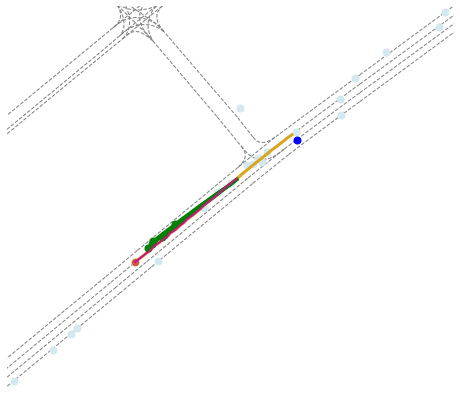

--fail mask


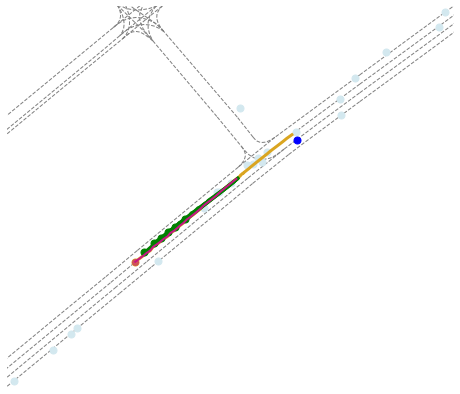

--success intersection


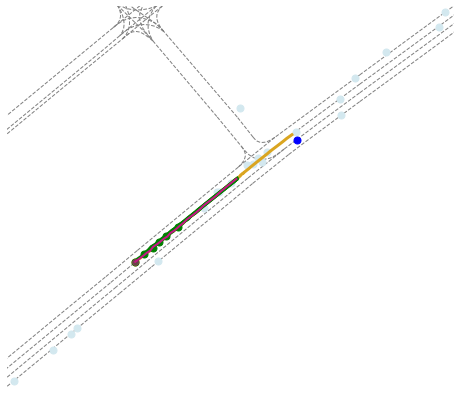

--fail successorfail


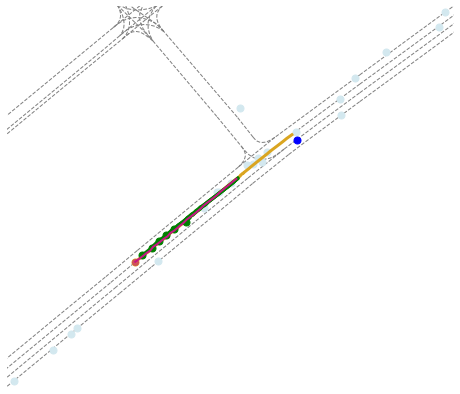

--fail maneuver


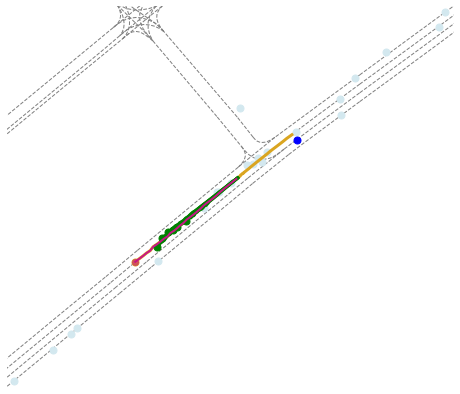





19137
--fail baseline


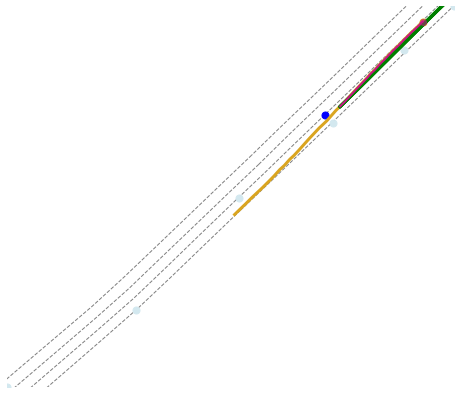

--fail mask


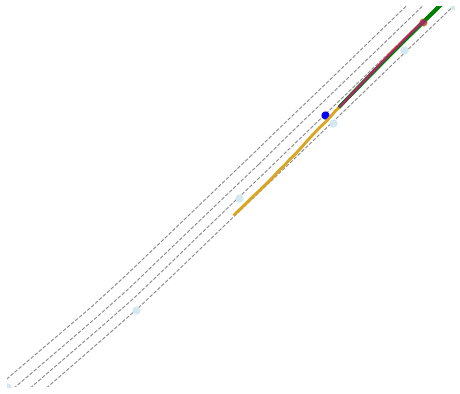

--success intersection


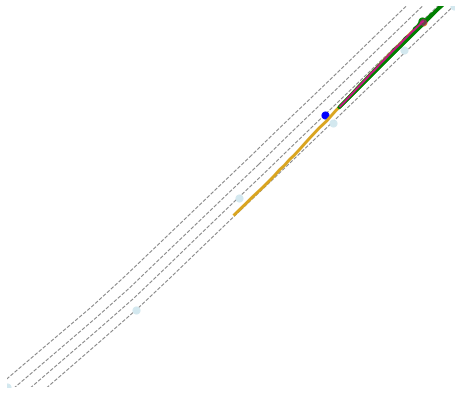

--fail successorfail


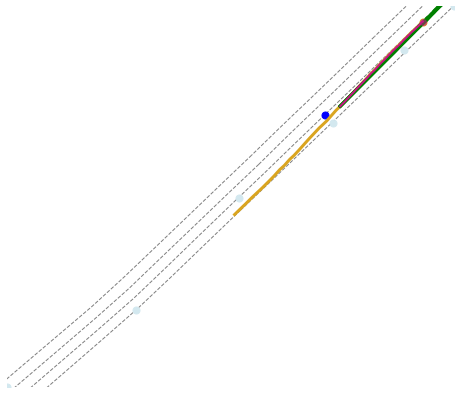

--fail maneuver


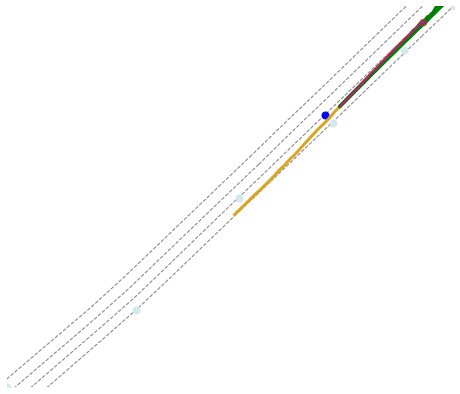





198
--fail baseline


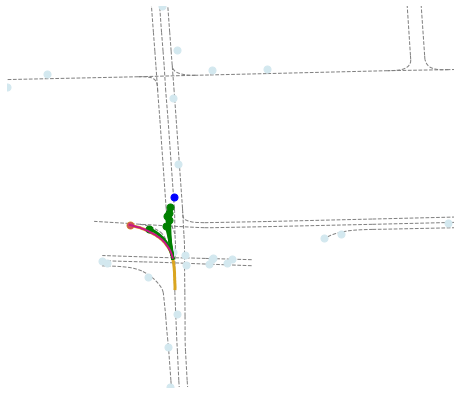

--fail mask


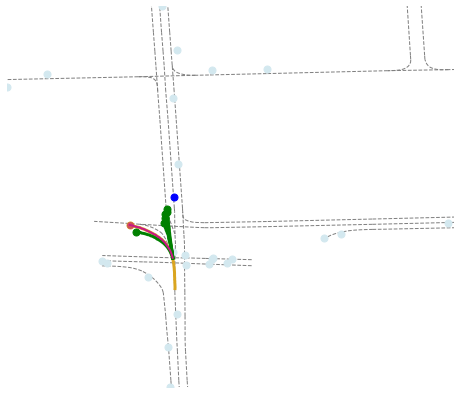

--success intersection


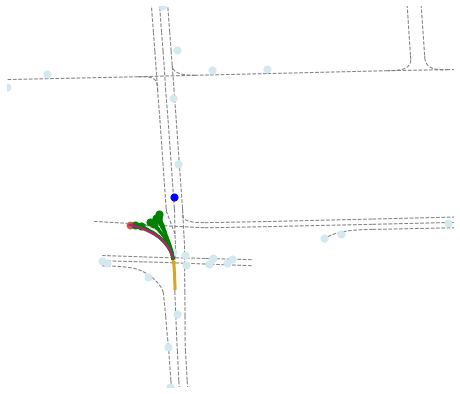

--fail successorfail


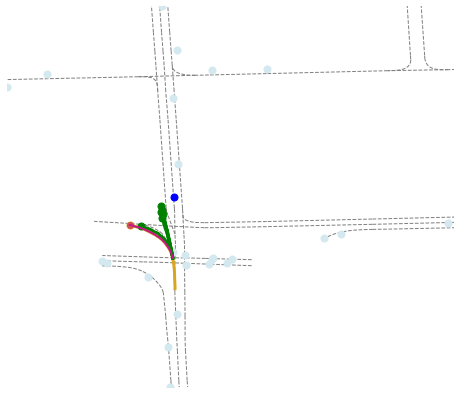

--fail maneuver


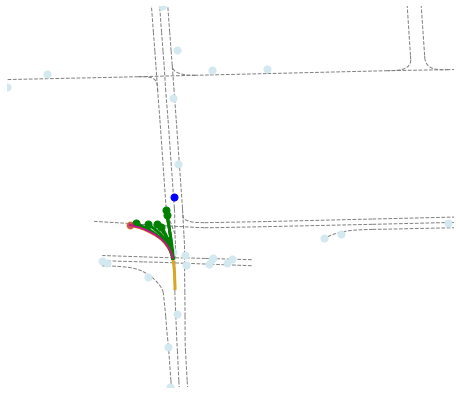





21089
--fail baseline


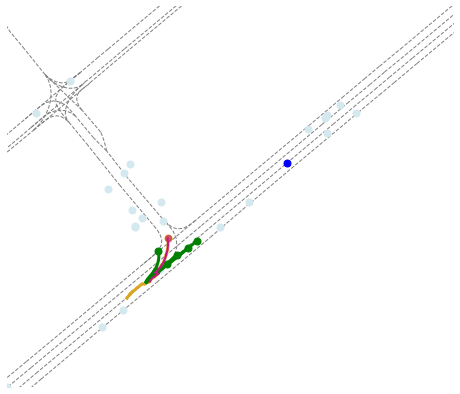

--fail mask


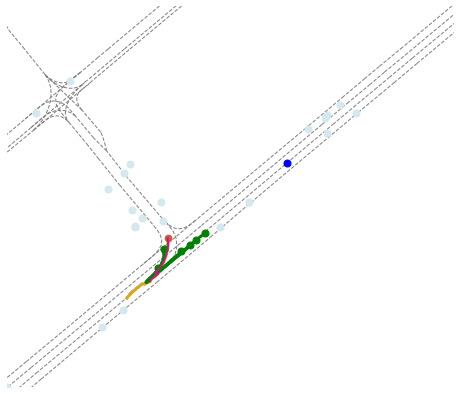

--success intersection


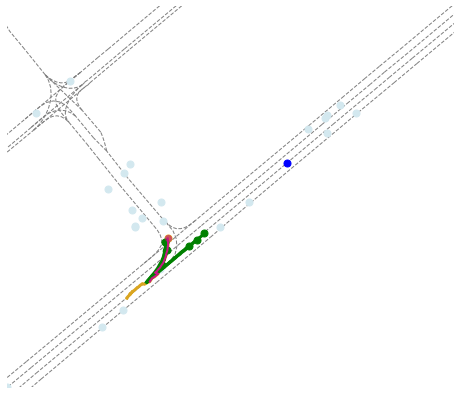

--fail successorfail


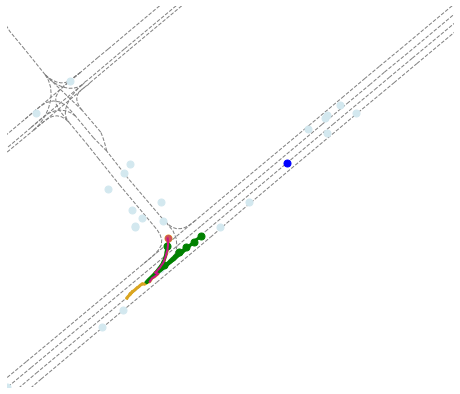

--fail maneuver


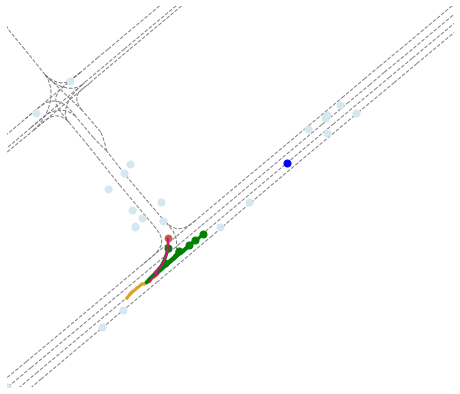





22563
--fail baseline


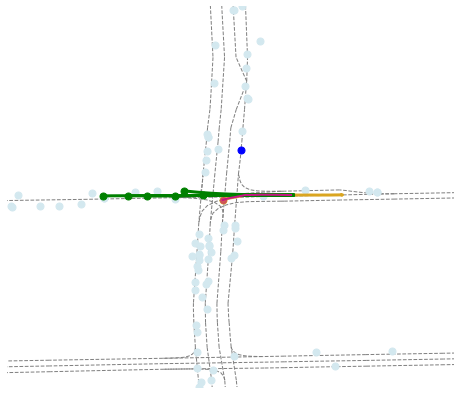

--fail mask


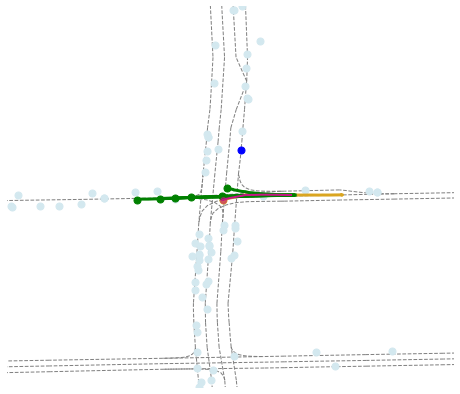

--success intersection


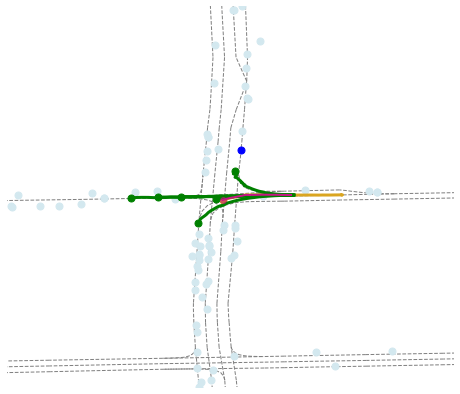

--fail successorfail


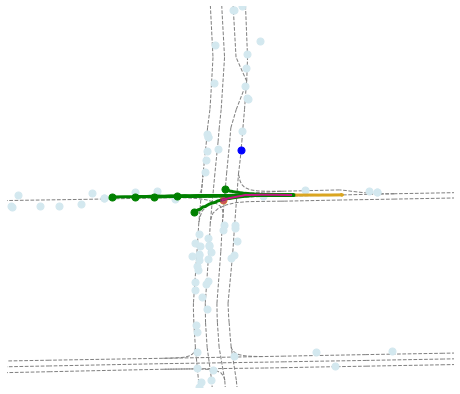

--fail maneuver


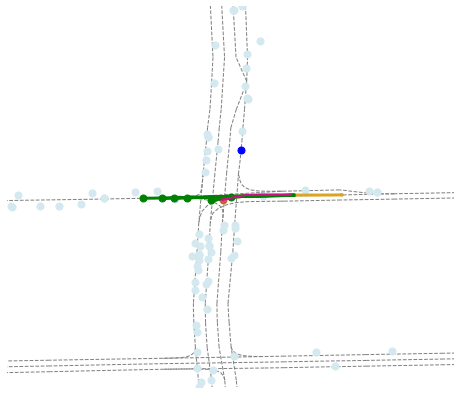





22956
--fail baseline


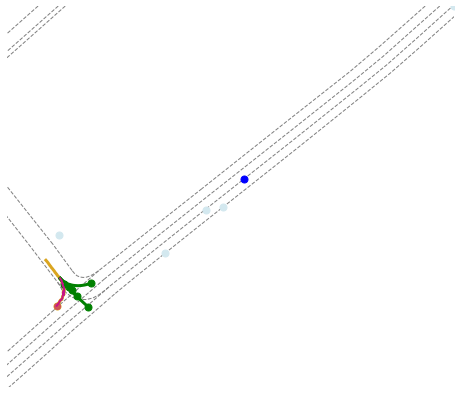

--fail mask


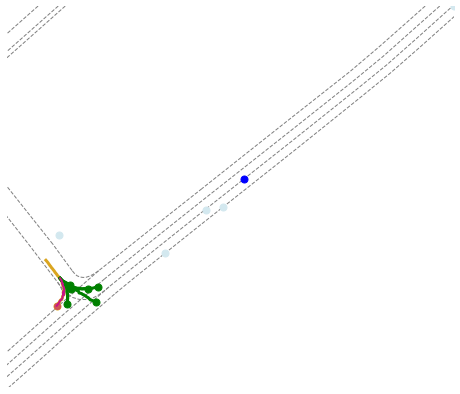

--success intersection


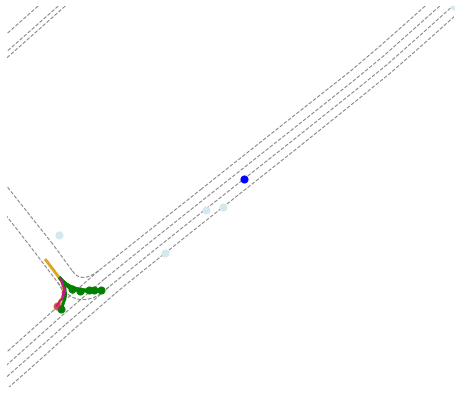

--fail successorfail


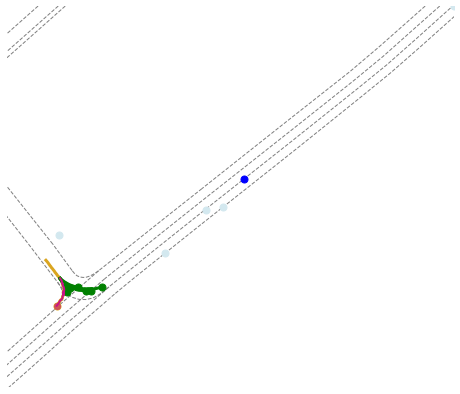

--fail maneuver


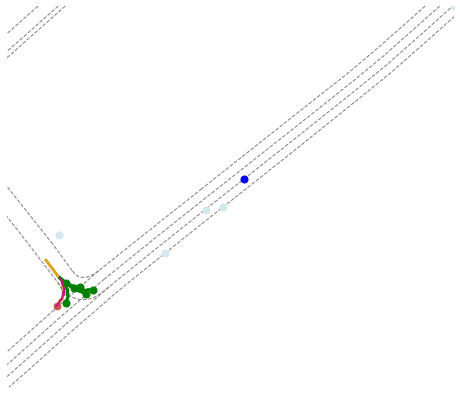





23969
--fail baseline


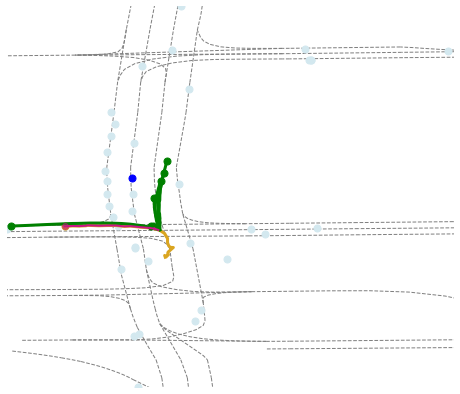

--fail mask


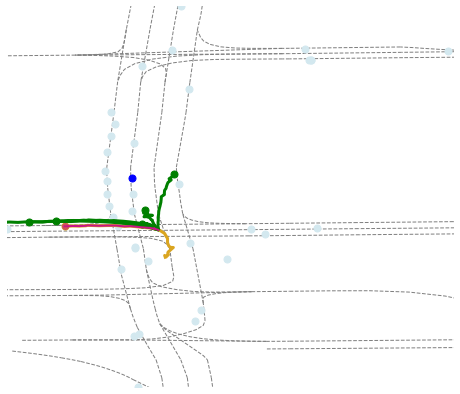

--success intersection


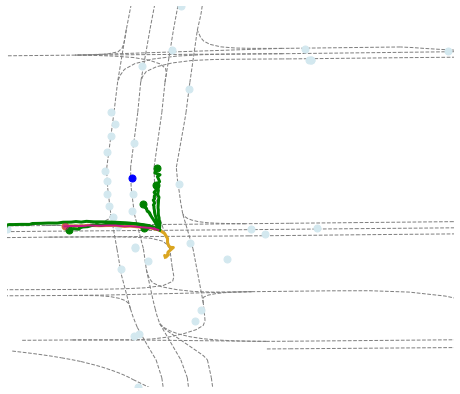

--fail successorfail


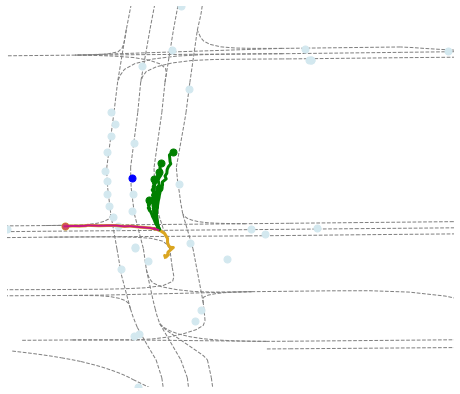

--fail maneuver


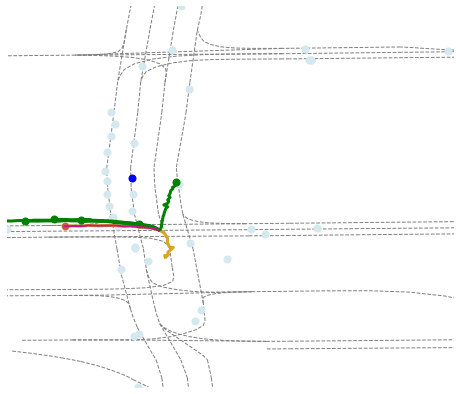





25463
--fail baseline


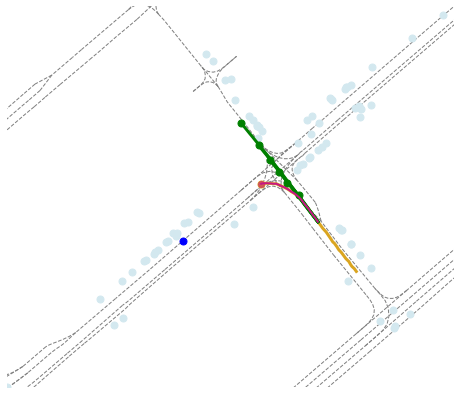

--fail mask


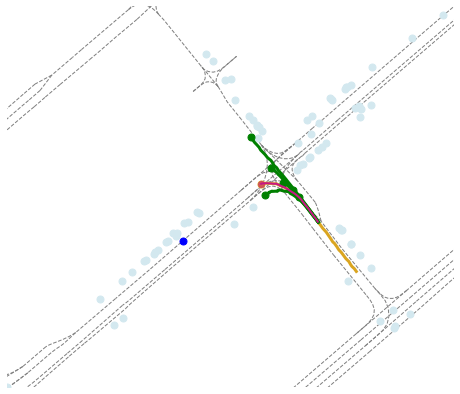

--success intersection


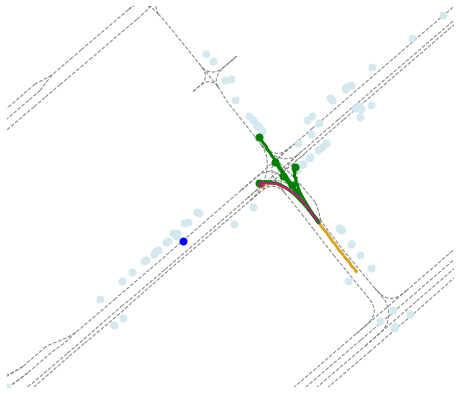

--fail successorfail


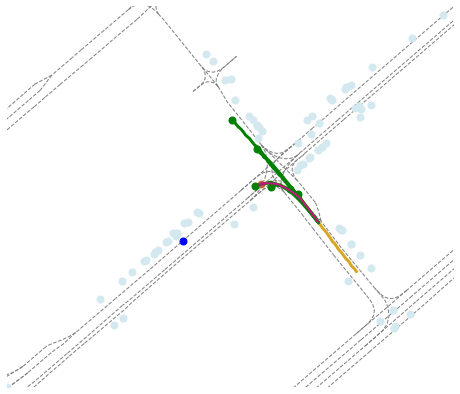

--fail maneuver


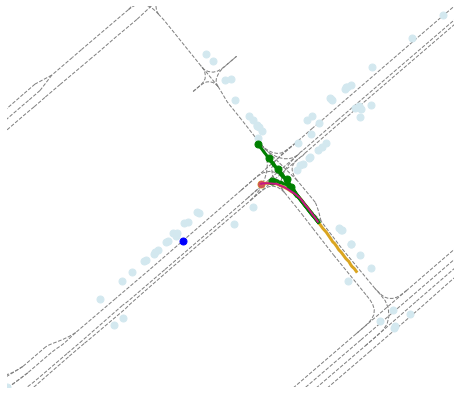





27667
--fail baseline


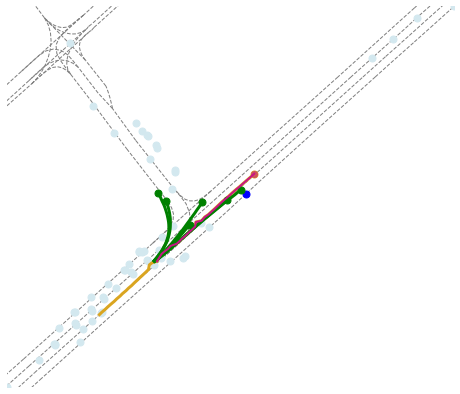

--fail mask


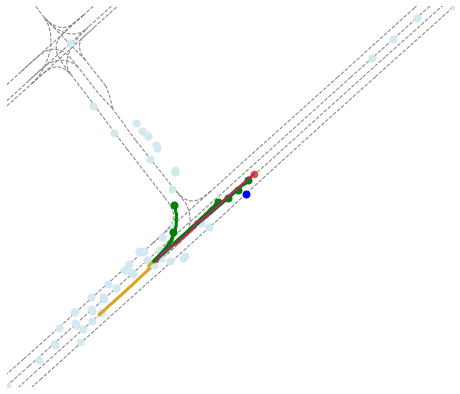

--success intersection


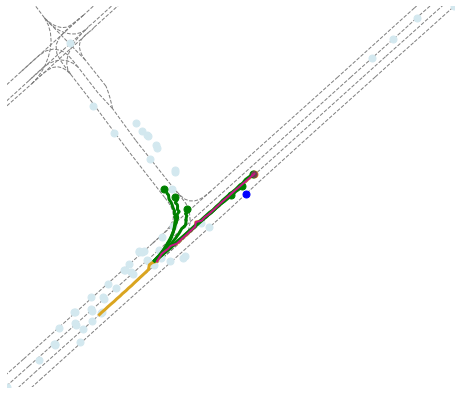

--fail successorfail


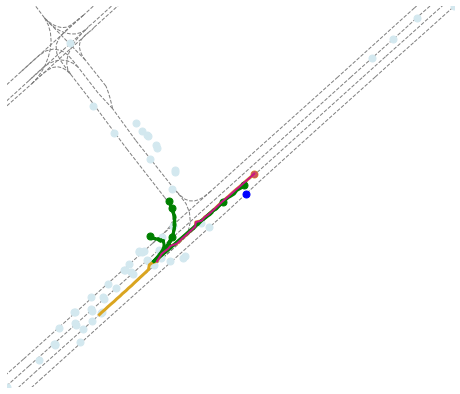

--fail maneuver


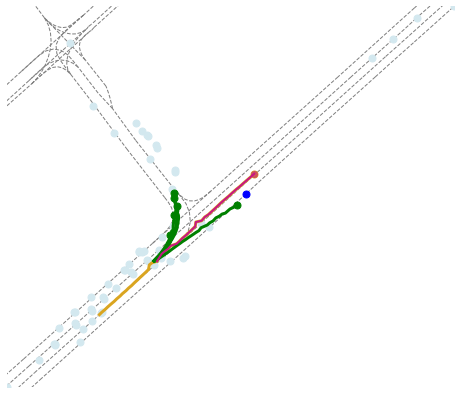





29112
--fail baseline


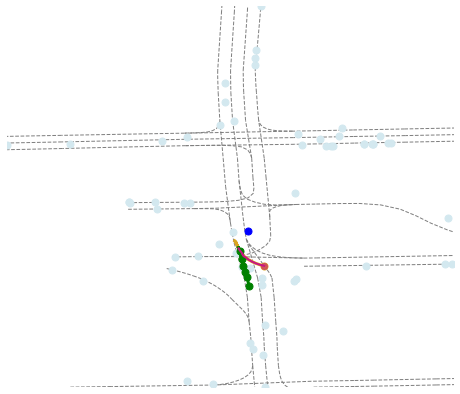

--fail mask


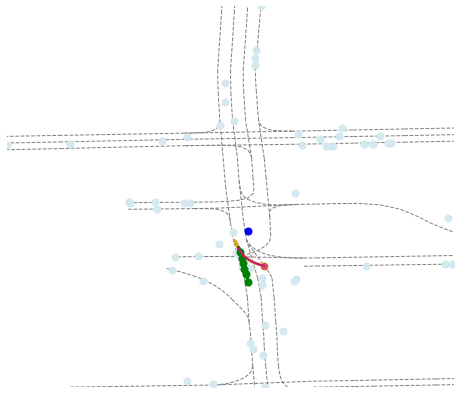

--success intersection


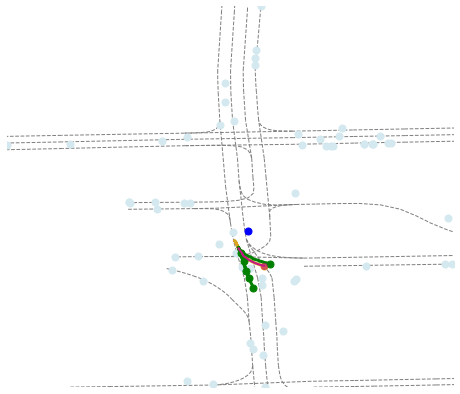

--fail successorfail


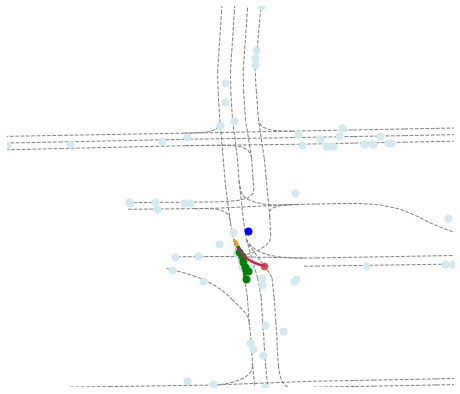

--fail maneuver


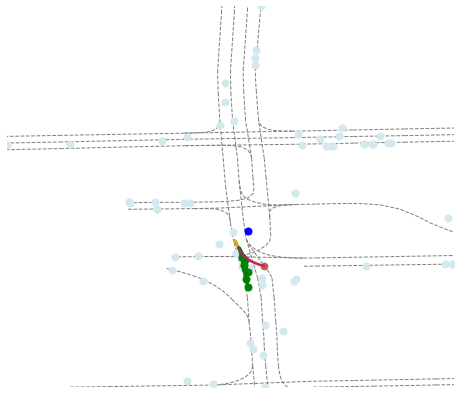





33277
--fail baseline


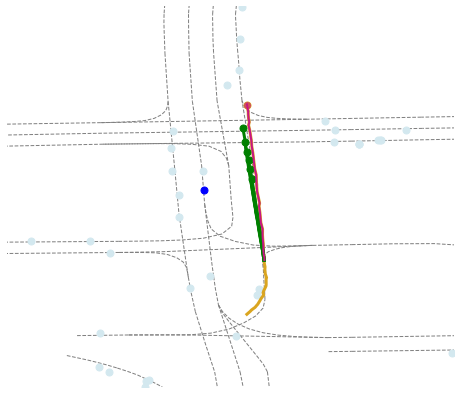

--fail mask


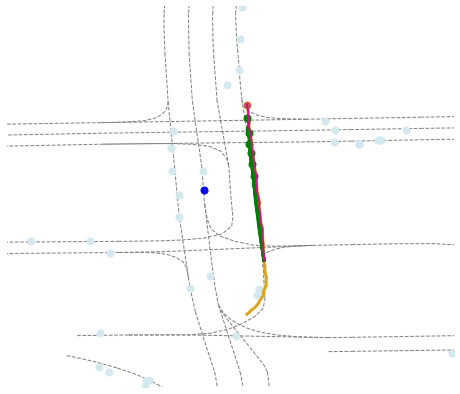

--success intersection


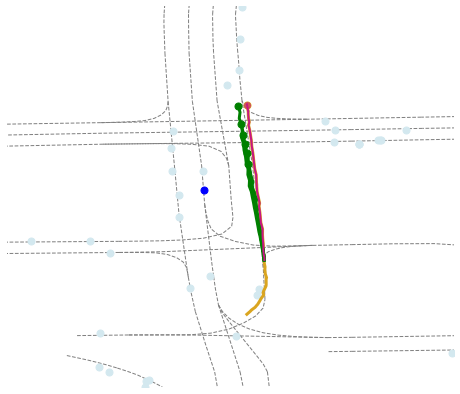

--fail successorfail


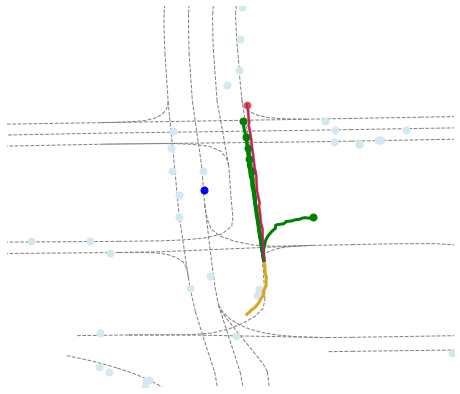

--fail maneuver


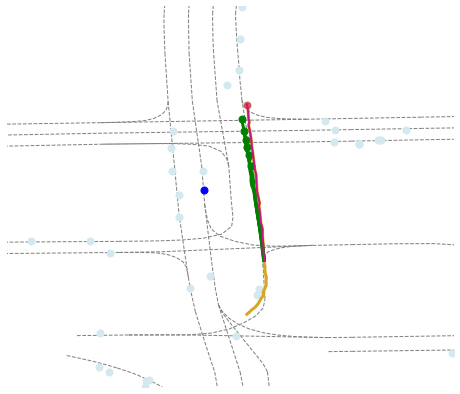





34717
--fail baseline


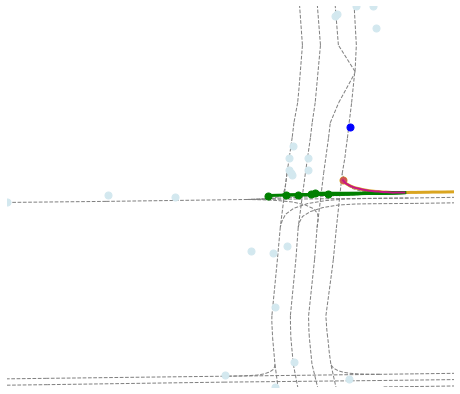

--fail mask


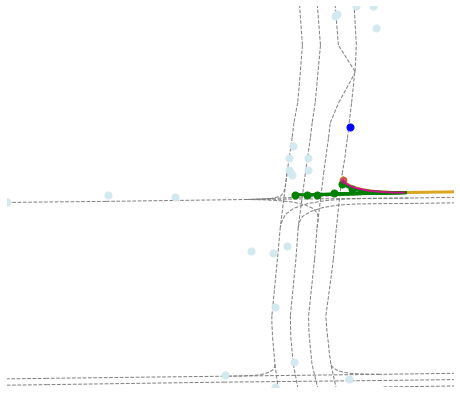

--success intersection


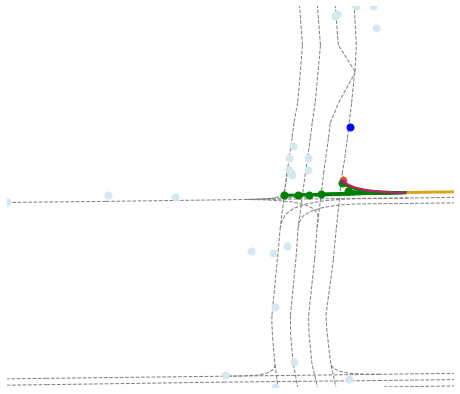

--fail successorfail


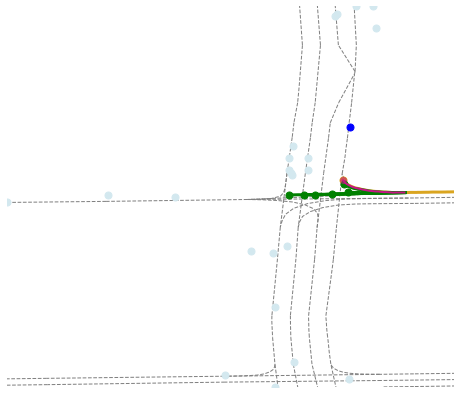

--fail maneuver


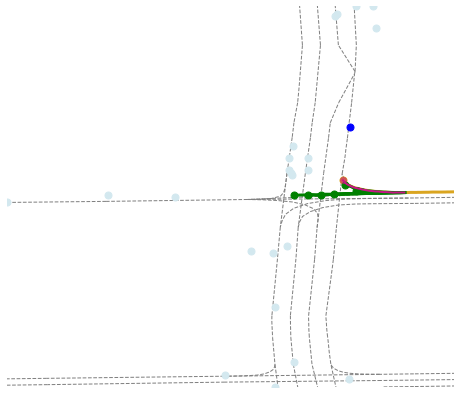





34998
--fail baseline


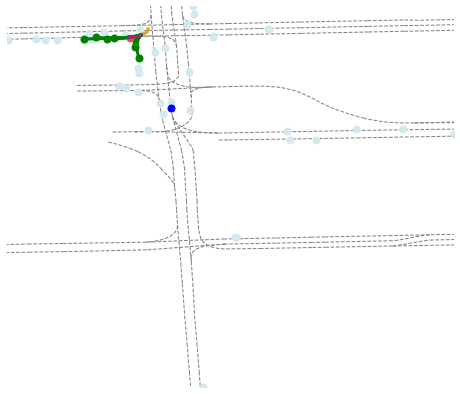

--fail mask


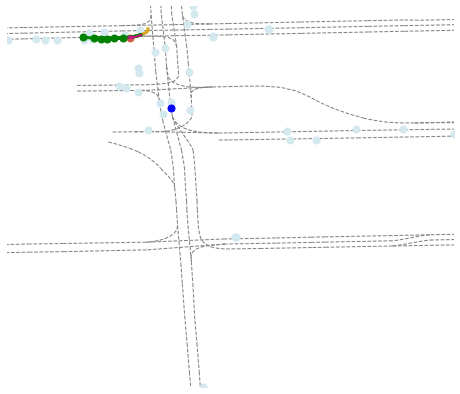

--success intersection


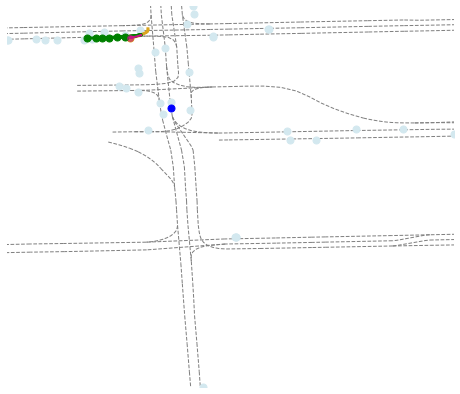

--fail successorfail


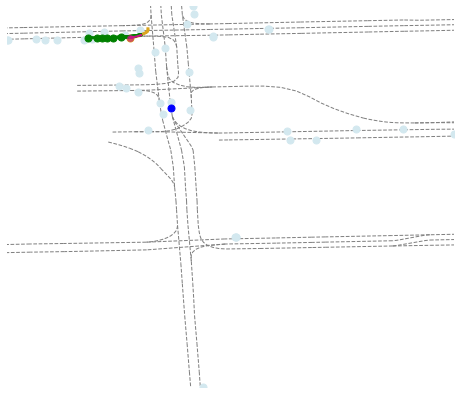

--fail maneuver


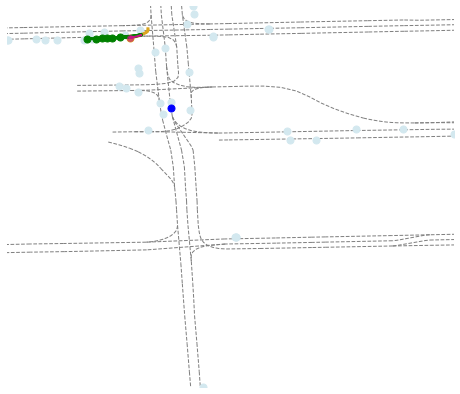





36400
--fail baseline


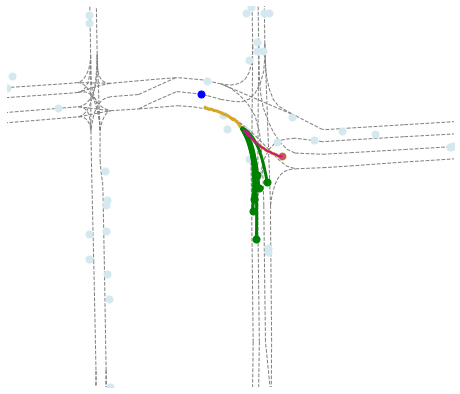

--fail mask


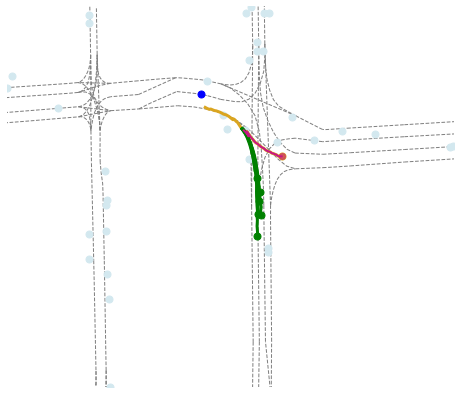

--success intersection


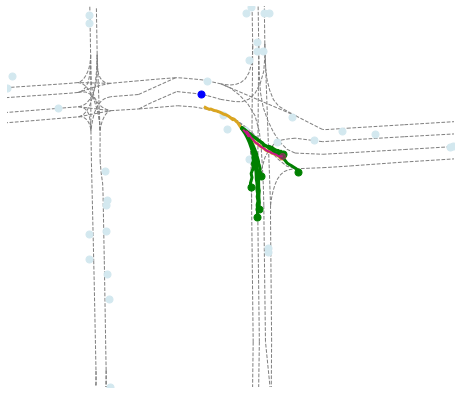

--fail successorfail


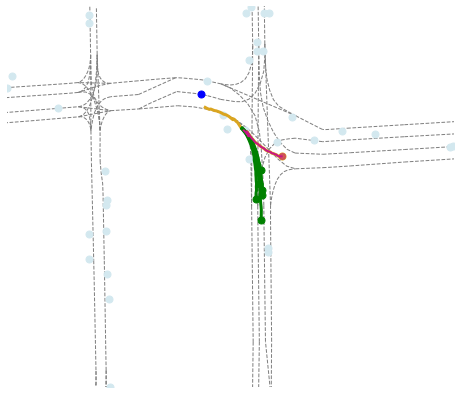

--fail maneuver


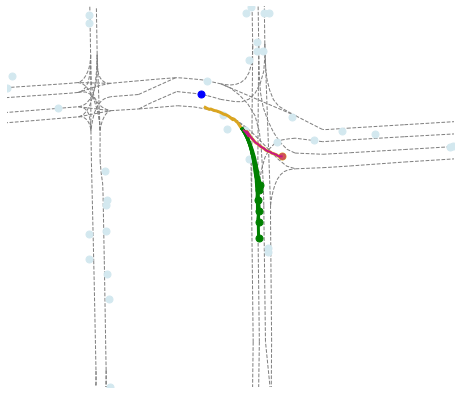





40255
--fail baseline


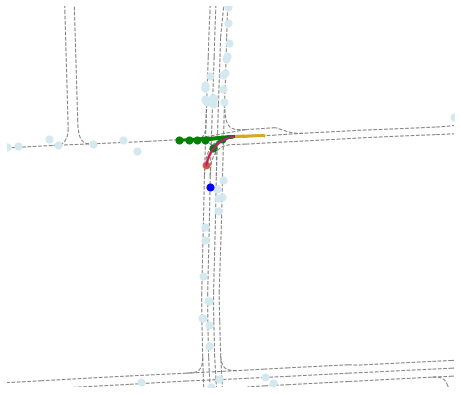

--fail mask


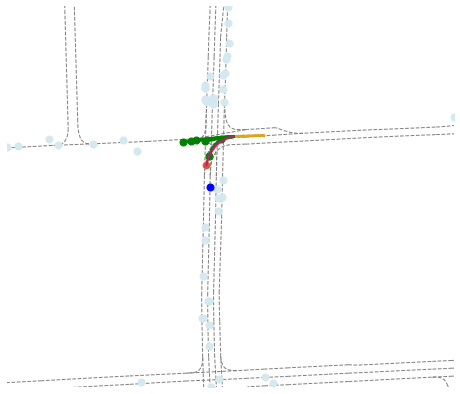

--success intersection


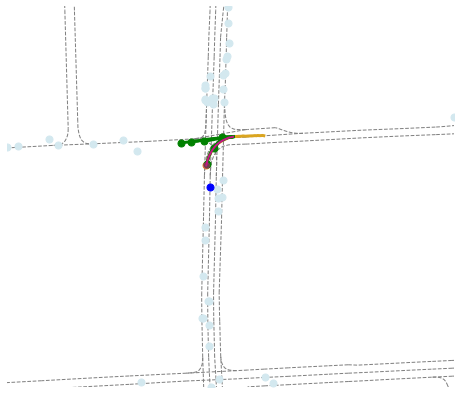

--fail successorfail


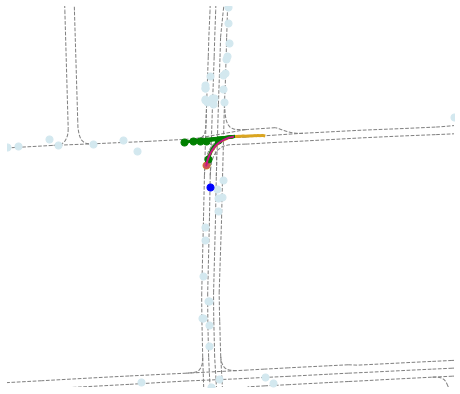

--fail maneuver


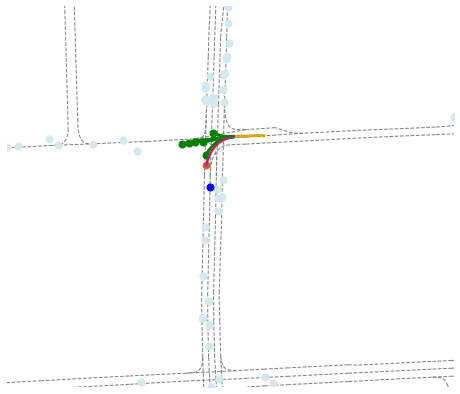

In [20]:
for l in range(min(len(intersection_success_ids), 15)):
    #rand_idx = np.random.randint(0, len(lanemask_success_ids))
    argo_idx = intersection_success_ids[l]#[rand_idx]
    print(argo_idx)
    
    seq_path = f"{root_dir}/"+str(argo_idx)+".csv"
    print('--fail baseline')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds[argo_idx], gts[argo_idx].numpy(), show=True)
    print('--fail mask')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_mask[argo_idx], gts_mask[argo_idx].numpy(), show=True)
    print('--success intersection')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_intersection[argo_idx], gts_intersection[argo_idx].numpy(), show=True)
    print('--fail successorfail')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_successfail[argo_idx], gts_successfail[argo_idx].numpy(), show=True)
    print('--fail maneuver')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_maneuver[argo_idx], gts_maneuver[argo_idx].numpy(), show=True)
    print("\n\n\n")

## Task 3

In [21]:
scene_success_ids = []
for ids in fail_ids_base:
    if ids in fail_ids_mask:
        if ids in fail_ids_maneuver: 
            if ids not in fail_ids_successfail:
                if ids in fail_ids_intersection:
                    scene_success_ids.append(ids)
print(scene_success_ids)

[10174, 13448, 13764, 19392, 20836, 22963, 24246, 27645, 29667, 2993, 31027, 32375, 33764, 34470, 34758, 35062, 35151, 35805, 38270, 4528, 8523, 8713, 8739]


10174
--fail baseline


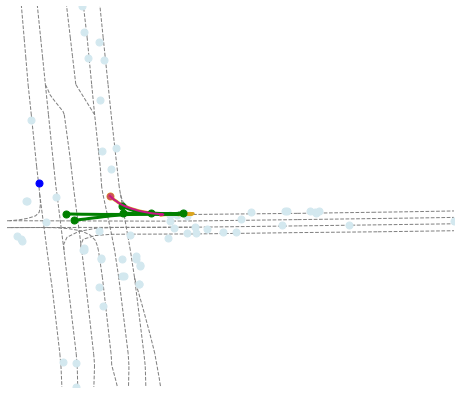

--fail mask


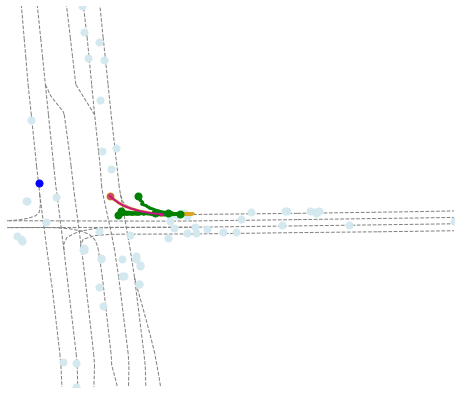

--fail intersection


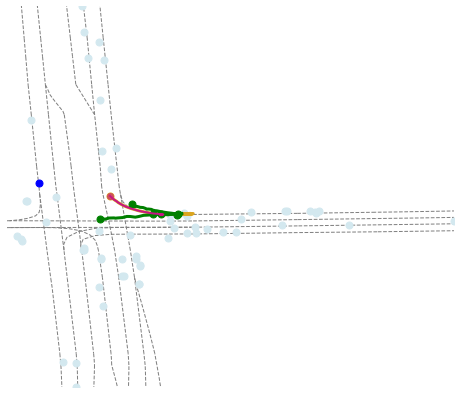

--success successorfail


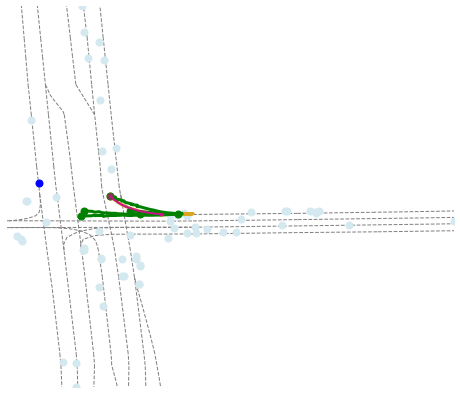

--fail maneuver


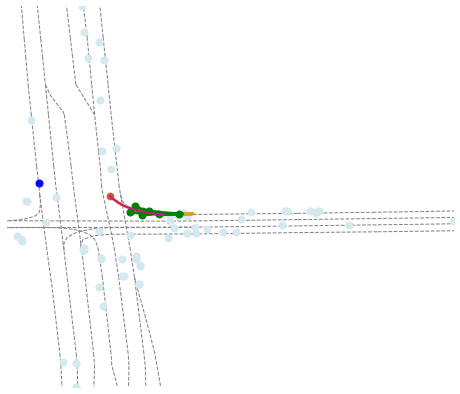





13448
--fail baseline


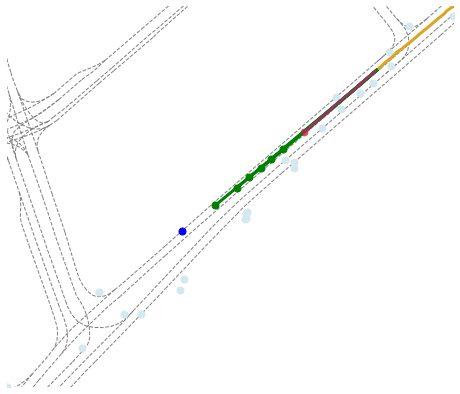

--fail mask


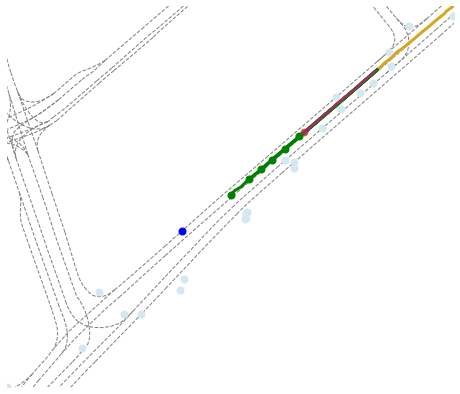

--fail intersection


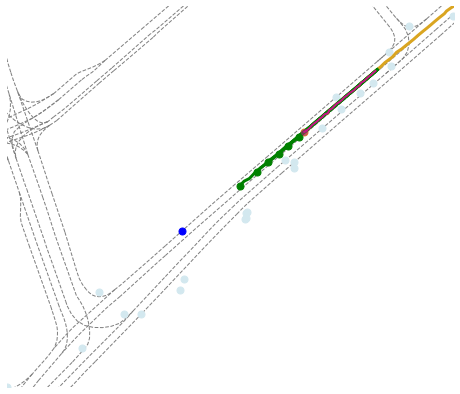

--success successorfail


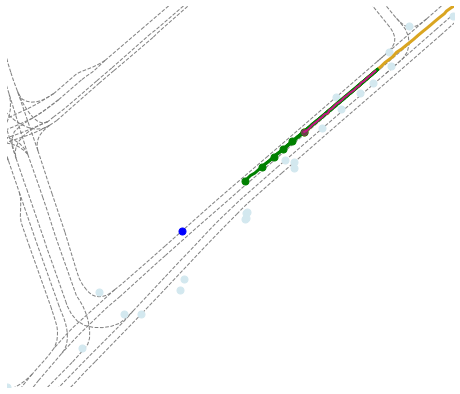

--fail maneuver


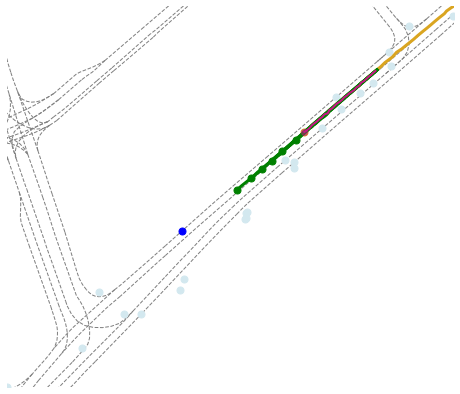





13764
--fail baseline


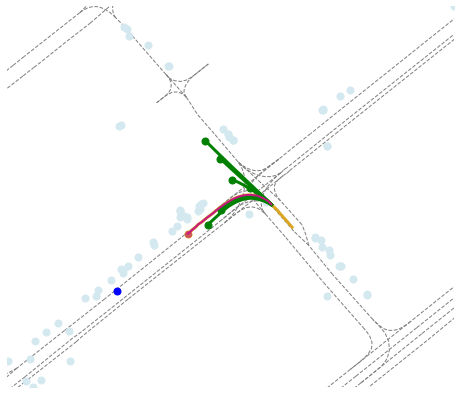

--fail mask


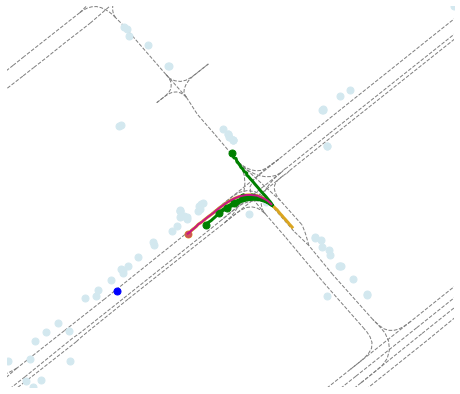

--fail intersection


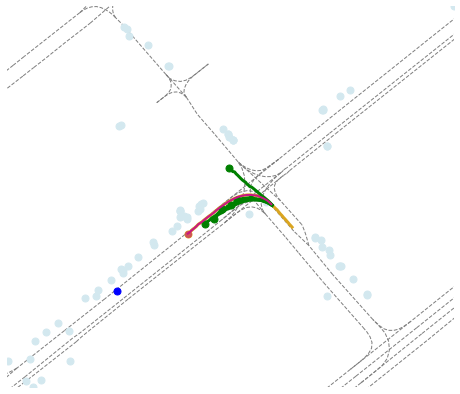

--success successorfail


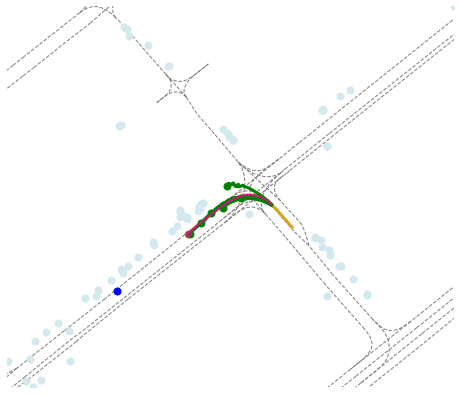

--fail maneuver


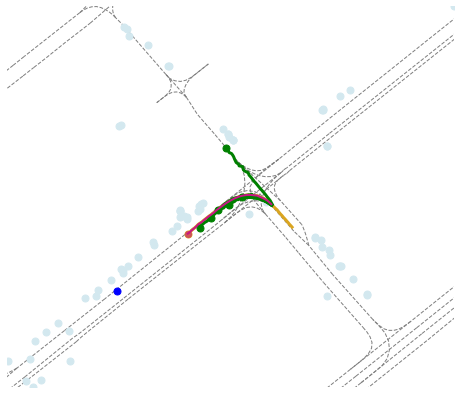





19392
--fail baseline


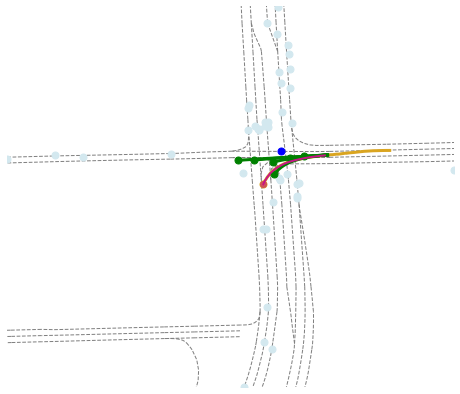

--fail mask


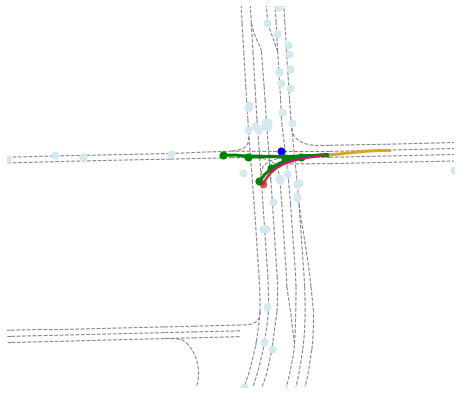

--fail intersection


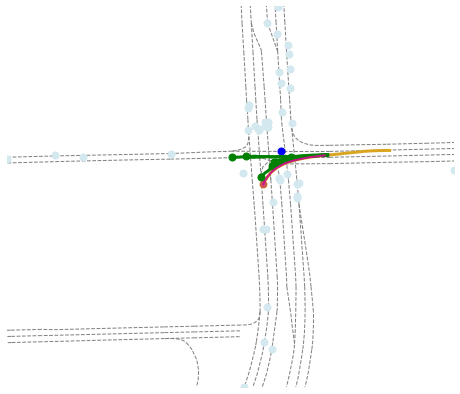

--success successorfail


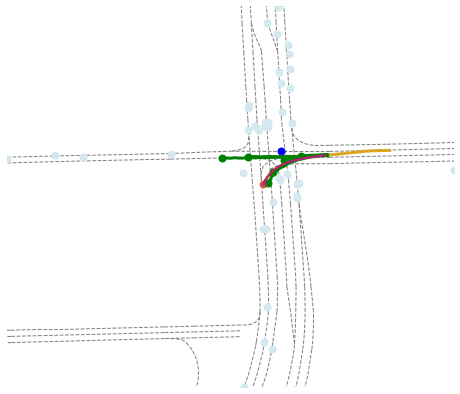

--fail maneuver


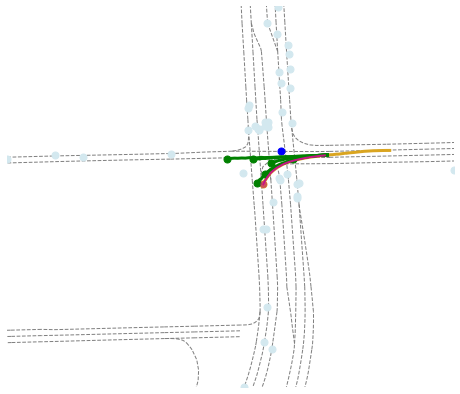





20836
--fail baseline


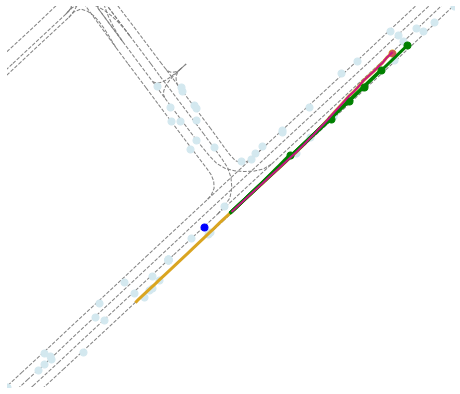

--fail mask


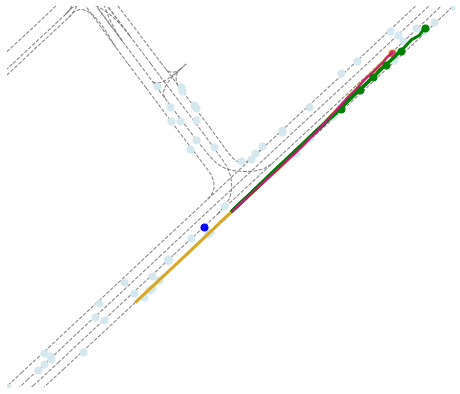

--fail intersection


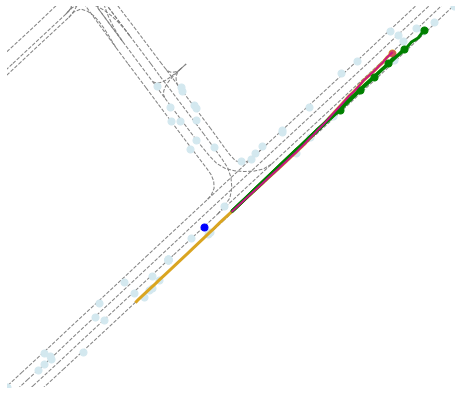

--success successorfail


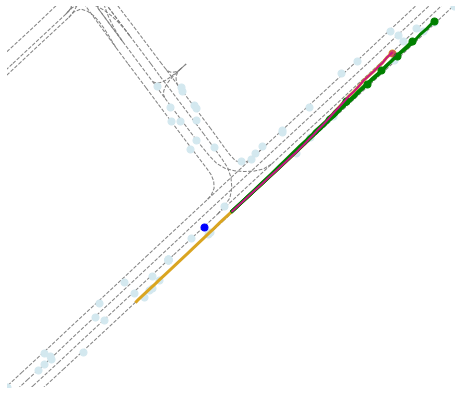

--fail maneuver


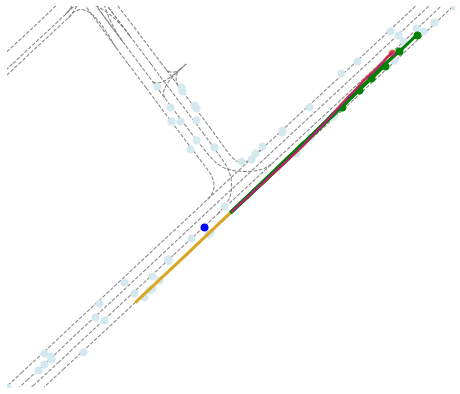





22963
--fail baseline


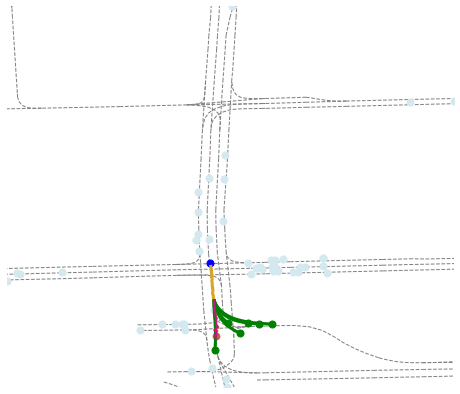

--fail mask


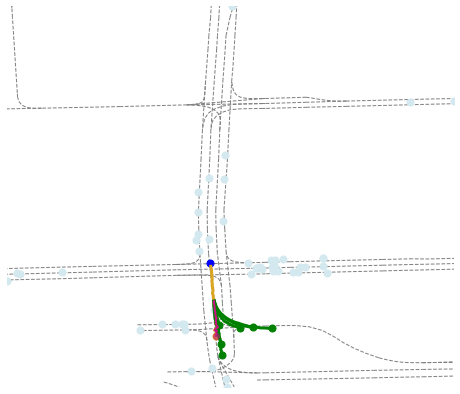

--fail intersection


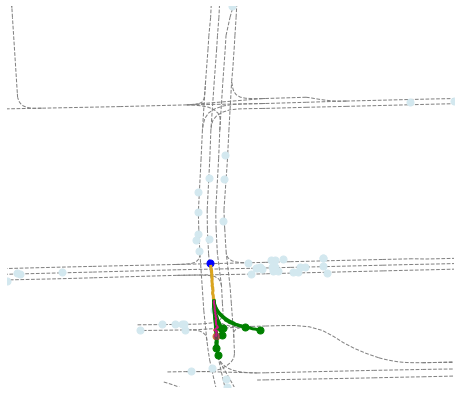

--success successorfail


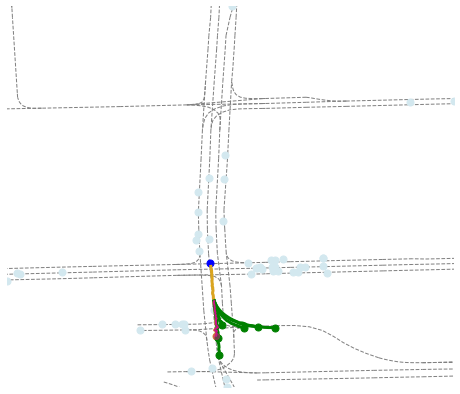

--fail maneuver


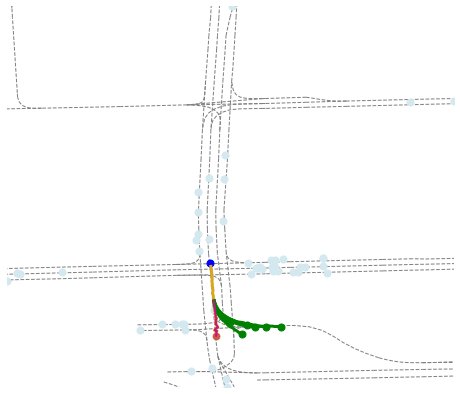





24246
--fail baseline


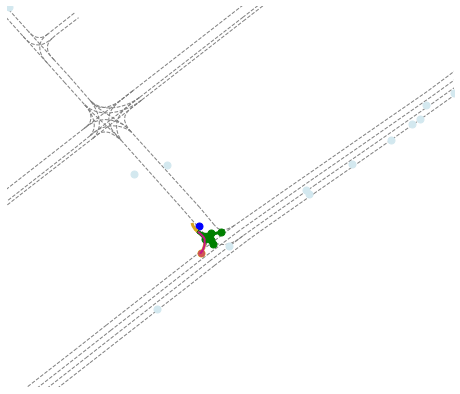

--fail mask


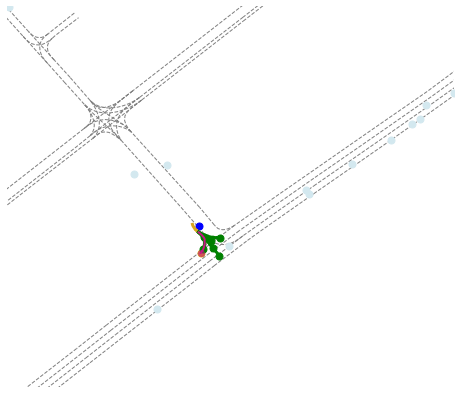

--fail intersection


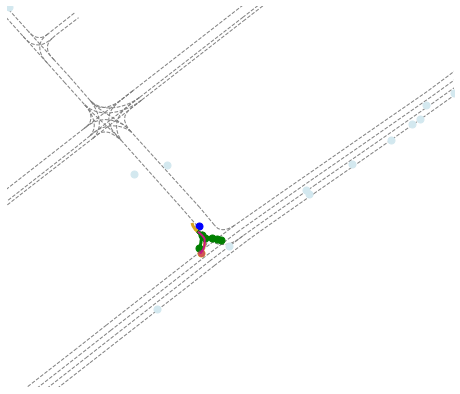

--success successorfail


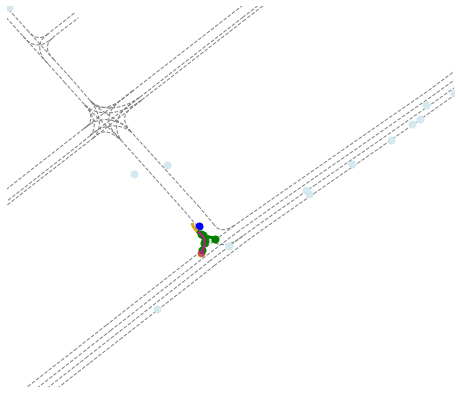

--fail maneuver


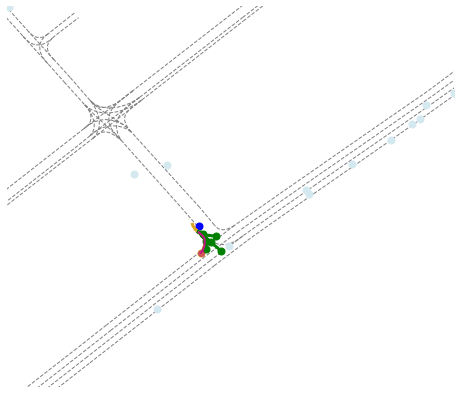





27645
--fail baseline


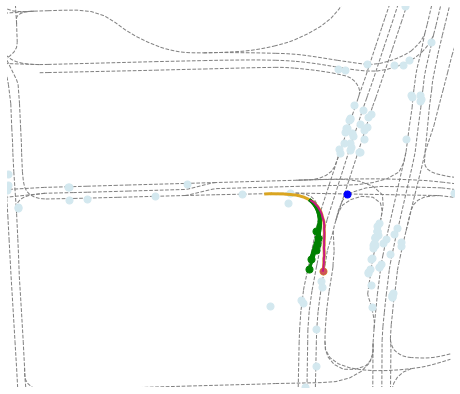

--fail mask


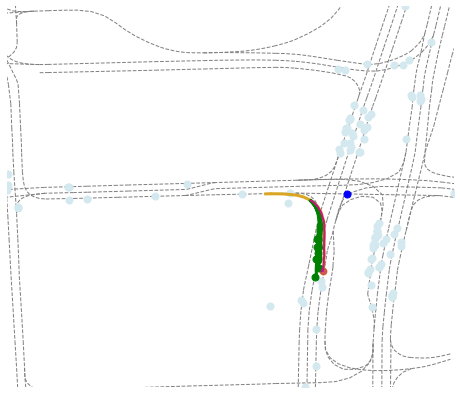

--fail intersection


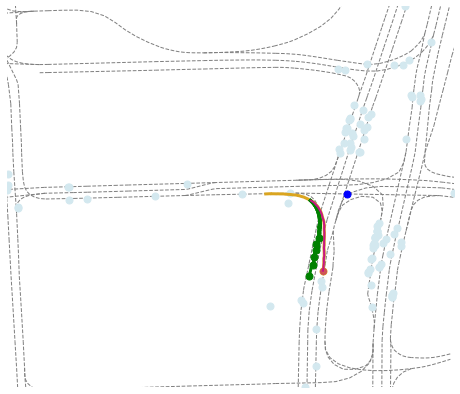

--success successorfail


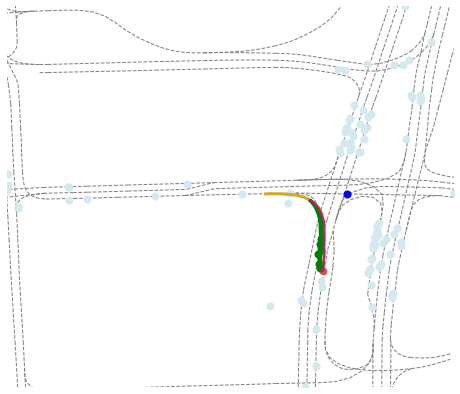

--fail maneuver


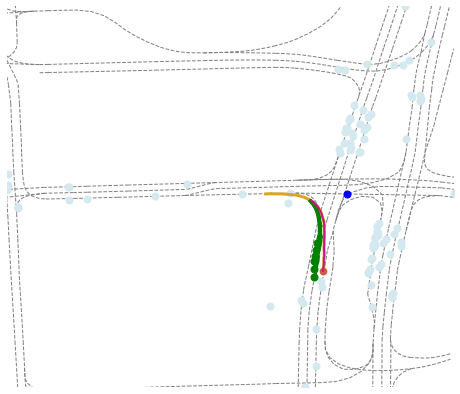





29667
--fail baseline


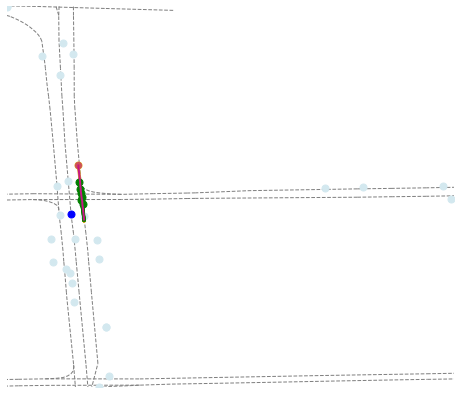

--fail mask


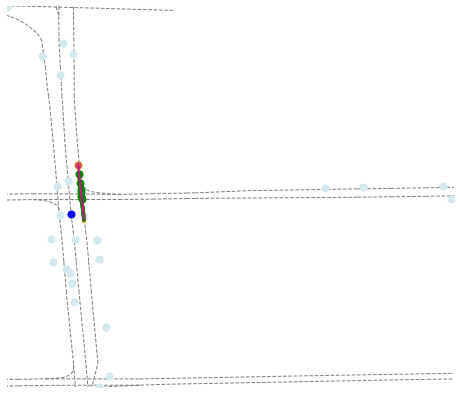

--fail intersection


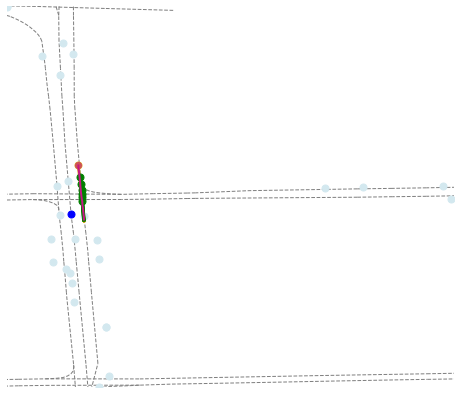

--success successorfail


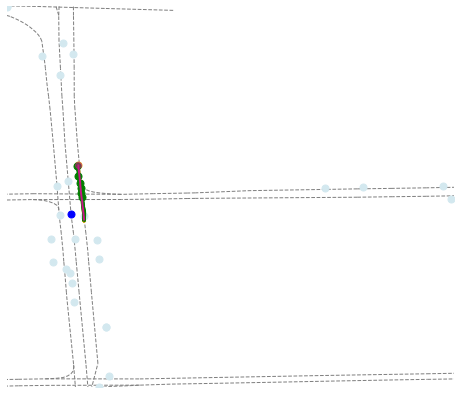

--fail maneuver


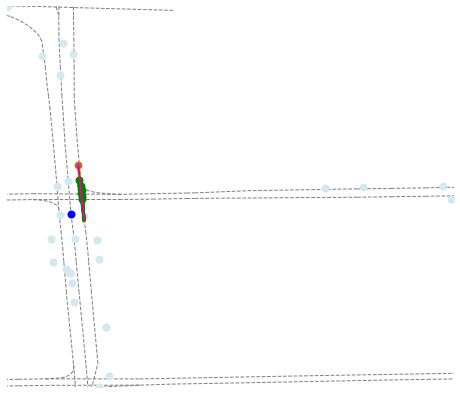





2993
--fail baseline


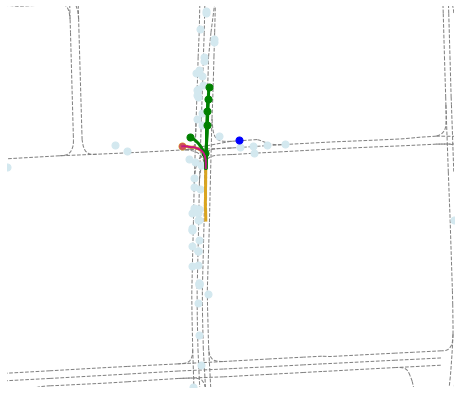

--fail mask


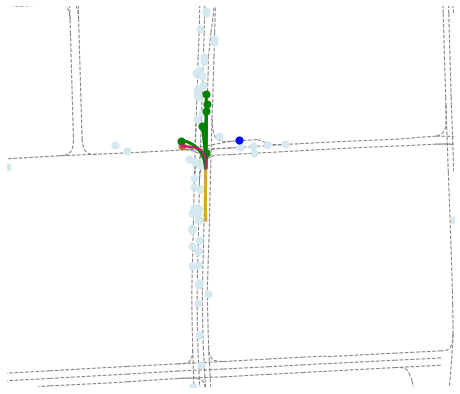

--fail intersection


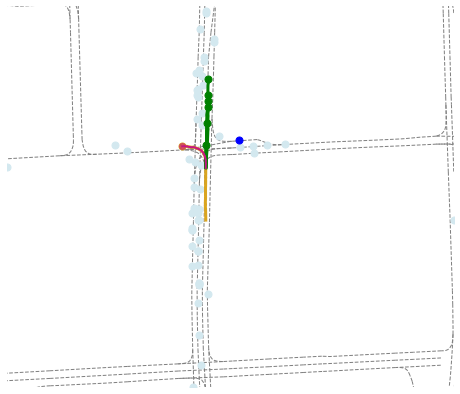

--success successorfail


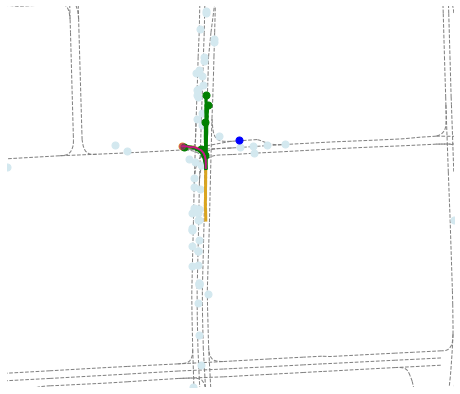

--fail maneuver


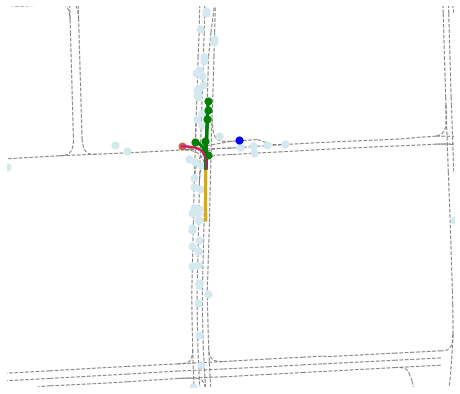





31027
--fail baseline


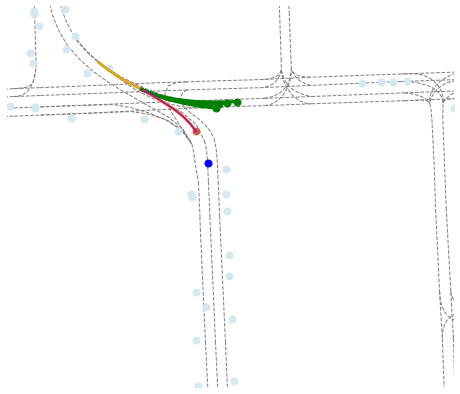

--fail mask


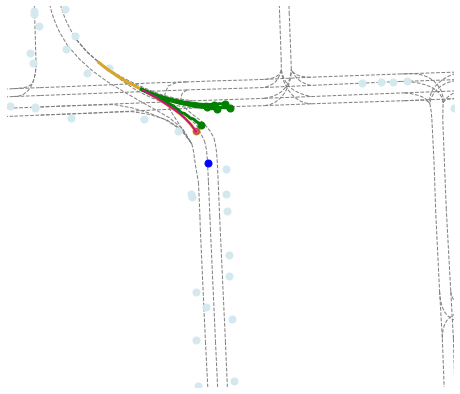

--fail intersection


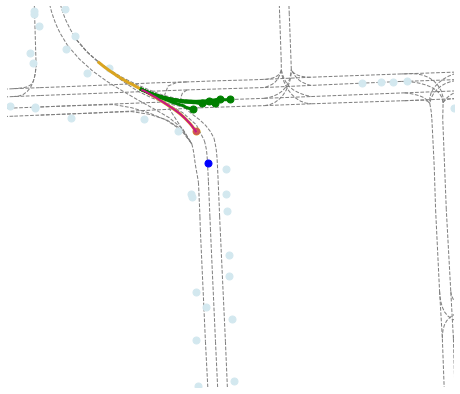

--success successorfail


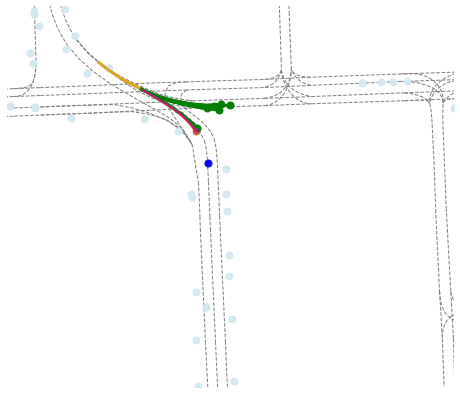

--fail maneuver


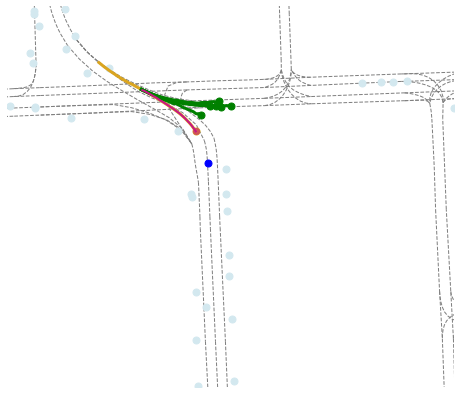





32375
--fail baseline


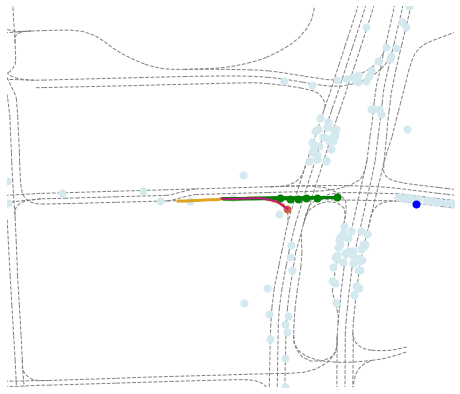

--fail mask


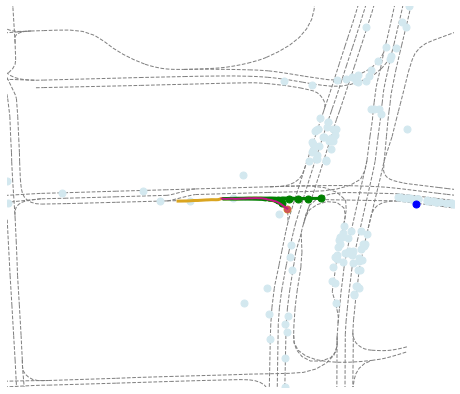

--fail intersection


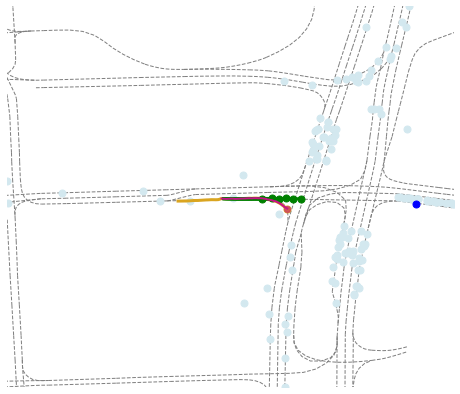

--success successorfail


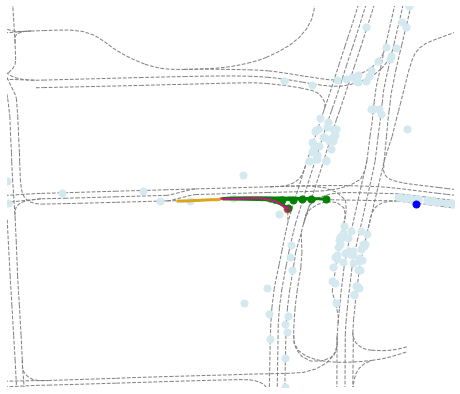

--fail maneuver


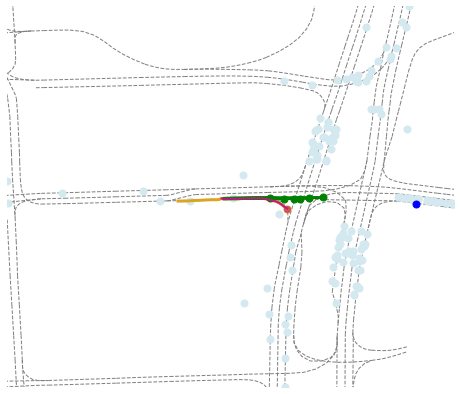





33764
--fail baseline


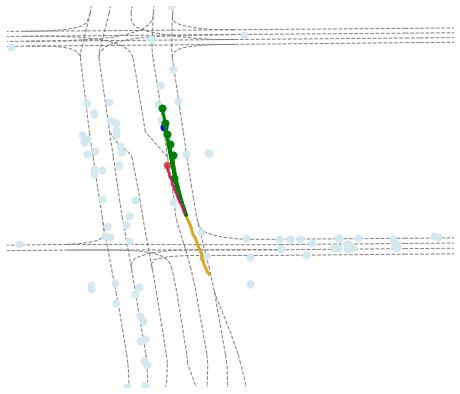

--fail mask


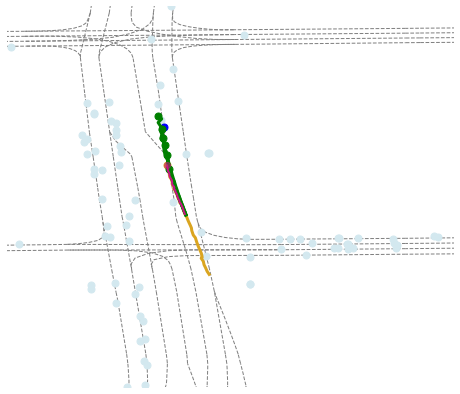

--fail intersection


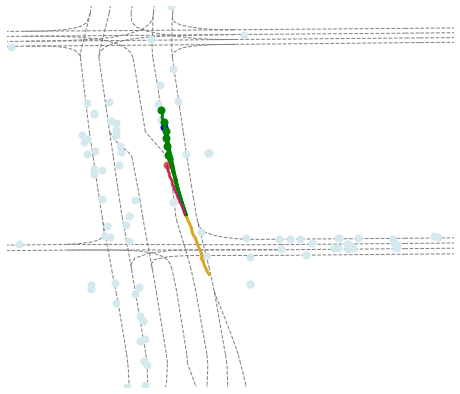

--success successorfail


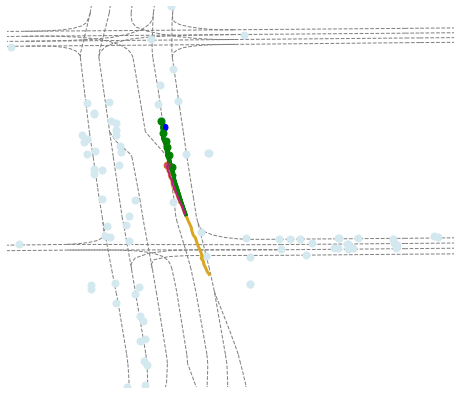

--fail maneuver


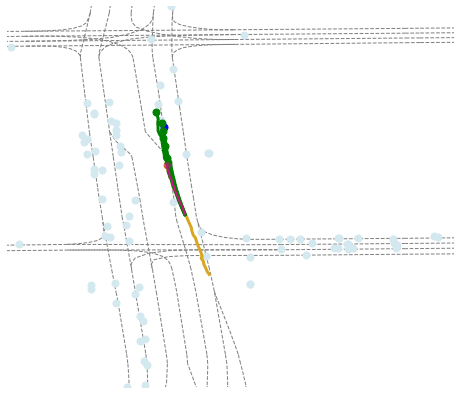





34470
--fail baseline


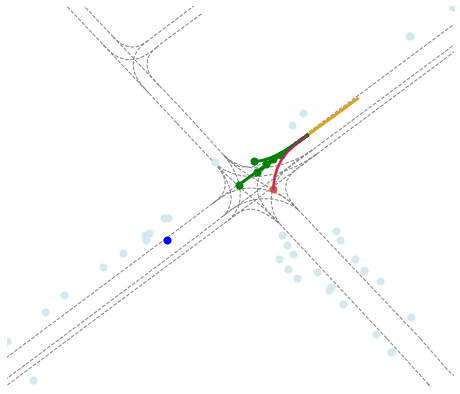

--fail mask


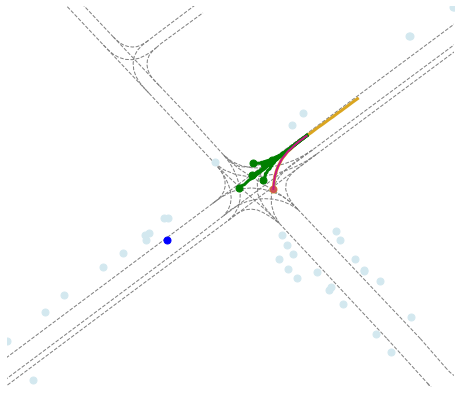

--fail intersection


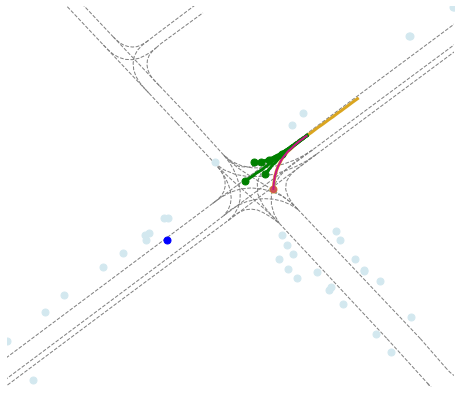

--success successorfail


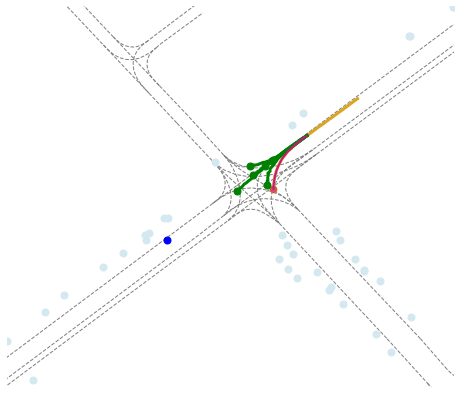

--fail maneuver


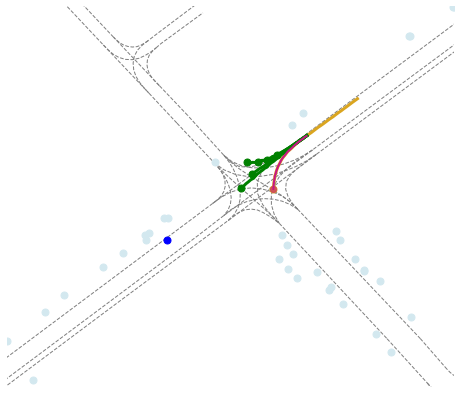





34758
--fail baseline


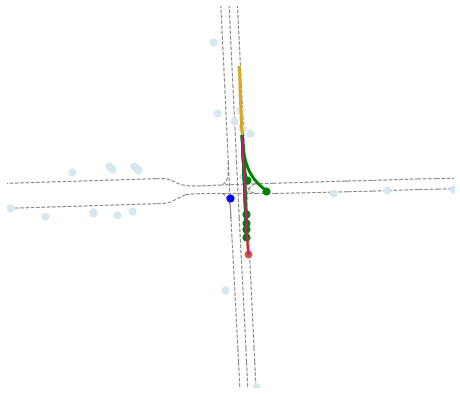

--fail mask


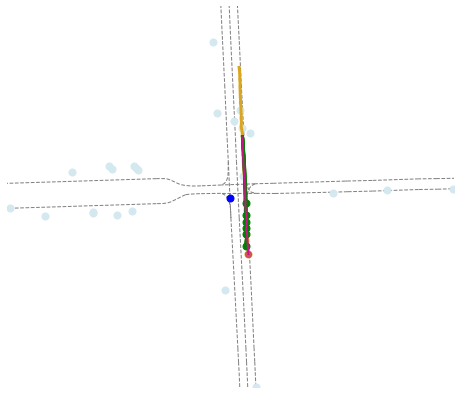

--fail intersection


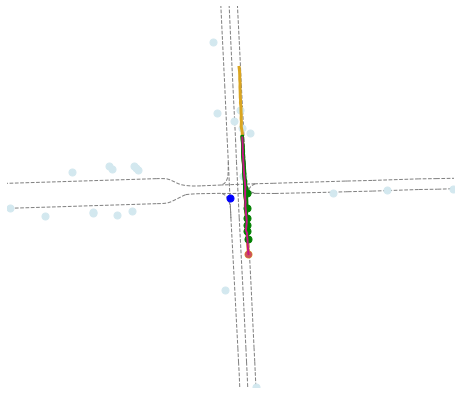

--success successorfail


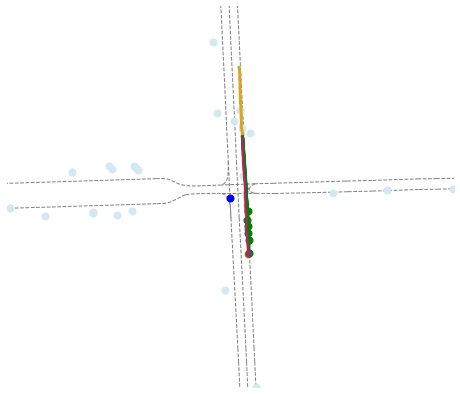

--fail maneuver


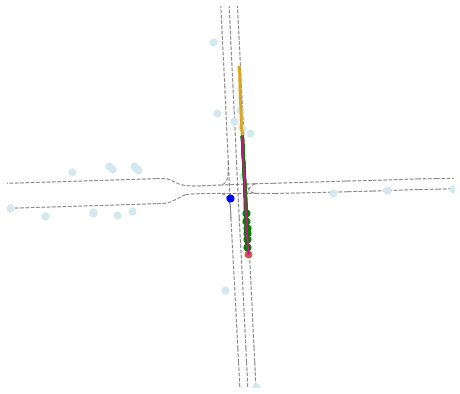

In [24]:
for l in range(min(len(scene_success_ids), 15)):
    #rand_idx = np.random.randint(0, len(lanemask_success_ids))
    argo_idx = scene_success_ids[l]#[rand_idx]
    print(argo_idx)
    
    seq_path = f"{root_dir}/"+str(argo_idx)+".csv"
    print('--fail baseline')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds[argo_idx], gts[argo_idx].numpy(), show=True)
    print('--fail mask')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_mask[argo_idx], gts_mask[argo_idx].numpy(), show=True)
    print('--fail intersection')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_intersection[argo_idx], gts_intersection[argo_idx].numpy(), show=True)
    print('--success successorfail')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_successfail[argo_idx], gts_successfail[argo_idx].numpy(), show=True)
    print('--fail maneuver')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_maneuver[argo_idx], gts_maneuver[argo_idx].numpy(), show=True)
    print("\n\n\n")

## Task 4

In [25]:
maneuver_success_ids = []
for ids in fail_ids_base:
    if ids in fail_ids_mask: 
        if ids in fail_ids_intersection:
            if ids in fail_ids_successfail:
                if ids not in fail_ids_maneuver:
                    maneuver_success_ids.append(ids)
print(maneuver_success_ids)

[11807, 12377, 13323, 15367, 18393, 23424, 25822, 26681, 27284, 31467, 3383, 34170, 34261, 35757, 39322, 5334, 6740, 9878]


11807
--fails


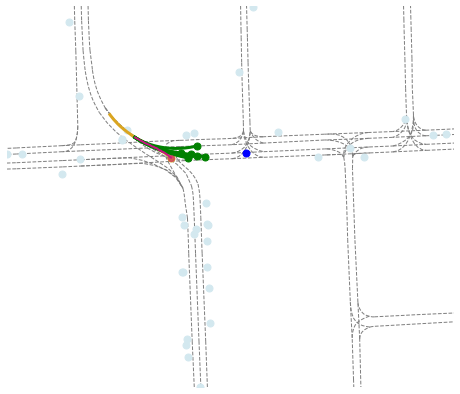

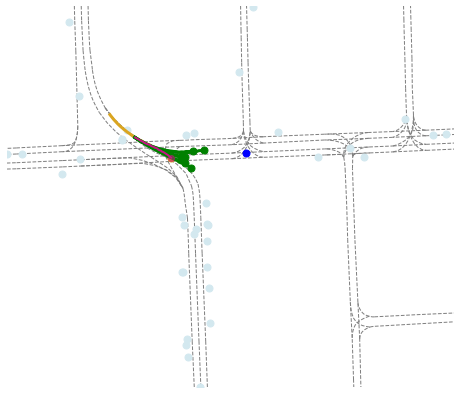

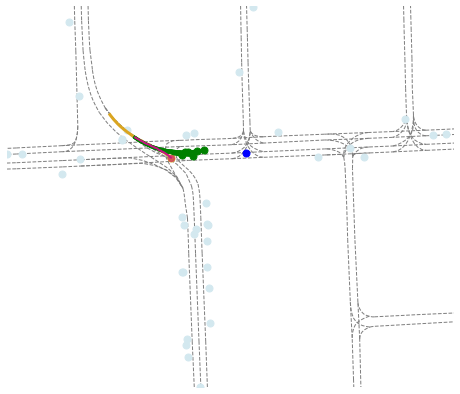

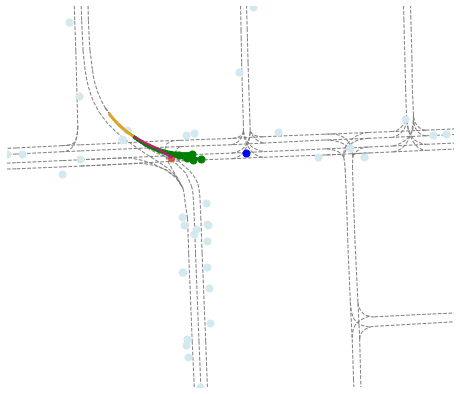

--success


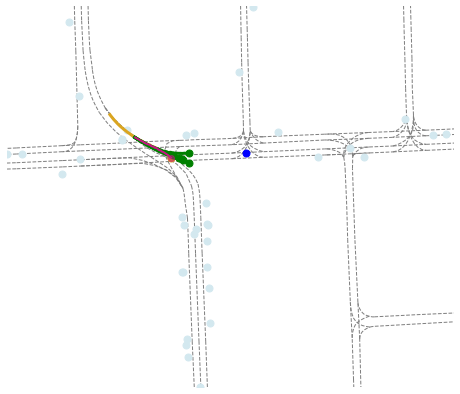





12377
--fails


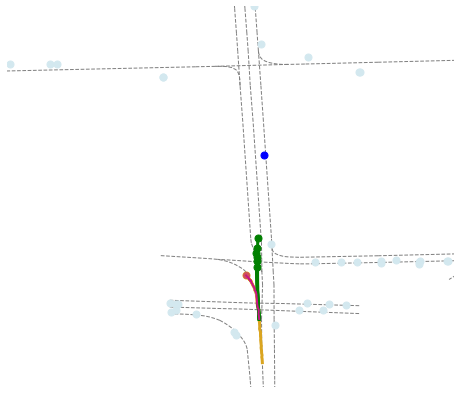

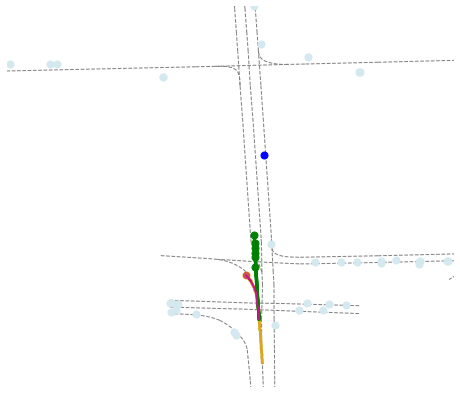

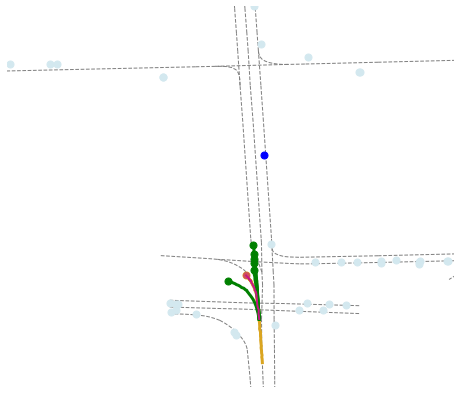

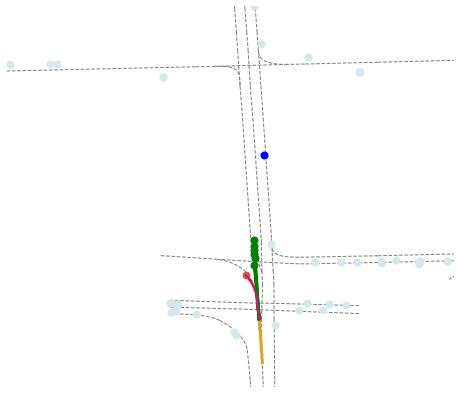

--success


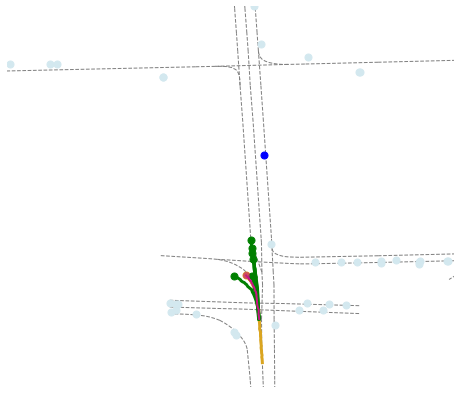





13323
--fails


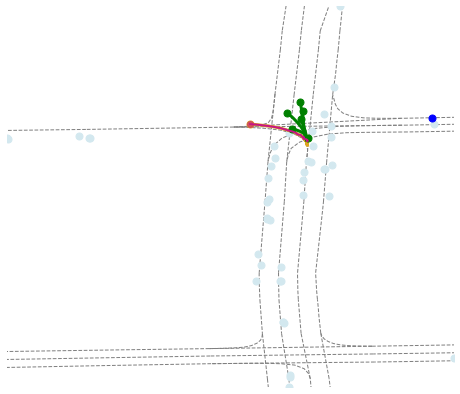

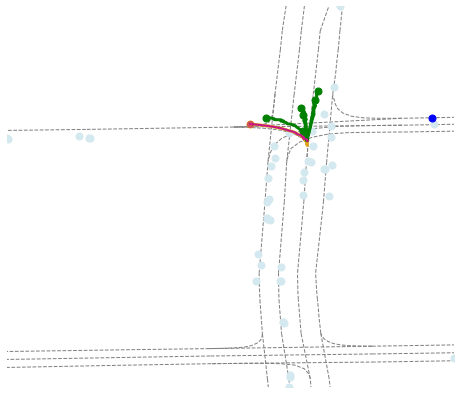

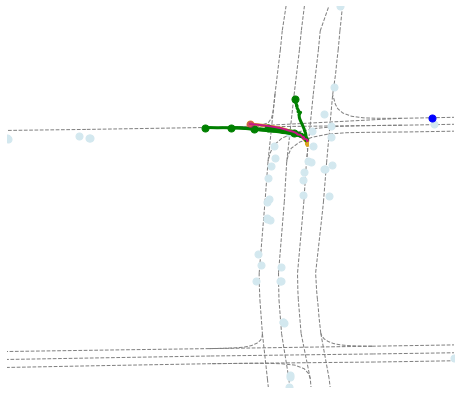

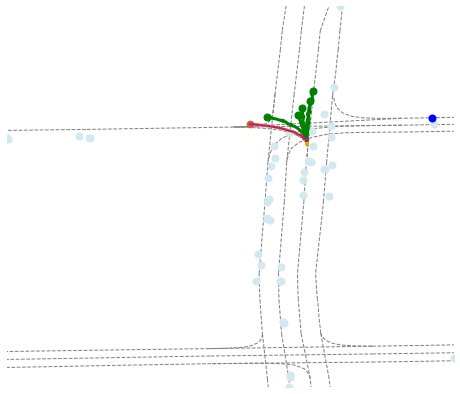

--success


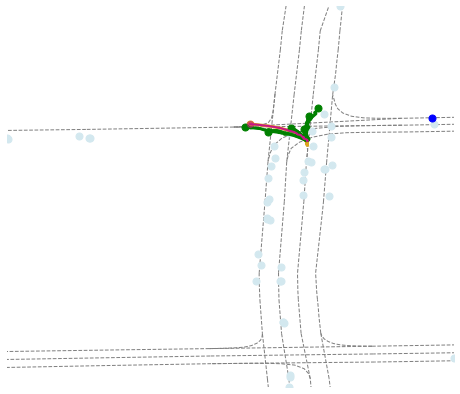





15367
--fails


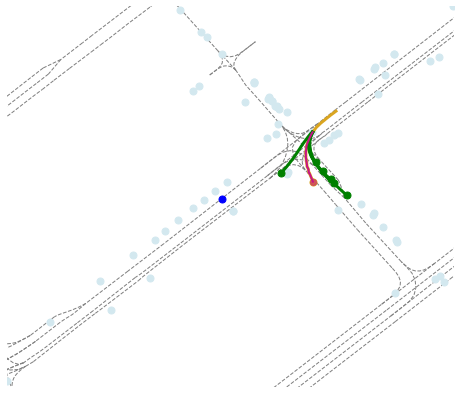

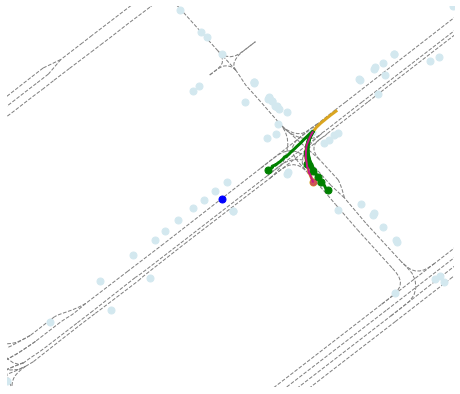

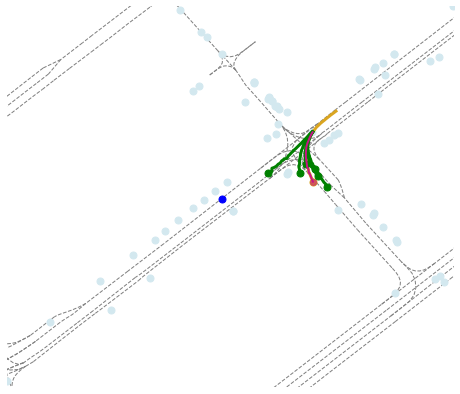

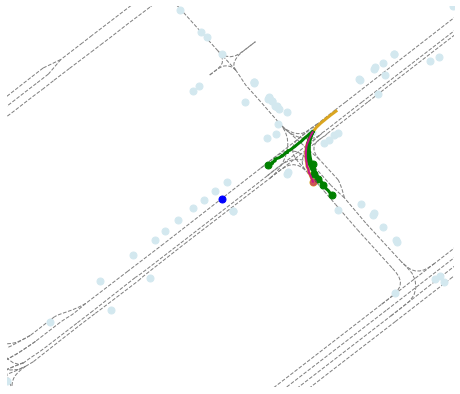

--success


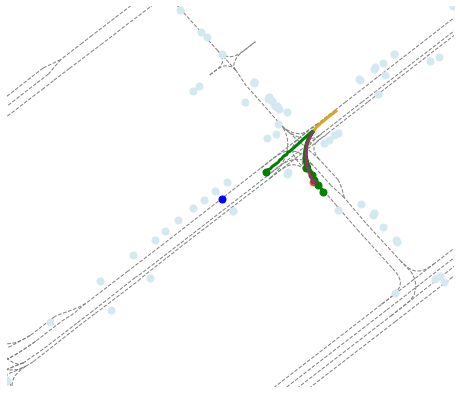





18393
--fails


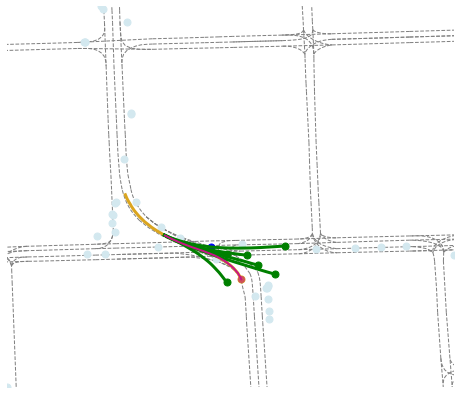

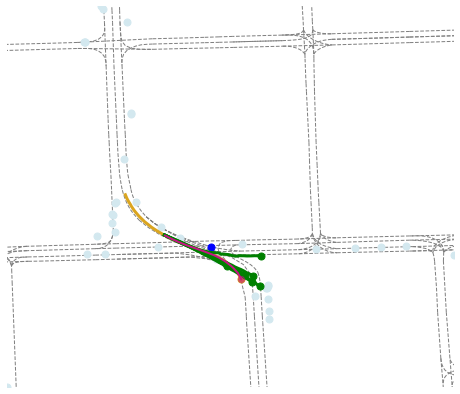

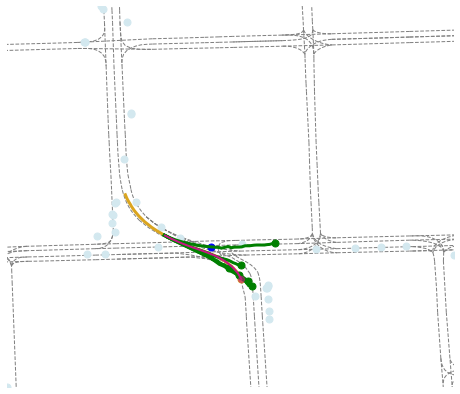

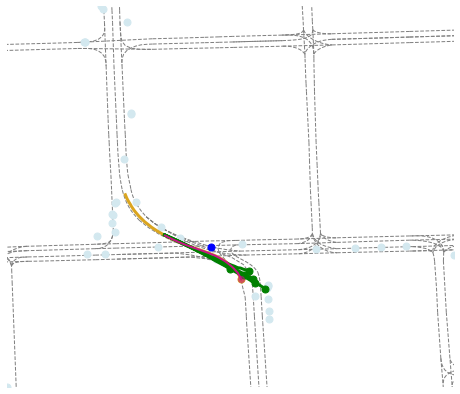

--success


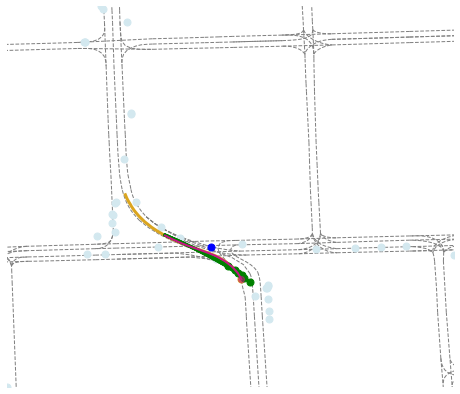





23424
--fails


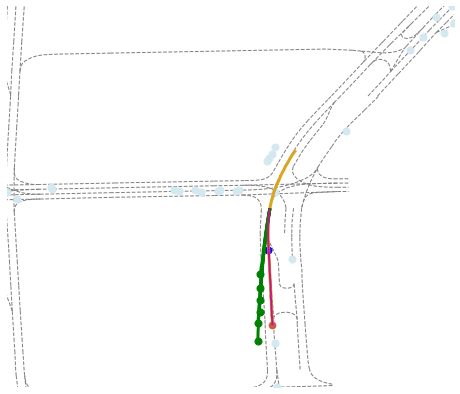

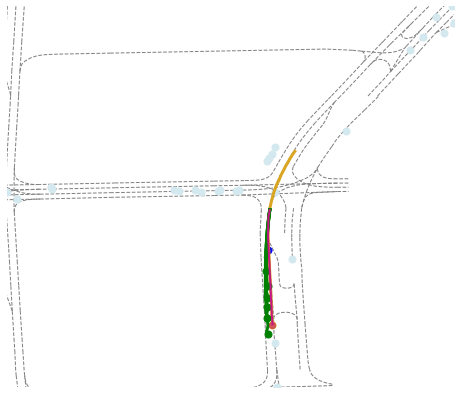

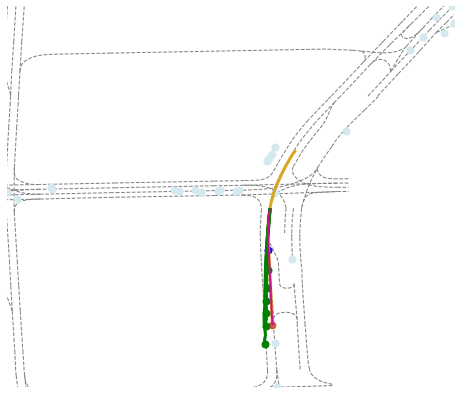

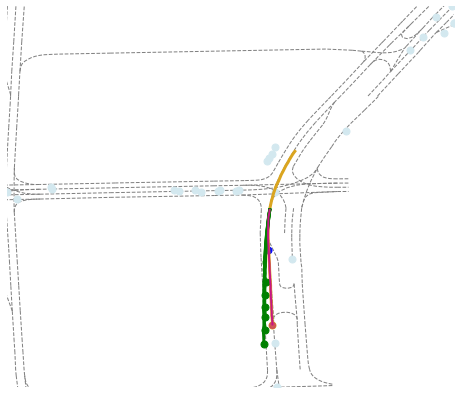

--success


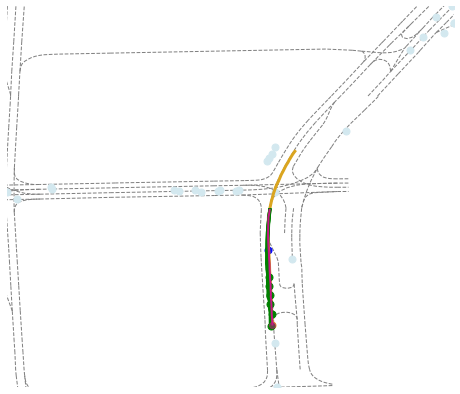





25822
--fails


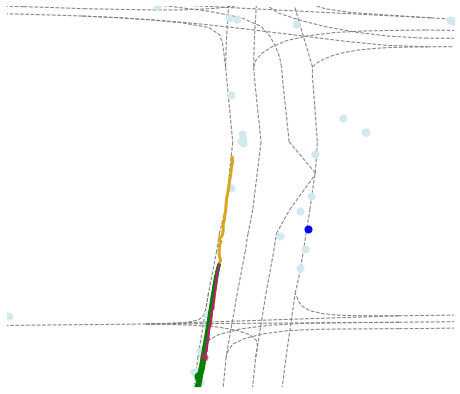

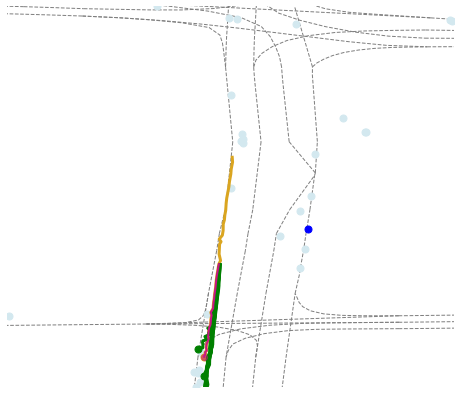

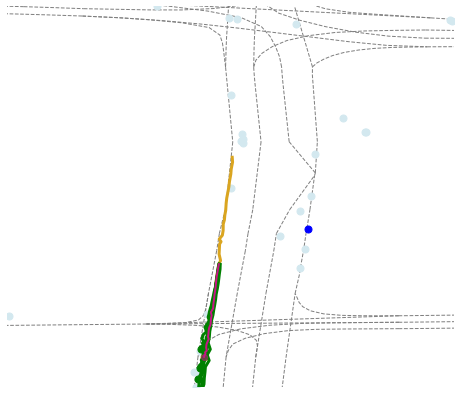

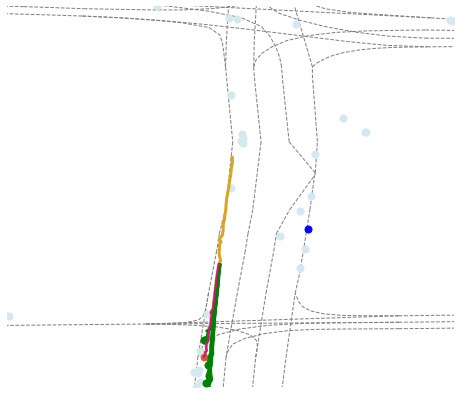

--success


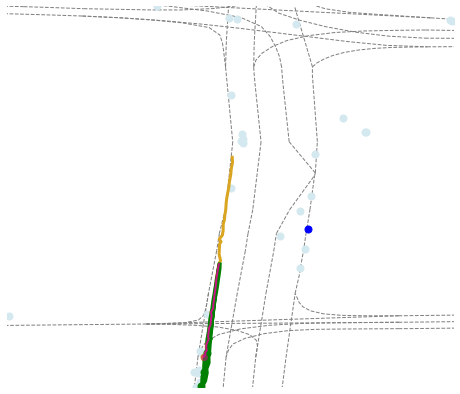





26681
--fails


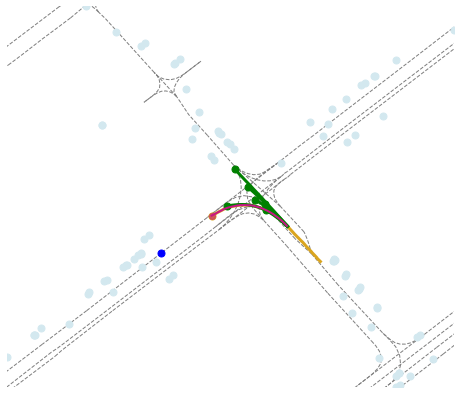

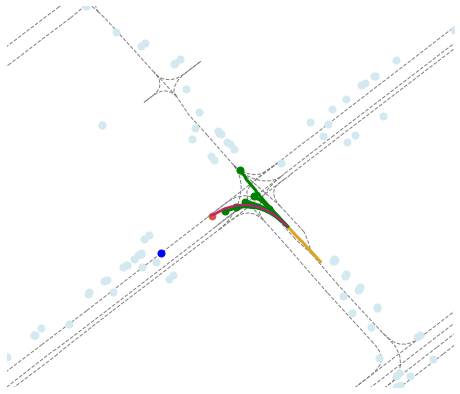

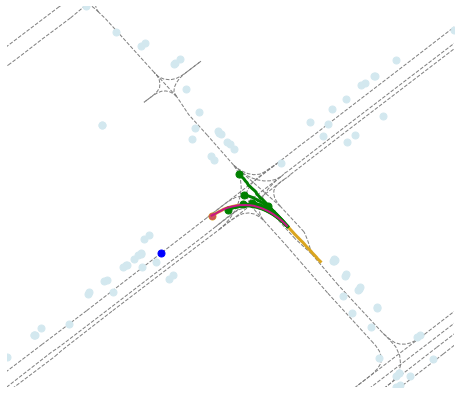

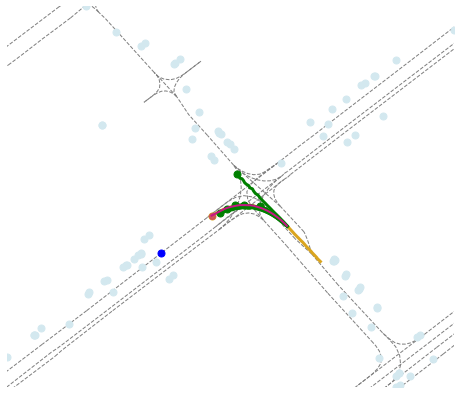

--success


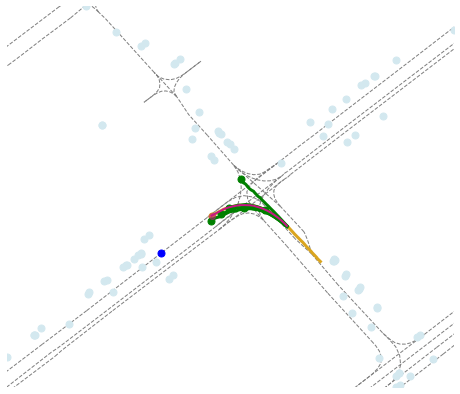





27284
--fails


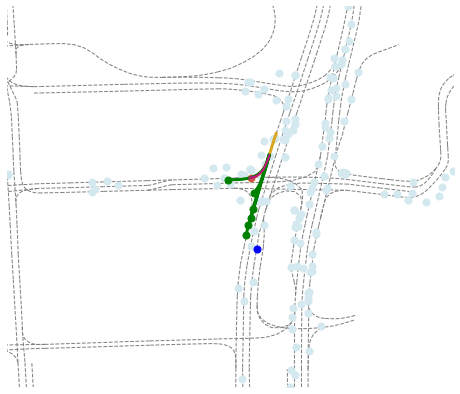

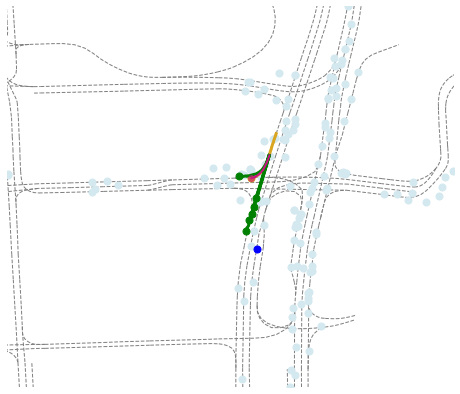

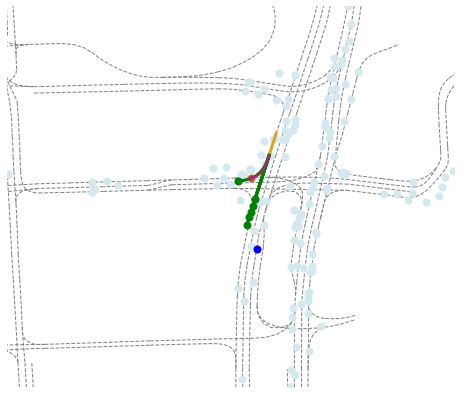

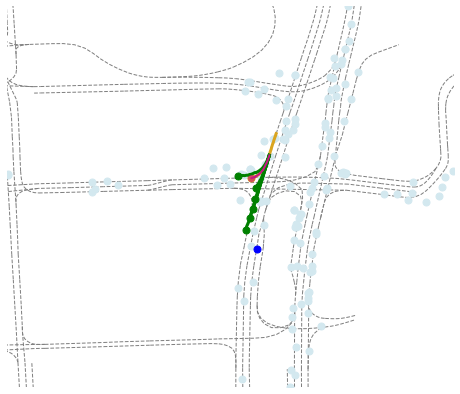

--success


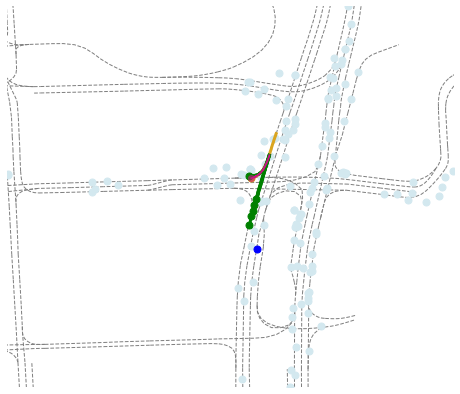





31467
--fails


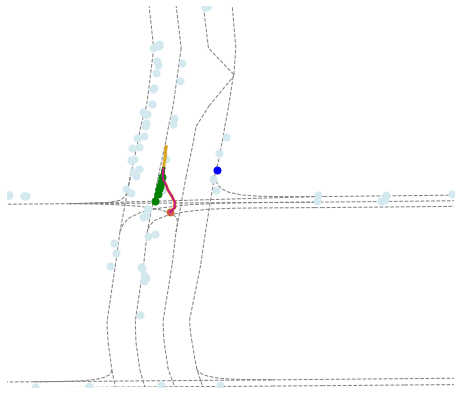

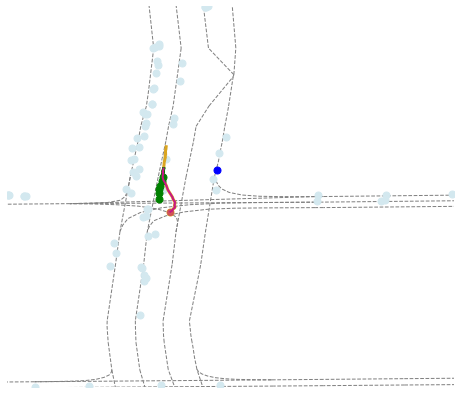

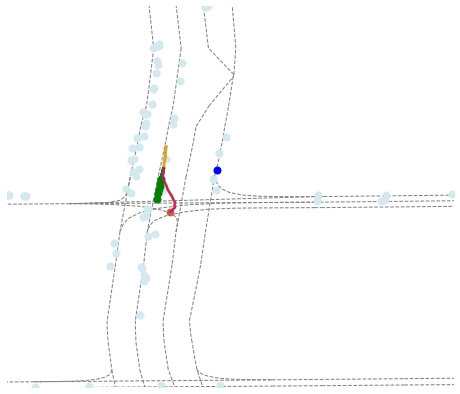

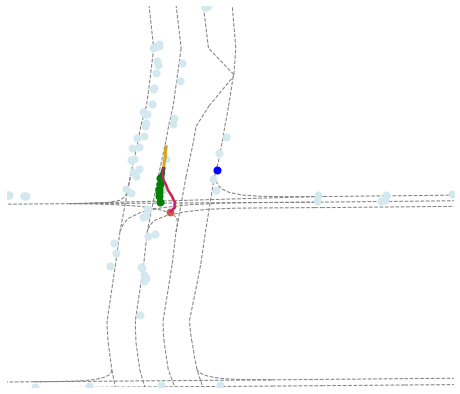

--success


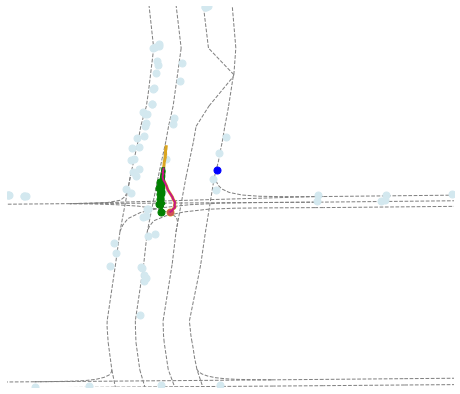





3383
--fails


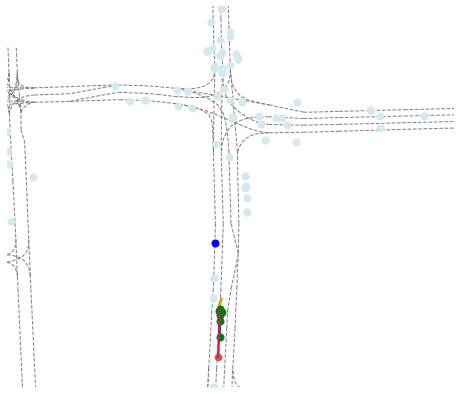

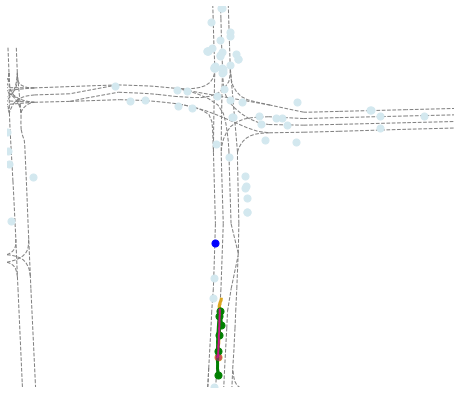

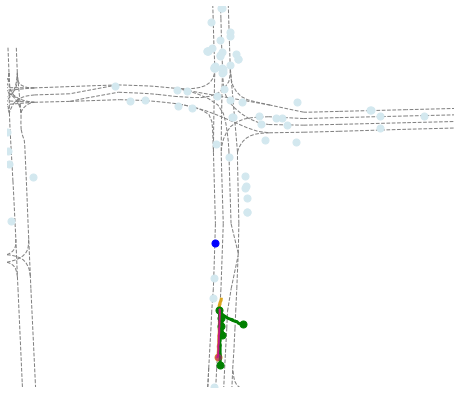

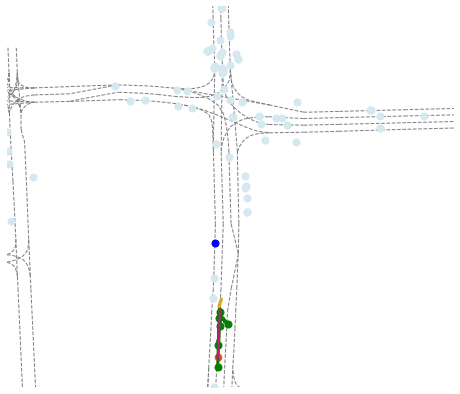

--success


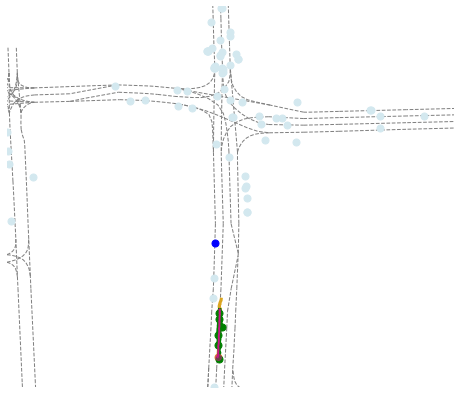





34170
--fails


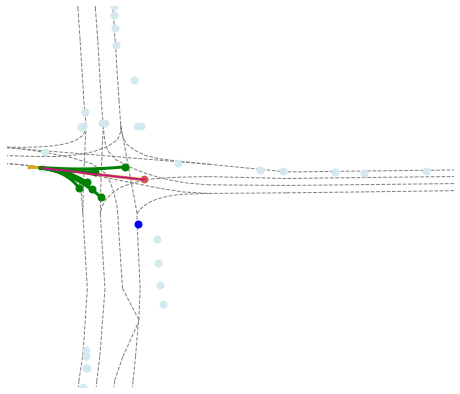

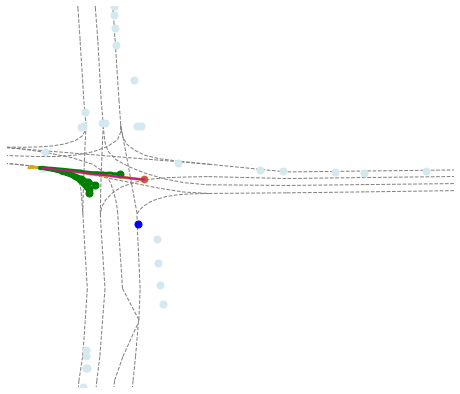

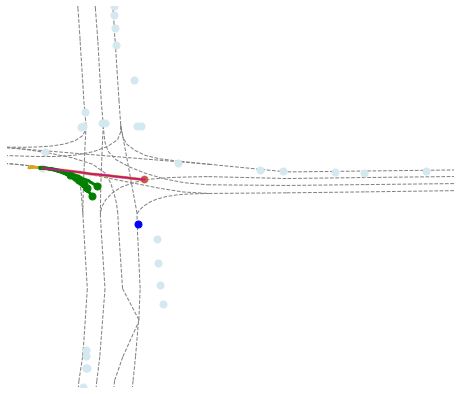

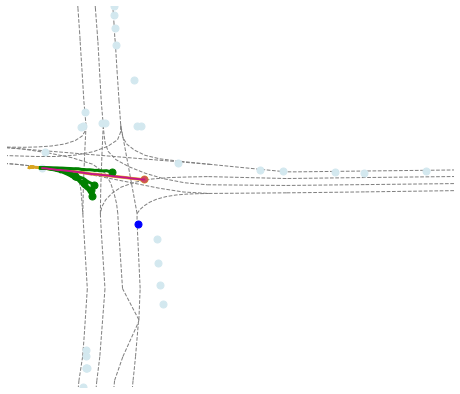

--success


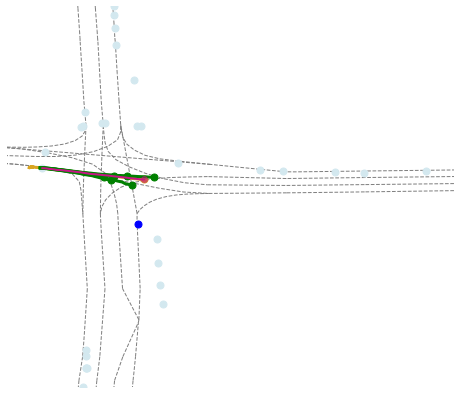





34261
--fails


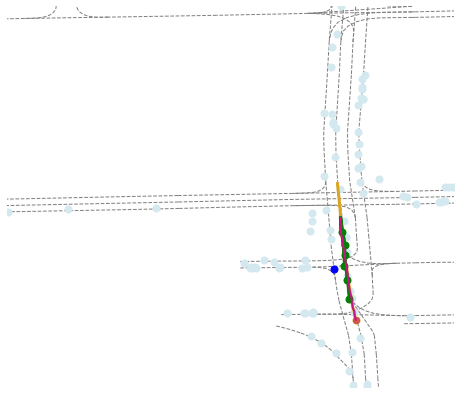

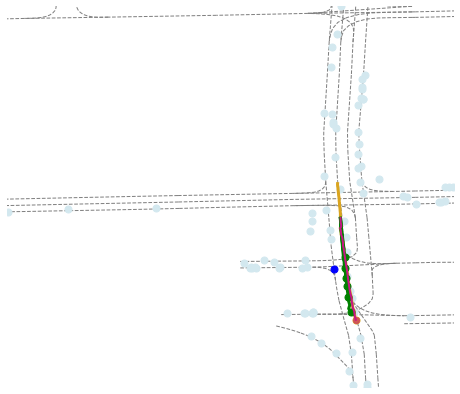

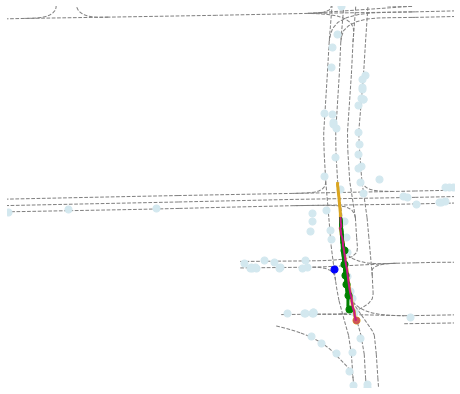

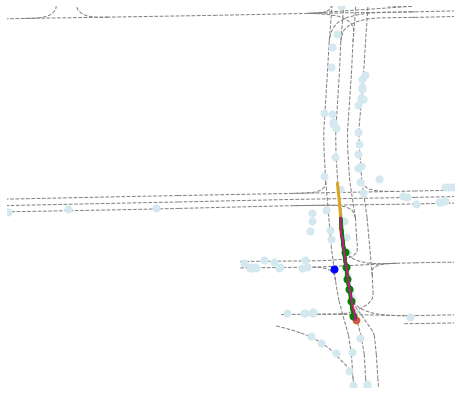

--success


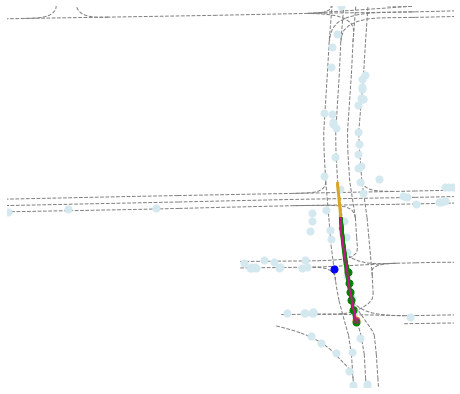





35757
--fails


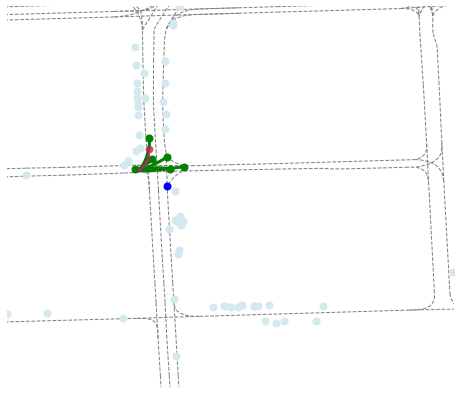

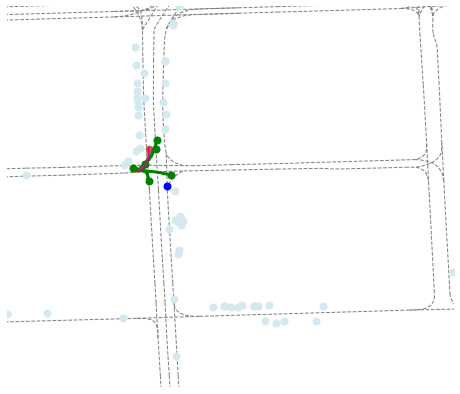

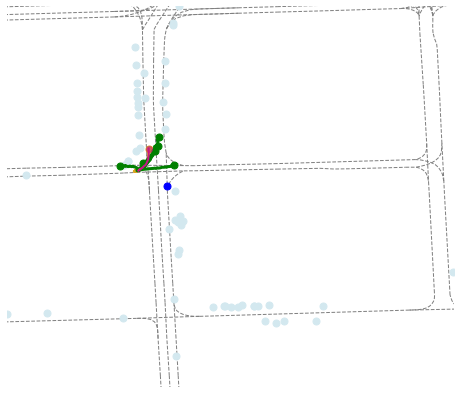

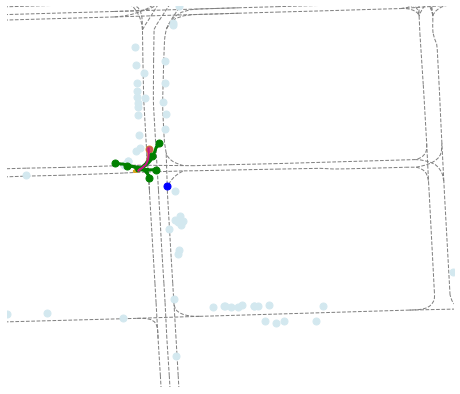

--success


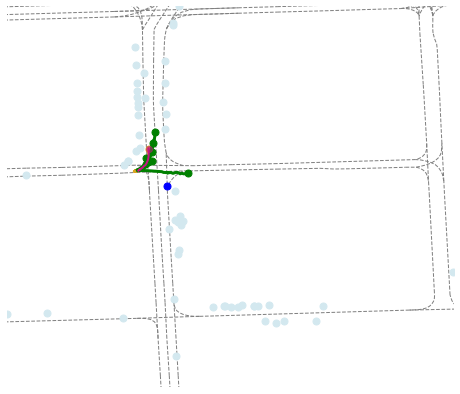





39322
--fails


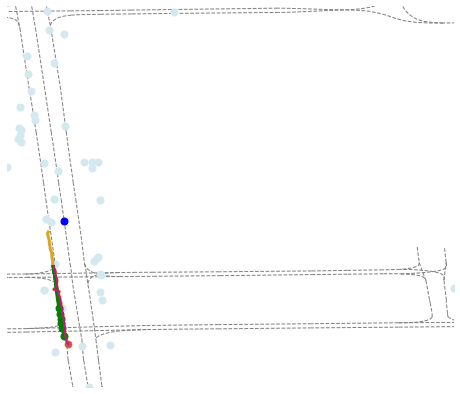

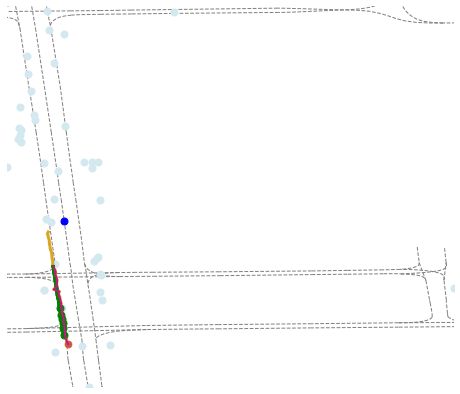

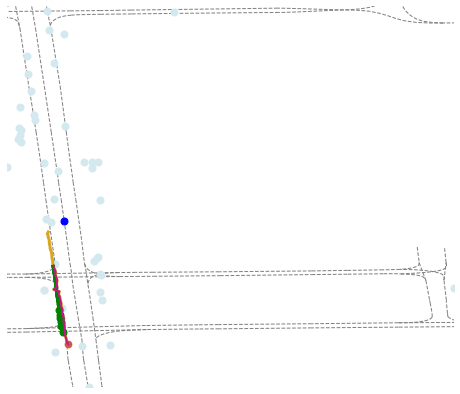

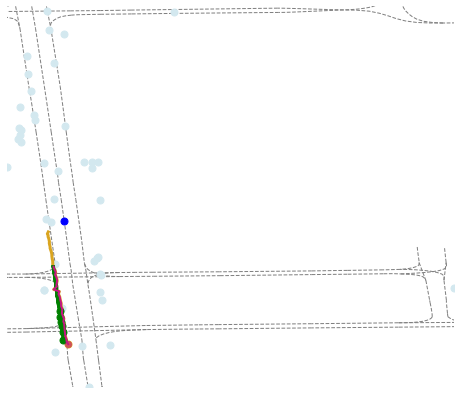

--success


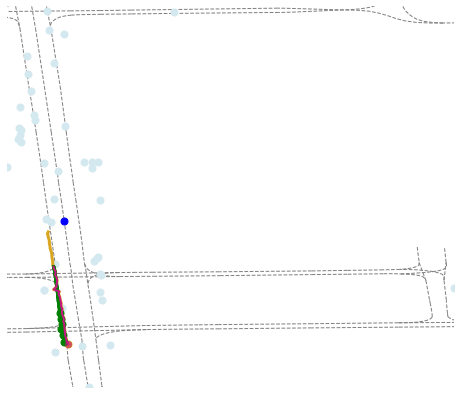

In [26]:
for l in range(min(len(maneuver_success_ids), 15)):
    #rand_idx = np.random.randint(0, len(lanemask_success_ids))
    argo_idx = maneuver_success_ids[l]#[rand_idx]
    print(argo_idx)
    
    seq_path = f"{root_dir}/"+str(argo_idx)+".csv"
    print('--fails')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds[argo_idx], gts[argo_idx].numpy(), show=True)
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_mask[argo_idx], gts_mask[argo_idx].numpy(), show=True)
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_intersection[argo_idx], gts_intersection[argo_idx].numpy(), show=True)
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_successfail[argo_idx], gts_successfail[argo_idx].numpy(), show=True)
    print('--success')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_maneuver[argo_idx], gts_maneuver[argo_idx].numpy(), show=True)
    print("\n\n\n")

In [27]:
all_success_ids = []
for ids in fail_ids_base:
    if ids not in fail_ids_mask: 
        if ids not in fail_ids_intersection:
            if ids not in fail_ids_successfail:
                if ids not in fail_ids_maneuver:
                    all_success_ids.append(ids)
print(all_success_ids)

[10894, 18797, 19987, 20361, 21965, 23338, 23680, 25141, 277, 29417, 32035, 39108, 7172, 9545]


10894
--fail


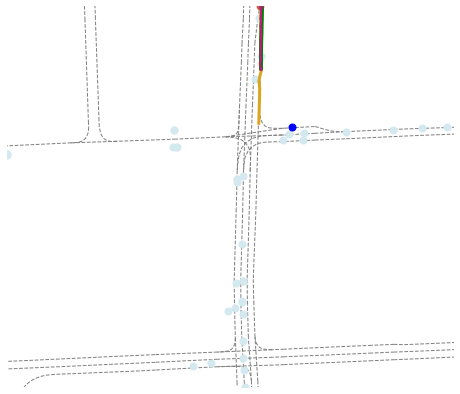

--success


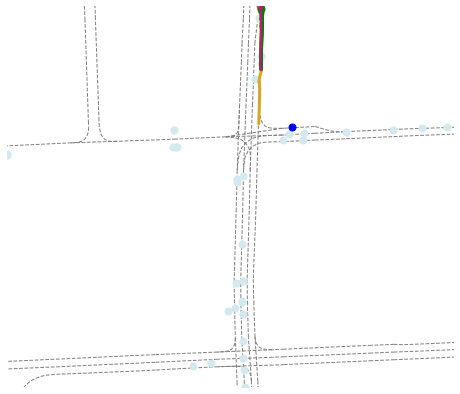

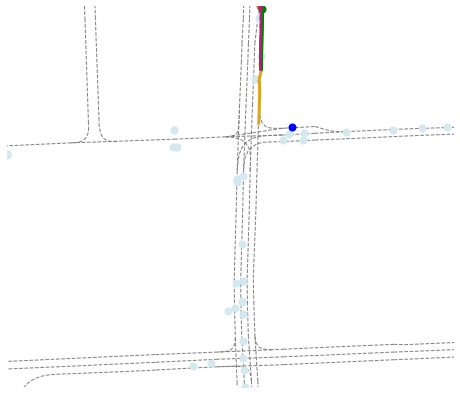

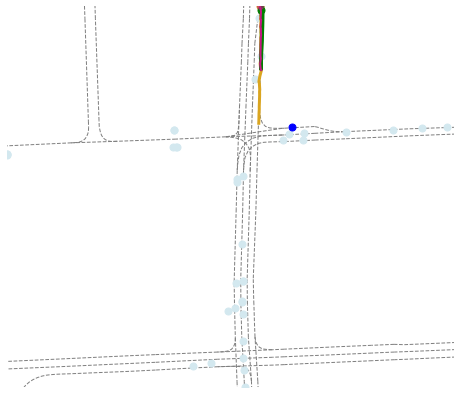

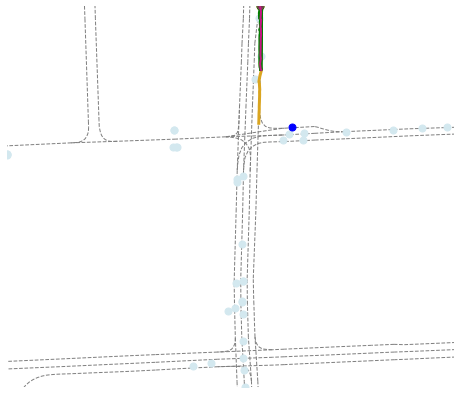





18797
--fail


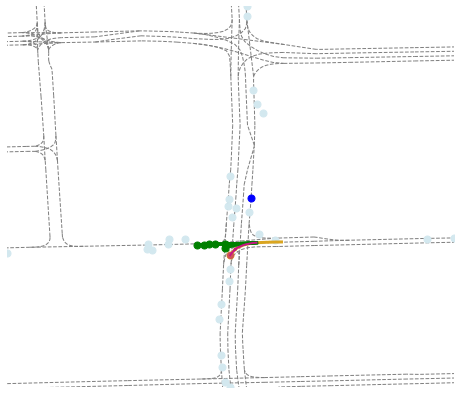

--success


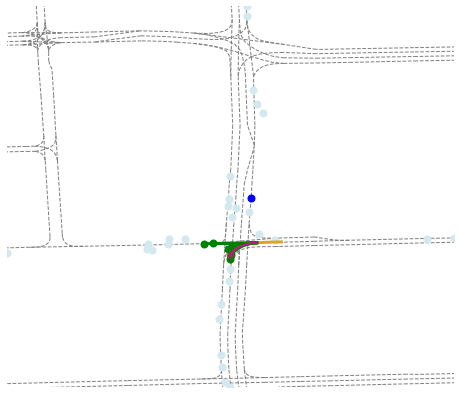

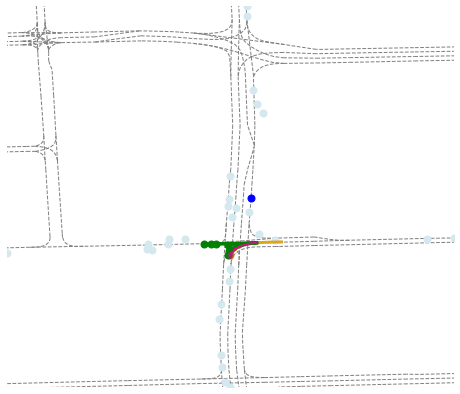

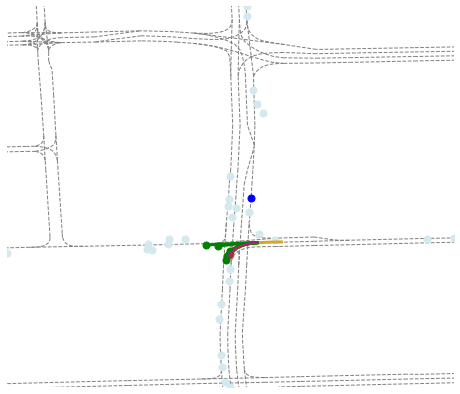

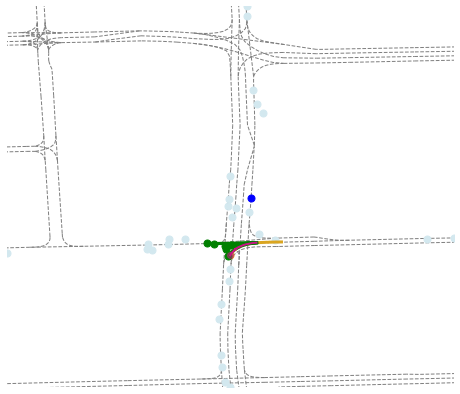





19987
--fail


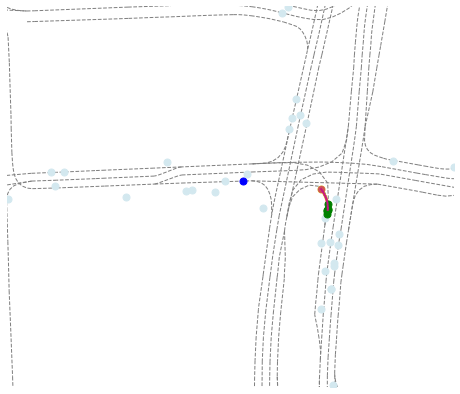

--success


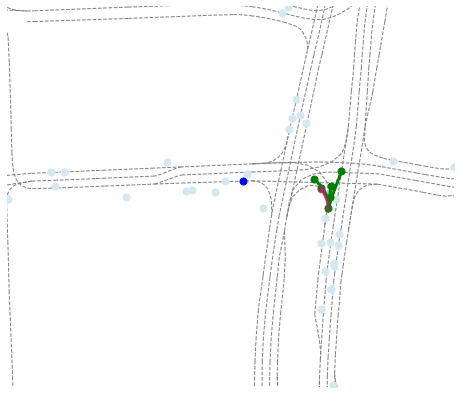

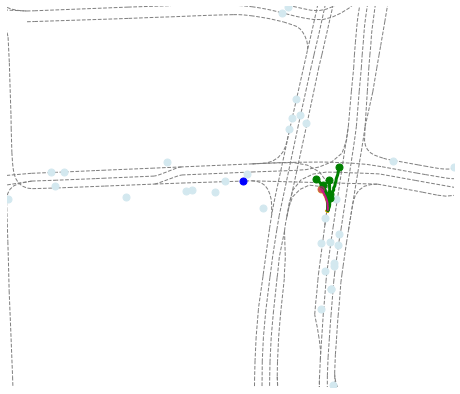

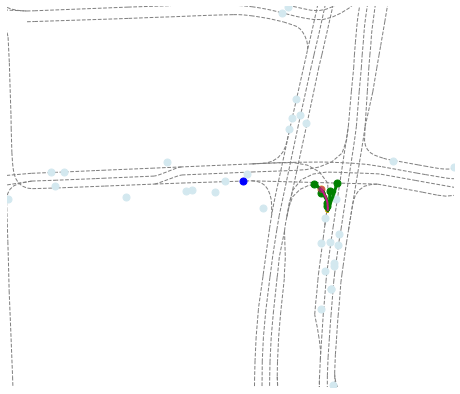

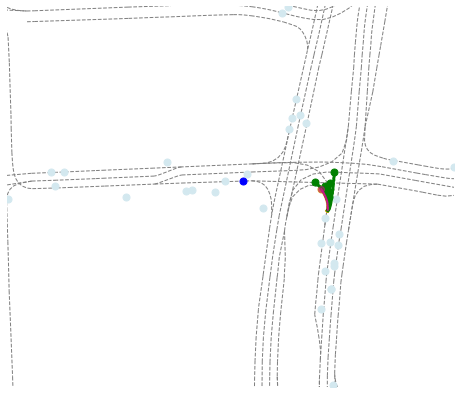





20361
--fail


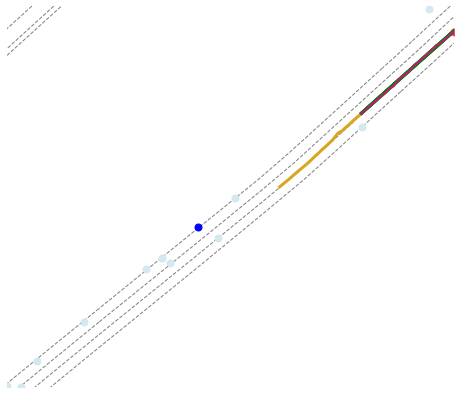

--success


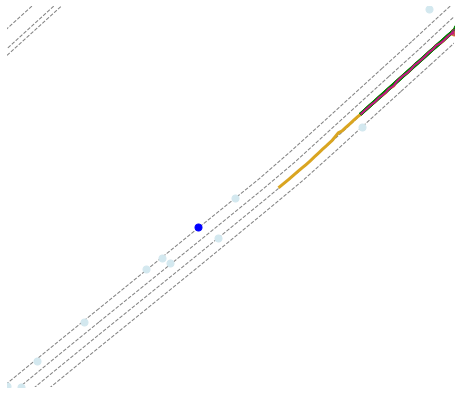

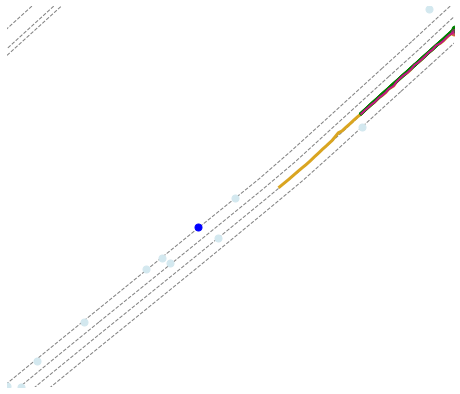

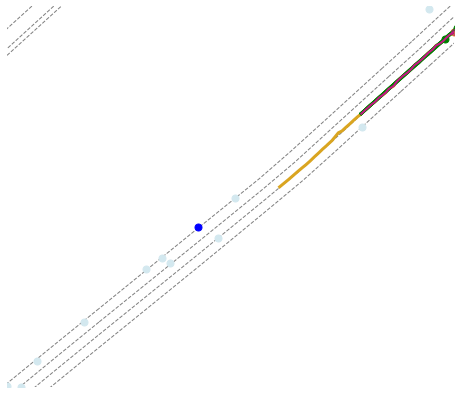

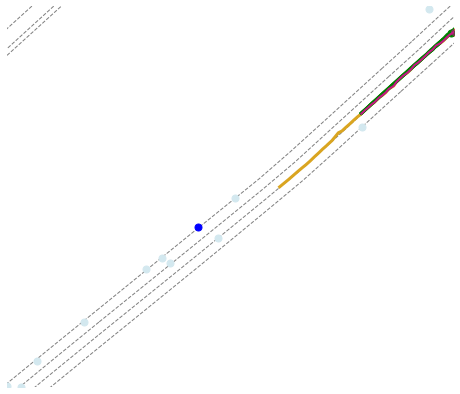





21965
--fail


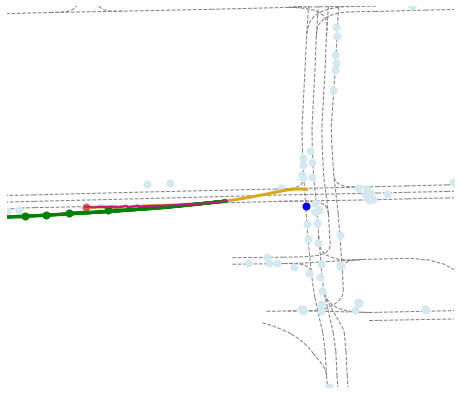

--success


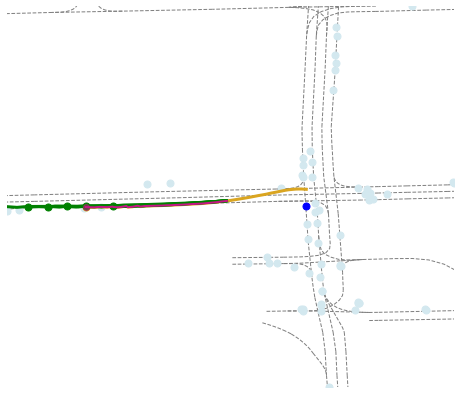

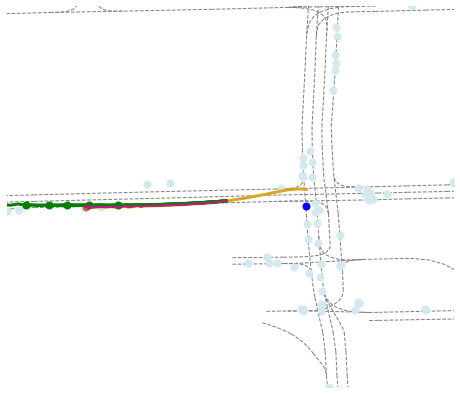

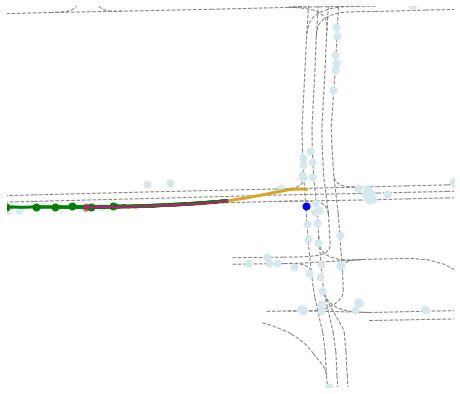

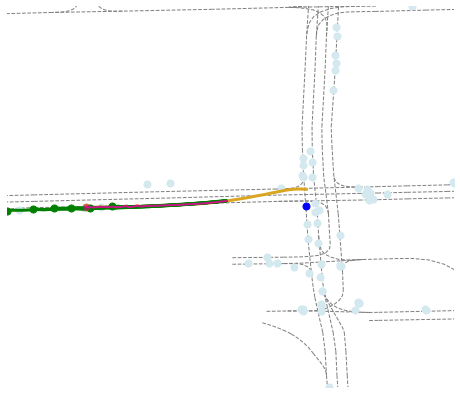





23338
--fail


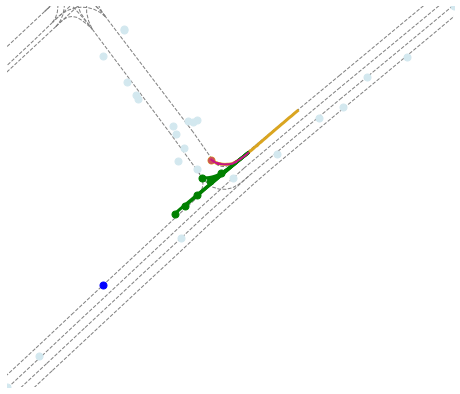

--success


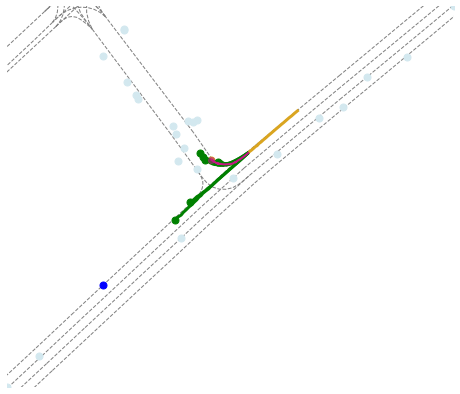

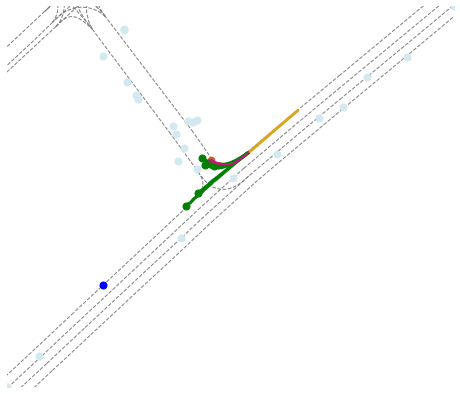

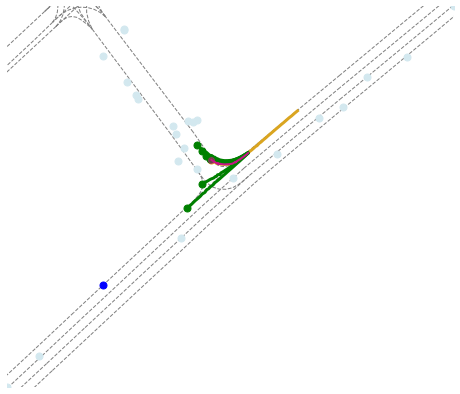

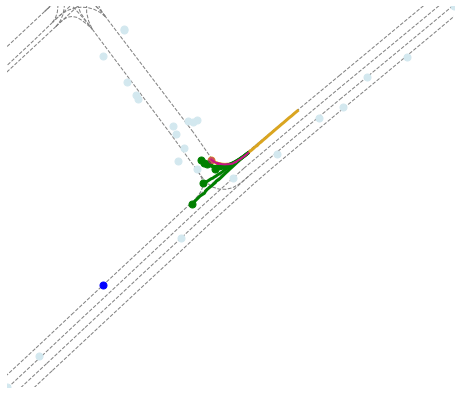





23680
--fail


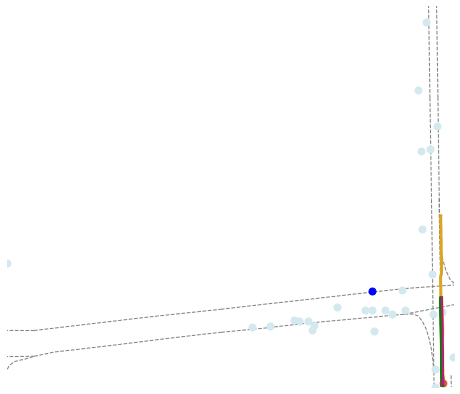

--success


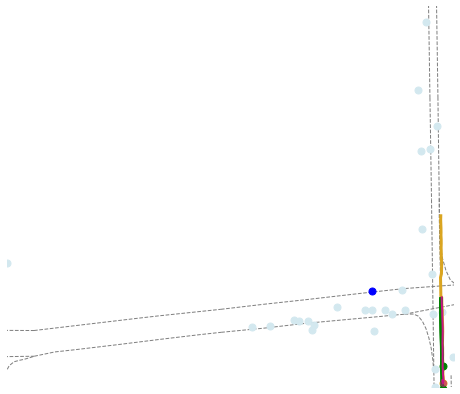

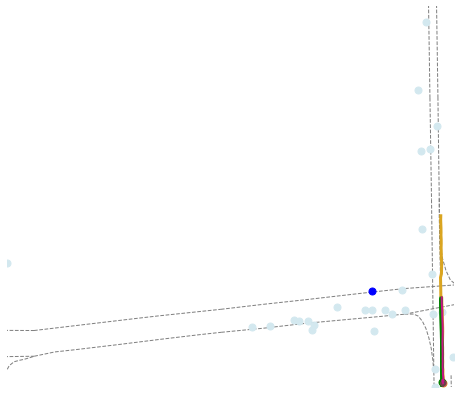

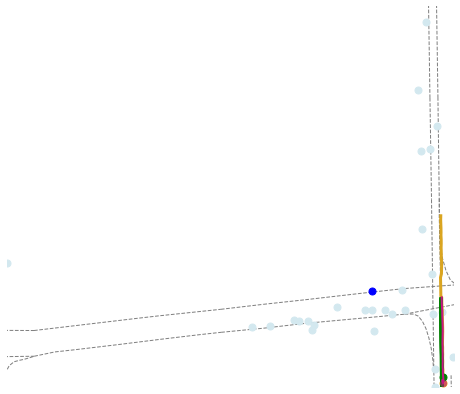

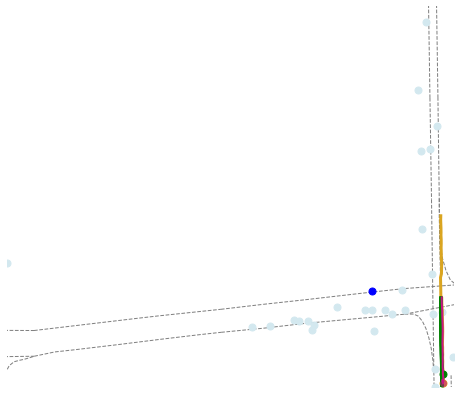





25141
--fail


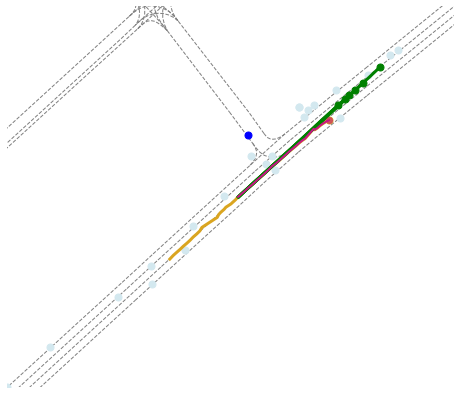

--success


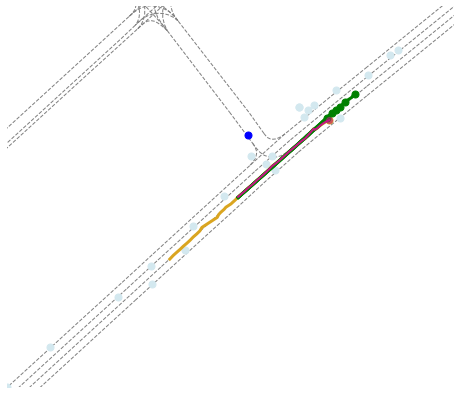

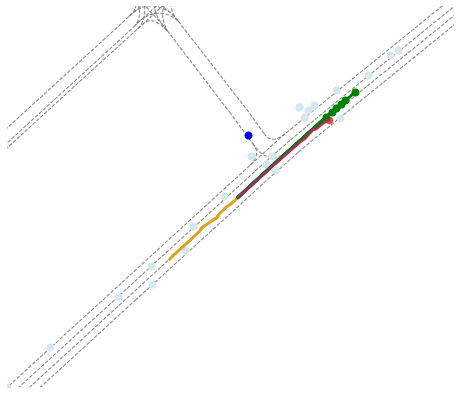

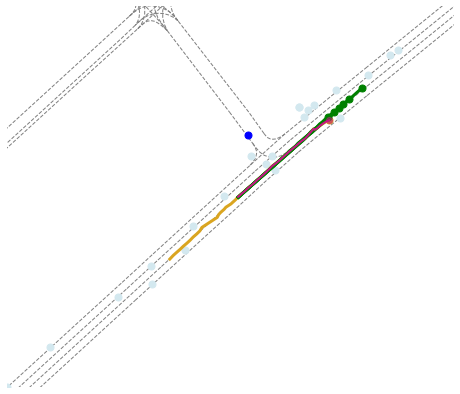

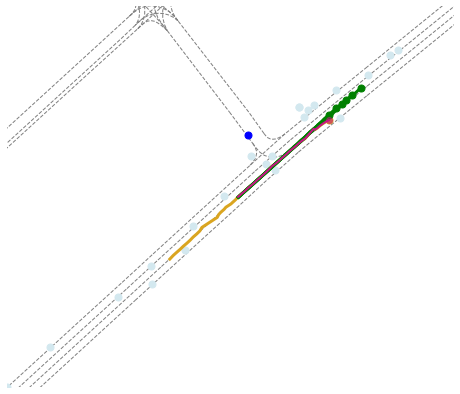





277
--fail


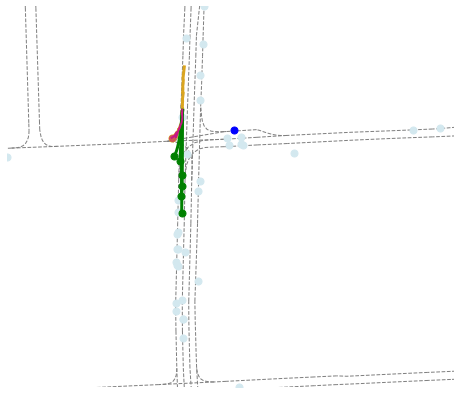

--success


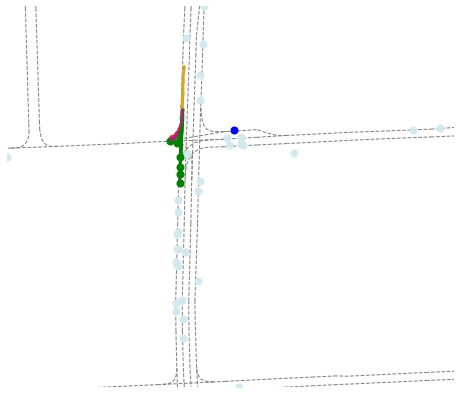

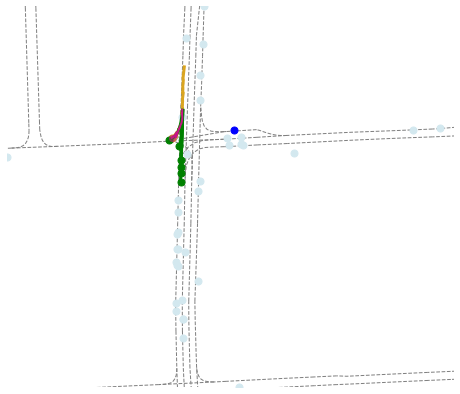

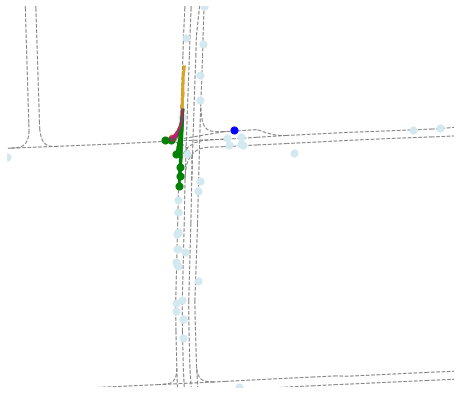

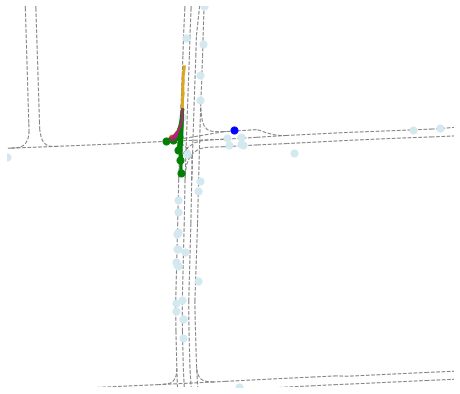





29417
--fail


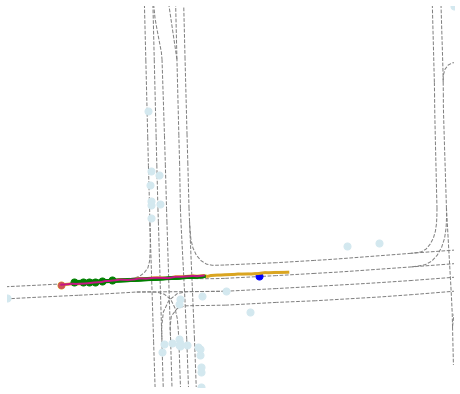

--success


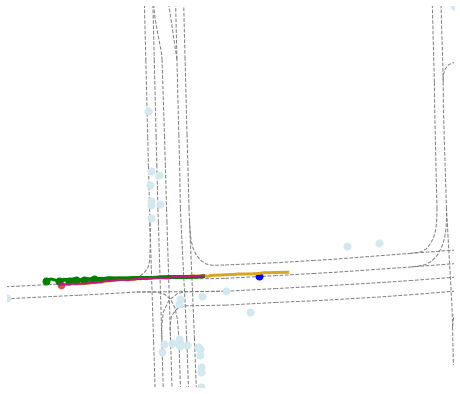

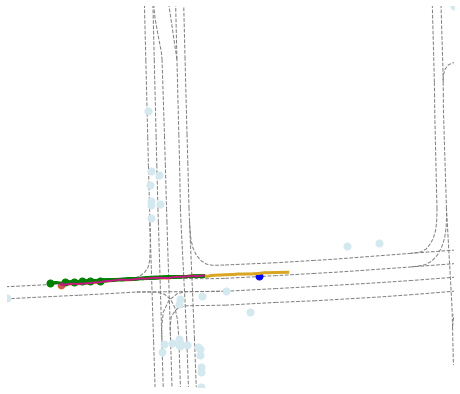

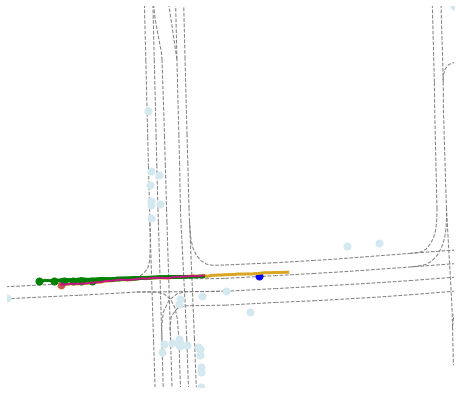

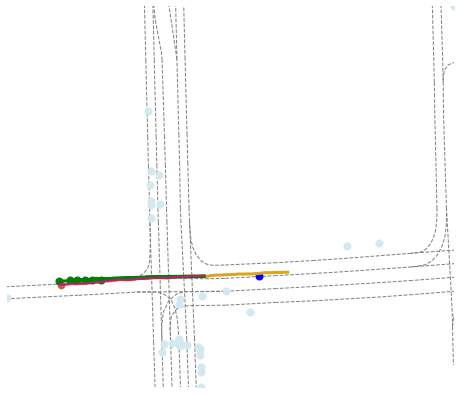





32035
--fail


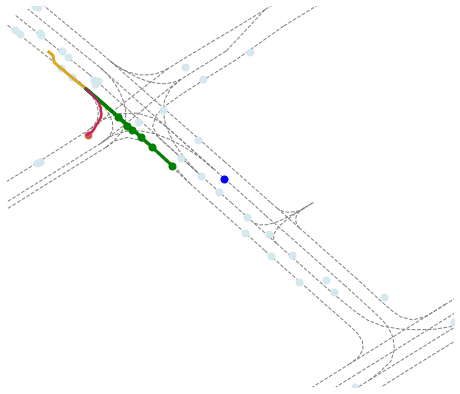

--success


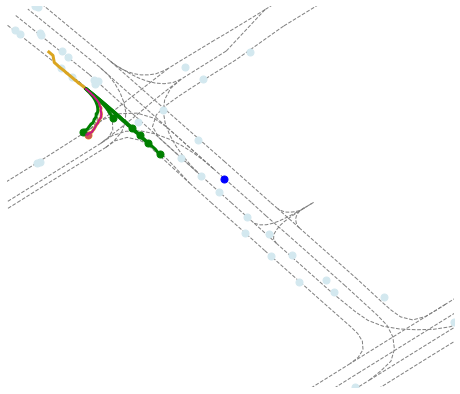

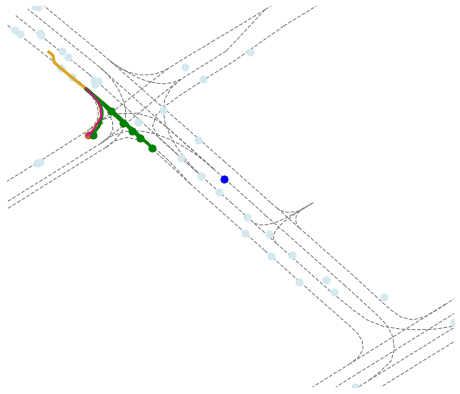

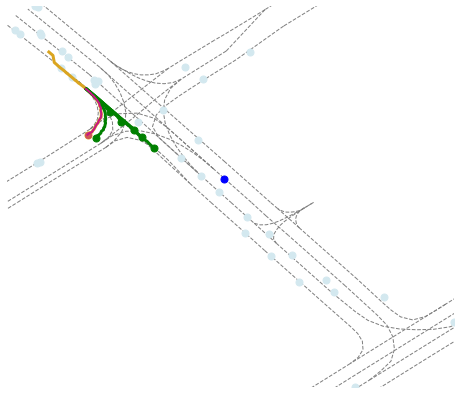

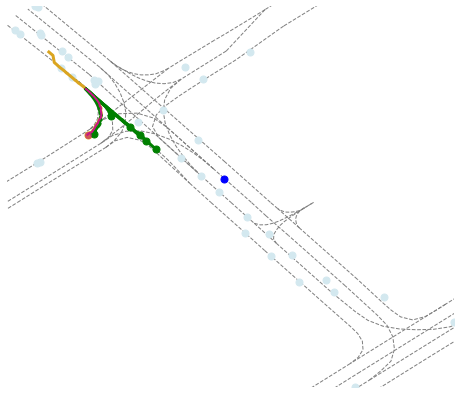





39108
--fail


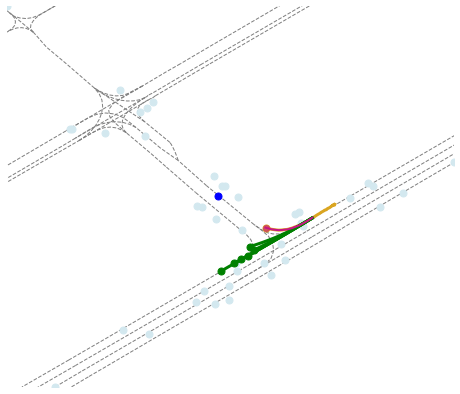

--success


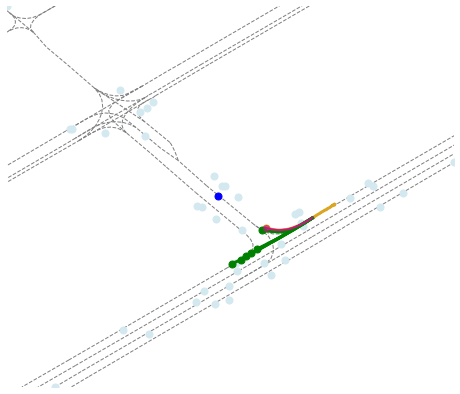

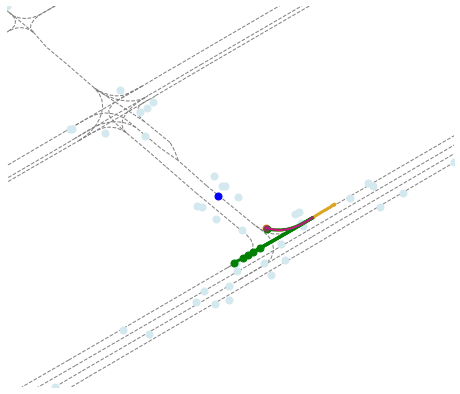

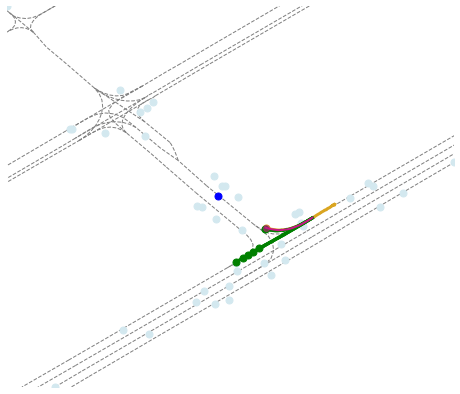

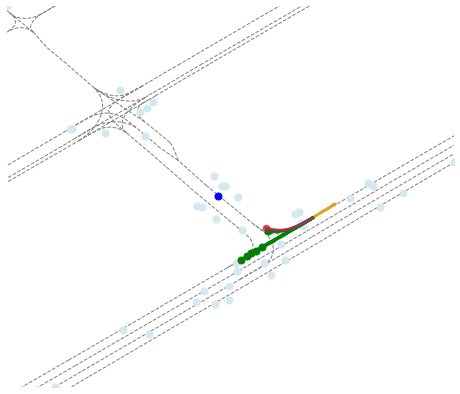





7172
--fail


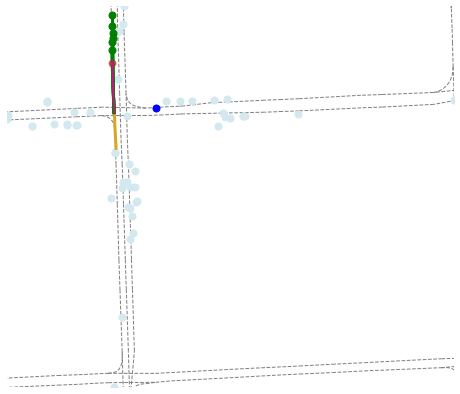

--success


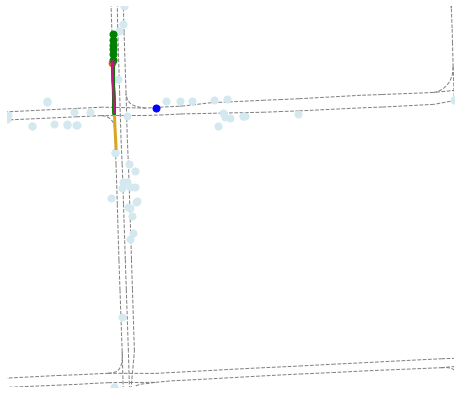

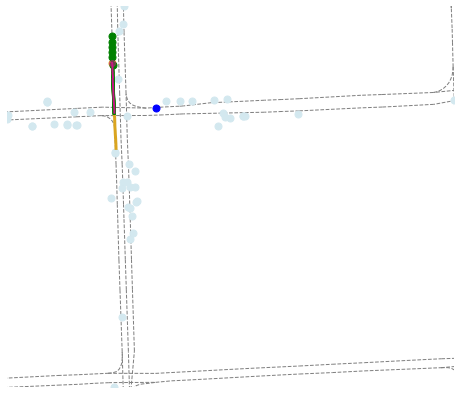

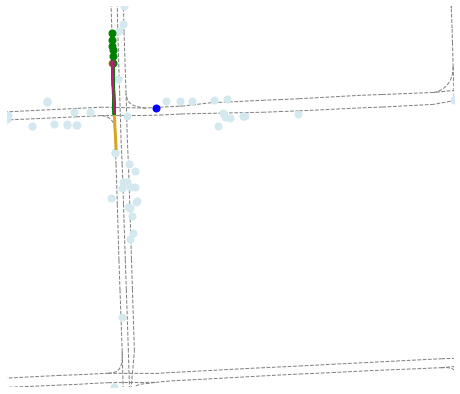

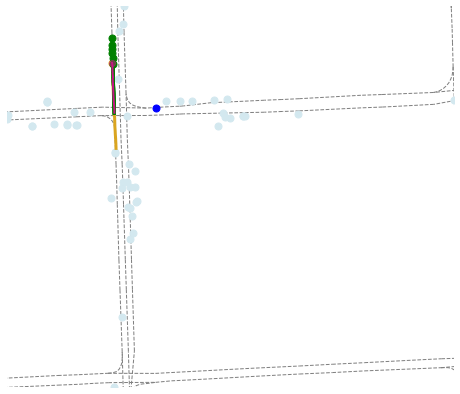





9545
--fail


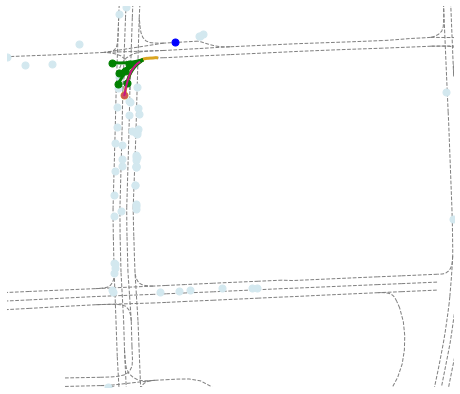

--success


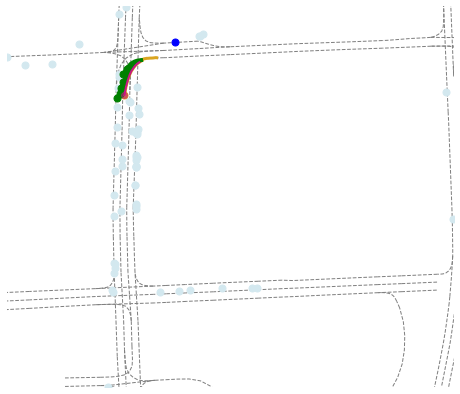

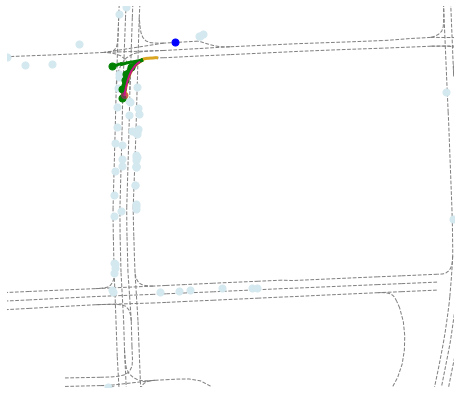

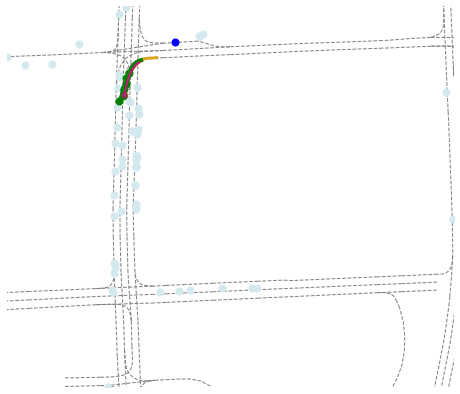

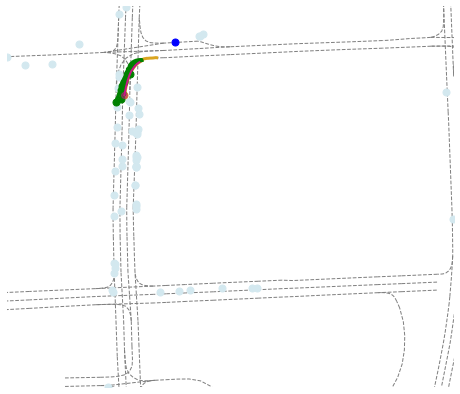

In [29]:
for l in range(min(len(all_success_ids), 15)):
    #rand_idx = np.random.randint(0, len(lanemask_success_ids))
    argo_idx = all_success_ids[l]#[rand_idx]
    print(argo_idx)
    
    seq_path = f"{root_dir}/"+str(argo_idx)+".csv"
    print('--fail')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds[argo_idx], gts[argo_idx].numpy(), show=True)
    print('--success')
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_mask[argo_idx], gts_mask[argo_idx].numpy(), show=True)
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_intersection[argo_idx], gts_intersection[argo_idx].numpy(), show=True)
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_successfail[argo_idx], gts_successfail[argo_idx].numpy(), show=True)
    viz_sequence_mod(afl.get(seq_path).seq_df, preds_maneuver[argo_idx], gts_maneuver[argo_idx].numpy(), show=True)
    print("\n\n\n")